# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

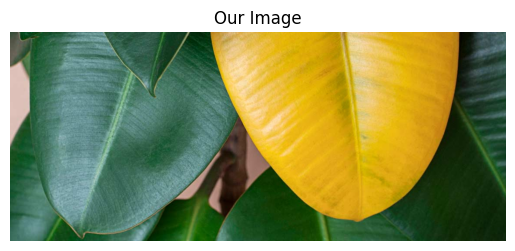

In [56]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [54]:
import base64
with open("/content/tiger.jpeg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())

/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAgICAgJCAkKCgkNDgwODRMREBARExwUFhQWFBwrGx8bGx8bKyYuJSMlLiZENS8vNUROQj5CTl9VVV93cXecnNEBCAgICAkICQoKCQ0ODA4NExEQEBETHBQWFBYUHCsbHxsbHxsrJi4lIyUuJkQ1Ly81RE5CPkJOX1VVX3dxd5yc0f/CABEIAvIEagMBIgACEQEDEQH/xAAwAAADAQEBAQAAAAAAAAAAAAABAgMEAAUGAQEBAQEBAAAAAAAAAAAAAAAAAQIDBP/aAAwDAQACEAMQAAACCMnh68ijS98tYsQwqUFueGvPqRavWKwKpZdFpY9kk6IZ1q9i0ZDlTjqzSNM8zoBVrZUFsws4hQQAMshZK2haoTfictGtlQC3pOCHUlZdpXzMef0M9ymvHVbSpBUIS5vOTFO4Q2laS0QMsr5wlI0QjN01H7mqNHGYQ81qVe2YcWoSwopJnmRodJ2IZfRy6q0z6LpXpEFEczMyV1ZiD3CmHOIwRNAXQY6dMrRKQe5VYKEblc4skJGopOZEZk6mmQKrLQINenyP5dTlSO5a+est1mhe2e8Tz1lpZSsqMKWNbqqnHpEVwSpxroXnbmNVpZ2WSb0pItkrkvMsjDuVO6dlVHKbSYeaoUaNivFNajNpU9Z3JT0TknPQZnz+1CydkA8qoQS66Se3SI6MtUm8O0wV6dlWNeJJpCSWkaLotaOkRqSZXUqofmoTaci0FZMzWUBhSMmmLdNWnwUzogpV6mSDieA82OccXHJHQr1nVz3CvdC9xrqJTKiik1lV01mXEWHu4AIpQQgI630RFeN1gHNUq2rTnEU5HiM3nozStFTQGg8ioVqkRVZF50FPUqKWiMS0gJEk+4qzcRWRjkqCQdUHOloHMCs6RSdF1qMqwma6sFY1ytJUClJ9aaTheepwVaqY8U4tlGiJppRahK9L3MEVpkHLQ5LRSTc9NHpauimbRDCX

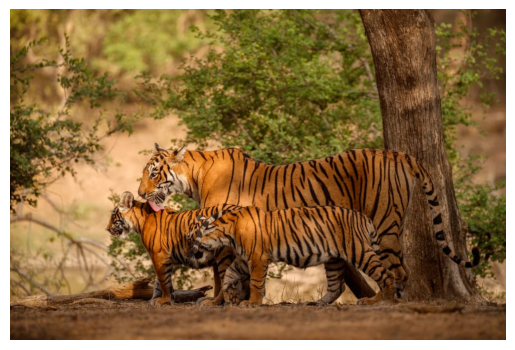

In [55]:
from PIL import Image
import io
import base64
import cv2
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = """
/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAgICAgJCAkKCgkNDgwODRMREBARExwUFhQWFBwrGx8bGx8bKyYuJSMlLiZENS8vNUROQj5CTl9VVV93cXecnNEBCAgICAkICQoKCQ0ODA4NExEQEBETHBQWFBYUHCsbHxsbHxsrJi4lIyUuJkQ1Ly81RE5CPkJOX1VVX3dxd5yc0f/CABEIAvIEagMBIgACEQEDEQH/xAAwAAADAQEBAQAAAAAAAAAAAAABAgMEAAUGAQEBAQEBAAAAAAAAAAAAAAAAAQIDBP/aAAwDAQACEAMQAAACCMnh68ijS98tYsQwqUFueGvPqRavWKwKpZdFpY9kk6IZ1q9i0ZDlTjqzSNM8zoBVrZUFsws4hQQAMshZK2haoTfictGtlQC3pOCHUlZdpXzMef0M9ymvHVbSpBUIS5vOTFO4Q2laS0QMsr5wlI0QjN01H7mqNHGYQ81qVe2YcWoSwopJnmRodJ2IZfRy6q0z6LpXpEFEczMyV1ZiD3CmHOIwRNAXQY6dMrRKQe5VYKEblc4skJGopOZEZk6mmQKrLQINenyP5dTlSO5a+est1mhe2e8Tz1lpZSsqMKWNbqqnHpEVwSpxroXnbmNVpZ2WSb0pItkrkvMsjDuVO6dlVHKbSYeaoUaNivFNajNpU9Z3JT0TknPQZnz+1CydkA8qoQS66Se3SI6MtUm8O0wV6dlWNeJJpCSWkaLotaOkRqSZXUqofmoTaci0FZMzWUBhSMmmLdNWnwUzogpV6mSDieA82OccXHJHQr1nVz3CvdC9xrqJTKiik1lV01mXEWHu4AIpQQgI630RFeN1gHNUq2rTnEU5HiM3nozStFTQGg8ioVqkRVZF50FPUqKWiMS0gJEk+4qzcRWRjkqCQdUHOloHMCs6RSdF1qMqwma6sFY1ytJUClJ9aaTheepwVaqY8U4tlGiJppRahK9L3MEVpkHLQ5LRSTc9NHpauimbRDCXI87i6mQ0VHORR1jrR1ZYY68HVWiC2qN0sWJOR0A89BJ6MSNRKsKixXfkjZKoumSZOZcLRaXSNNJHVhpEWlYO4iiykxZCfOtOQ+bQEZooSuiNFjrAZiQrPRKp1u4BMtcx0NReR1YQiPO1ngaefcnFBJbpPJzcGm4dQZaSMpUUtwq16TOuidqUnWqzqqyWhzIO8rKtHrZaMrGkTqdl08YKWz6iuHQcVyKd1gYGnKLkyBh+BtVpBNOdphXUtuRi1FqZl7jFNNsNtNCMZV5kzHThdPSJzB5/r+ZqcRq3pLZtMs4WmcLTlRp1sNZtL1EoIls6UeFKGnMJNMCuMtLl0q0i1SLuT7lrp2ncqeNp0QfEKILbZ2si9bs7jqXRlHqraFnyPEWRTRF5LStvaWgxacurMoroHpKVWZ1eRpD1m+cqriA/MLzcFWQLyZH5CNyOOQsMnNSFkK9AlQjxy0Uk6voO7OVK0jPaa6UztW2cdUZFCqzVVe1A3IrTqkpWlbWuWpTpPKaAZjTd6mzcDNaWqqvRJG/NSqsU1ANBnRLru5E0ZisZtELdK5WspleEtZhRFedlnSktznqdmqtgYE5Wmh4dIGFLW5uzosjmaFl1mfUFinjCkdXEiHVekvTO+d2fMsbZw2E+dQMGpWZskV+Gth21jsnVYwtkZ1mZmTt105StJ6MZ4umYxmwynhJ3UgXFBhwzyeHDcJypbaSqikMj1i1tUUtLRzUQ0yzz0LLPphIlElc3zsVyVoWFdXVc1RCq66TS6aL0rFA3ZcllRGXlqqsqyVtTnSg9Enk6cljiDmuTLrXdzYgdXWK2z7tWhRdGZiR0R4CUQ7VnsU5RL03WzjNS7TvJOerMgZLSxbSVzVpG1OLswukkpPuOB7RuHZkxRLWdGlVS8y3oYdzaR1pLJnEcCAcpF0HDqPSWqRHQyspVYo40XmI9c5zm6t2SMFStc14py9HTpLVRQKpSVpH7uJR0rbk55VSufQtI6Yqmha0ZtGEj02NdcitapaM6IJtM2oiDSZF4s1k2Cw+W86FA+ma6ODnSQgcKycM8Qc9WlHaRdQd+kZWfV82W7CzxZybKSt4CWuDTm0oJtq3KEmV5dMKLBcAekrE0rMRGNgZXiic8HSlMUhxSxulqQsjOW8GsfkIvHtVOZZHeHIem8O83arozGa9BcpjRGNU5oKlNGHbbpxa8hJKRZNZ9k1I1rqS0LxZs2XX4mlVSBtyLQNkDxOnVVypWW7S0KJblOVOVrc0NM9WHXmlmflWNYFWm6ZO0EiTWIIZsniUekzlVc7W0UGSUnXpTQ9l3Svcz5wsy8EoQ0dWN4gmx7YkdGnpi1yjrMHtEyacsy6CiUGmethJaajmrKSVZndpwaGjaRqWVJZ3XinGi9Cs0gzqJWL2bQo5qoOLNN7oT6aJWAZpnounODDcgkaLLqgHq490HlBdA8pm1SNzaUmoM7PUM9GaWOZhc8pFzUwObasCug5LS6jLou8qqJNmso2asleV4YGI0Ono1I1tqytKxU2ibBIPThGzIm3slAIqs6ER1nqzGQTqLFM0TUgzLoWL2WaN5Y87jEiJMZLcTWrSpUg6tIOBSo5oVayCV4o6i6uudrVz6M6LplNNMplTpx12MtEszI8m6aNJ1jouBqd0vAkNszF4uhWV1MlkNzovmbGkpR5YtXPSybrELhmR5qV0JRA2YFY2xDJp1AIqhaXu4SPyO11JcuhszVZ4VkvEZi9pACTRLzWiKe6J6ZvbXOGjS+ctPByG4rAIgls3dZmZ+GZuWimEWbM1UWczXKIkpJVsqJNYRTpC3GWbrSphkDwiXbPQIPBhRbX5DJUxqaIs0sl5arSRKykRltNE0ASGdUFfmlLpylDSsS1lc88ja82qT7YimF0088d2jUQr3Fjmg8F1zmno1NCBgheDxSTSndzltGCrdM2gVmqCw8q9JIOts+C9NNymAlpIildNkaJzrS1oikON1A3MMpxJRuOkxR2Z2ZMNFRDiWkqtE3VrOjpmRpKqM86LzkTVGizTgFCYTKBGTaMdF6wBObxQivCzt0kFqrKSbrD06Wu2fpbOtojHRn0ULSxOo5nWi2W6bS6VS3OZ7o2rn0oFohaSNV4ViqOU6rdnS3RTK2WqfKjKCKwcmroZ0sN02Fs0xpnKBdOp5qaI7rEqrP3RnYrVI1UWsrjuGzUY1JTslnUTsymjPTOjOOey1sN5m6qBgtLYLohoDzaT4iArCmfhhcK2aXla114ShWFlBRc2erHp02Y9iy4Dpx3Mnkbl1RkYqYaLCmpPl7TkpLbplamXLQIklk5QLwso0+XVON46dM6al4rbo54ssHZ5Qlj6M2pZVss0mjz62W8+ulIvp6Xy2alzm5zSS15qvXFaHMXg1yNbQIqOoew8hlPOUV06GDqB5GNcUaFKT0qQ9vBwlHistRClocNUMu7Hs4ospbkAHVVWxJ2bREjR5Y1nUzq6aloN2ZQcuQTp2MUoh7jdIrz0I4yKwe1ErNE5hVOXsWrE5thTpZhgJLRn1LdJ1Wi8bHzahMr5ESde1g8ayxW4EhomiuptDLSGdllCGVXfO80G5GWdCWRTL1oaTpWzyc8FsuGMuFwdZZhbKNea2knSXOUW4bTHl1GEV0mQHly6KlwS24dkk8+hVn2oJmblpj1syBcAAS1njeRjLltyBHheMAKN3TSAyBmLKoaVKlpLZFpauTbiq1M91Xjxx4Sii0l7RmJdhMZ85p4Uy3Oh898jmrTMCVS2XPQQEWhCtjcvSHgEYMNanzALVTNuErhfkADJx51dcq6UpGpQS5lWBbMzHtU2pWXonDVmuW5SjOzzUnflVLTJx09qZ6VaWHaVjOulLJOeRp3nlyJ1ySotpyqiJWgL59MRtn0jyrNc09Oe5Lpy2kTEiU1adyyNMpRKUKVDZvNnEnTs+7AlpJ2HEgxXibHnnVPUlyuN2i+b5+i05aZ6EiDZINdUHciW5FKYtmTVjryX3rmnWHFZStWNFPLMvKNknwWysaJR0Z9WMikKYI4N1Ve66UOlk0uKgtzM5jWY442oHFXk6YC2OlzqRAW0I+dI8Ot09J5XtIyWXMtPSWjNmjipzvOkSvUrOsKKNCdRake4PEDcGUAdIeJDN5SPNksSrvbGWyUmE6usRqLCS059OPclpckipRdWVoELQNaERFqEKP2l83OdWI0LDTJnsmhVhslWUlbDSF45mRZkyG0Q0mXr9VDCuTSCJ1FUrXPplgDzNFD6s10Zx4aZJhvKnTbcBGhphZPEJbovTsrRM1WuLiJ0QTOiFDiCyG6cc0oV+tUsbZLSaclDUzRpYdVTHSd7znpz1lr0qy7TmfNWctBPUuikF8Qa8iq2YpoMmVpuBCWAFQvxEAAVl5gzoIEp4GmXqwos11kXbnmZjRUlajNSnqQ81tWFzecusZ0Up0ihdDb3TJOfHSdQbaQ0WyxmxGpOeWxsenJZXCYG2T2a09GWZlz21TR1ZAAlAyKXV5J2loqHM5HkqKrKUZXVep0iMCVVUKKSmB0r133FoRS5AsKW8+h2R1dG5HQgnQJM27p4NWbDrnuMzq0/L11w7qPEDFOCgUz3SbCMjXIqFlr07SV0ZNM2tcL00Z2sXiROCpqWSzWu02mnKgm8tsCdQuRuFkVMLm1IOV6brRpFq1c94fuMcxISop5ckZu0VZ8pr5WWePWUWPVSiJBMNRiTVm2GiVYF5XaGfTmkKNcm/Zo1VzSPR5GkmENExoBXjaTO8nSDUFfgUhRLSo11O8NmGVNRWQrotxrqwpQyZkaZNqrWb5nmVR+um4GGWqHIVBzTGfmVuPC9zIvK0gloOZCtmXOupbZOaRJyp3DrpgqhVVp+Vkk2rPJIvdMfXyWVBVGtC8op2xrKdE46xouLtmUw3vyOaGaiTOl3JWFR8cq5xr1Mra+MZ2CMWlNaSNmmou5oMGlY9yKr8RL8oloCQyvkuUWs2F40smTqaz10SlyChshallzPSJSV52ZdOe8hx2BG0tyyrkpI4ayYKtK2irx1slUrKitFZbEyDZCjRRGxc95rp8JLUyaGnz6l0klFkBougW5jyqTfcJDK8m4E3QUElGjQsApThYydzRfmbFVkIFA1aVhSKRohPu65UOFktVrqpQgk9jObvQyyxmV1mrRtBa6ytq87VLcia8c3JpSHW3dXipW8ueL8G2ag5d1k78smZia2EIW6ziGAGAOICV6DwAy+foNaZHM4QXPKmpM3aGhF9DrrL1Z1JmSZtko0RDtZMasA+fTLbpq0l358srFdBVawa47wgephd5Vt7LTJp6Ioc1DqztPTEa3ESIC2UzttnPaoV5Sbkmq8swxLgN23KVdWQAIO5nI0nYSncC+bWZo0WNDzfEDhmlFDqoWAAeAGKTLdSK4FbgefVZXnW+PltIPZUPPOti5qSsnp5RKTCdqyXVoWz1foyjeMZKJW2bPRkJvfHqar3BWPEAbhQ3Ck8dwIPO9HzNZ2Vwa4qwjKeYRCVRqJpesueG7z0zvQlKkqQ+czZ92ZmZV7B22Ob2Kj3PKcVltIqqx0SkRObTiOiLvDV1IGzFMdCp1+kErIZ2s1ZdIU0dl2yZ1qrU1Aqj8oZcQyM7LcjxFaR6XUjGUCiBnWQweYxRhzyAtmqLRaxKkHxnU03uyUNOvIdy9VSjRylbQO5OBC4TzuUE1Nble06YdOKc/RTTnnL6edIW6NOHRAktCLaEXLqcghvWOF+WOmbytVWO7uXiCd3cTjfpMrGhKejzqjoz6KfTmrnWfJYazs3RlZAth5dfQy6RGXZ5mvWd3Z2xuF82rUhWGqMCOvTGvJrhnU7Yx043oVzlwrpCqZqsYarVXTVci6ElSncmW9uGiWjm6CWSs4kzrpLTNV04tXNYp0G2q2HVz3k0R6xs3o4jQx6XC3V3kx04jX0dUTRRqcGmh7hVWQQxVwWg5R5JiPoy7JAUfe0myp3d0rHlCAa4kqnUMeNqztvnpEq5nSqqnTpE3gveQ+X0c0tBn2xhraNOE21lShg5PQRI3y8eg03UBxBrKkPytb3HhQyr3DgA5SGfQyPg2iXRKGqXFqRLNaQ5bq1eW8dyxDD6mSrZNalgaS53spmwep53TGyFVzc87Zu3PS1kylAPvkRTpIEG2rSbKjSA/cyq0NAKDIupMe6j3DO4ZL5+mPWzdXn0x7fO26zk0DLVtc2xo46LrPo+Z6OCX0e6ONZLTv0wMuuC25Ujo7cOp6GaixDn7WeYA603F4gp1exE0BMqALumLlFZuVp1CrzhVYdR5RHklW6crWhfFFpyjX0rtUa2POt6efclbZlWOuNBK+bvs1K7SydnM8PQnUmWqS6iDs3S5nr0Fga4MBAykMI2VO+fBrPsYUljejR2GPVWXY0xFlwbU6C0arFLRlvJmHdCjL0xcG3DvOnuZc+bQN40QvkzrN6WS2shTGy0o7dZ4CudZnz7bIiOk5a4V9LDtnm4NsG1mezC5qwbozUNmStyX7IbMWyKi2TUkHVq24tWXN9LJoyyiyPrLQ0RBOorRnYxm05NJnfk1LK3Il0dWheKXk041jQmEgtNJhpyW6DVoaVGiDyoCLAGB5y92sCqdHaM/Lo5PSzpWuMaxa42s0dytRhoCWy+jnJ682o49xxUik8SFUpiDHEcMytXKyx0ayPPpxzuT+bv7csmvNp5dKzye5vBzJaJ2o+N45WxY1smq1qhbJLS8a5pV4UyLOx8WjP0xs5TLHTj36zHDcSuqkg8LbxPQqS0rNpcnoYNtmPbl0S95npYdZ3zfsbzEHeKYPTir9m05qY6jpjVkZpW7NUhrz1sKvOXZm1ZM30cerIVKmys2QXRl2WZL59pklbMWmlLO0IktWUGjNcEgOs3qxxZzrBKS6lLVqKnPy8KIkQqVQSFnntRrJceQg0jVr83Zz3sONprUY8MxrQPFXZWTNdVKGVQnhR7uACYTnAgbjmUhHcZIej5ubSGrNnZyaZakdSW1lPS8Y9OfoU8z0it/F9KVfO25eXTJpwX1N8SOXTQyNmiYOoJPPUEHfeH5UlGzFpTNXPapPOpi0w3aymfbjl0ii51k1xtZn0ZtJmW0tZvTsku3yvZzEdPmabKEjOslKY947SEXo6stlT3S8lEs3ZNmTGtmTVis1C0wCd7I68eoz3RKtKimdhQvlp0Eoaq6PGNp9c+igTCdOrSV5Vu6crKJxeYGpmVgilukwWzbN2vae5b85vSOs4tPZc30I0q0LrSU9xoHinMpCjcTohGI4PAndwCIuPx4U8BiDU/PqmdNEdz2o0aN48rd3duUBozGluyh0wJXLOWdBbzNNIvx66Joc3gTqT6hrHqzatZjn1ZrBoShlflsJpJU2TtkcO7z63BYyszKYtOXR0xpxXrjTeb6eDWd3ZtGdYs3o+d05+ic2rG1ya0ITFd5fNVRuHSvOqJtzXXOhCh1nROks6z7fO3azm05dIc2rGbpNGxA8y2iLrnrn2IryqZDws0PPXlNnlmysOTktKm5KwKROkxSkZbN1vm+pgQ9bsdc6uJ7IwZfbyImvgtKQ0KC3AKlSVZCVIVKhKkPAhI4EkzybXwabRlpPUts8rbGbN6fl2owonWzSsqc0dT2MO/RmphaGJqgVsyDRl21o02r1i3Hqt56M0uWlXmmZ9K03mGbVOx+v0uKe7LZbLsEsjTCmrBv8AP1NefRKxqw1Zvm+hj3anl+pjFm/LoTN830vL2dM6MHoQxrB6Pmbt5sOHPeO7DUyWnTWVUgsOaW/ccay0za+mKTdcXNqhTUV3zRqxbclaJUSzpWUlDfSyVjklreFzIKxsrswacyjQvl1FVZwsWU6NC90hrW2aEUKcos+pvxPSvTUyy9LFi9WRj0uYNZzWOpoOaqOVMpKA55Oj8ODw4YqRipXNHfBPP2KCUWz6ujNr8fWfdv4aZvs4MhraNsaxtr0I+baOdxZPXVnydpzJM2FkJa8+q/M2OtbTpy6MUU0Yq4d59Nezy2RNFlQ/RLDv8+tknGamDbg6Y34dmYuOrL53peV6esx6wlXzPSyazqOLbLjlvyazumrZ15zGnTGhsuvntOHSxlfN0xRXQe2fRFQY51j9DD6G8chnnSuI2bc1oy3hZLGnSdi80jRCi2Ic51PQvC2NTya8tj681I1zbsWcbxRDOVzV51q6O0qT0ZxgWiPq4ldNrpQoCudItijDurhxMzPGyzZqRVOVC8qyUHIHgV5k62vTI8l86ra/H9uo5PSnL5naxjWDL7vl6Z56M/Xn6no/N+tN63yefm+lbJPnfW7ytGuZgFR0KIYbINWAebVuzy12efpsnWGbWdJybBZ6s+dXy6shqUac6y6/J9fWY+f6GGzWstJN47JfJ2DVqR7D6UYzSVjCOwh18NmrNrzm3Ho6WF11nmUj6Gpjy6DZKd5AvKktstcqU2QuHLozDqWOadidI0sKtEojcA9YFEcas+lnl15NZNc2wabx55dOamLzlXquLyAUL1y7okejDUl7UbKUskgu581YsZNDDuUcSZy3WISZJsDDlSUZGtCspzcSXkej4+odaivSeGzl0nmdZqvnaqRgzbJ7iDVGW069m0x6WMGgJvGkM2ddk24bNvn+jjsGlm1mOXbU8ff51+mLFNXDsnn7OIaJ6RaGuNed6Mnsxb50szqlaw+jj1mHfnNibMmg8vdj9HWchcy+bvM9ZbpbJcW/zfSMW7D6EvnXgdRr56wiNHWaM/LA9ZMkLDWdTEc+kZT1bwz8MayVrk3mzliasgzJQFc9R+TDZfb5nplPP3YZZa8ltTQRTmz3EpKLIVoKLI5m5NG6wI/LtOjs9JvVllLUFyruRM1VhZtfBc0GbyzPdZwdlRh0Hm4BBF5+AQhh87W1sZV7pzr6vj65bDRg59J6vP2Y1meenO5pVA0V0SFRY+TdjsrWLUXSNh0ZZbzRnx3PqHHcztLXz6eVu0CxMu+GdDVk141o7ulfNqzWVlTLrMrTosLyrrJyaspWWjJYNs0svg9Lzz0Uy+nLjlv8rU3ZtDZuYKNS2PXnlFc17npulaGXoHd1TG7LY+W+SKX4y9lKazogHNCkCjmJkENc1iObadZx+mrTVcGvJCUlTUswXJ+mc5PScekVLZ+Fc03RlYNexxPPZKso5lscqV5XWSEdvVi0dCzS2YmlptKwPC8xBRSpHcDFuQ8UWz9JzwjrOgb80a8ezPmxrBJrXdKefvWFYFOpGyNJPvOjJoynWybbKeZ6KWKTi1nelG1nFfVKVS0Mbo2PVLwAiG7z9s1pQjNvnpnq8SlyDTMr9yayZ9WxVXQZaYfR1m0qtjeK+dN49LPqwyx9HztFiDRgGqry49ML2BXBVV6mZLFYNGzPoV4GWT6h1qko5pJqSxlzzdLOM2oVkw987JZMVDXKkSLoK0hUg1lFnXBHRnl0rFSOYNFOQV7TTbl0oZsOALHIaUdwrgM8mmS6FypqFZrpGTe0KaPzCgQsr8jBIYj53qeaC0ddmjJ0iPcJkRIt12y24erunosPK+bmYvvCQcVkrLuvPUseubRHqGDVYZ1j2BM2mSkqbH6qazj0YxZV1Tn03UzU57tCmerIZXO3Kwl6fNqR1efv1nPpxb4xJeG56S5zmvl3YtZ2zz7pcaS2amjz9s8aQS0GZkNlEeBbtGWq0mRJ27WUxb84G0jNiLKZbpfUc1lmzhohYi1nZxVatn0xQ9N7N6Mcbxqw1LI6ReW3pcUdUGVKvZDbm1xDr54KUNeo8n59HKPJ3FapSTQy8LSjsqUBJ8eJ49c9TK2vCbXzaxerMbkNUrPop41c0yVq426Gmank2ws85KTuetmfPam/z93PczySrWHbzFojpgN3azMUlZR9KWWv5GvN3t55NMa5Bree1jZriqzcY1S+LXy6NB0q0tGU6kqWT0Z9SeZ6OD0tTJqXNZuwegJfJ9bx/W3nB6GQkfQTPBfRkle+TZL52qRI8UsvHTkXaE05uHTl9DUyZtqazkfXCKNBs6pF1sWimtHBYEWWxFZbF7lqrSEbnxWVrYt5iS0kV+Jvz6o41nz68msLdFRjC1OtHzcyums+uZNz6aGkZbIwHDzEZWR+kSpSiqtYUWFKTLszrDVn2JOgBRerLHqzswIWmdMQZfSnPMCUpamjO6hzelntnt8/Rz7HrNmoq03jzb5tXXmHzaYlNp6lnhFNkZ+ouE2yFZNINgJQ8jZrvktmx0ZtGdETOda89oyxNp7z23BvufN9LyfT1B527AnolvOWtnzJp871fJPZyp0uiMN55/oZKVTJoxRrx64S6sO7GttWPTGLZ52/UU6EicM43lkoBbymaxmvLqi7ROToBSbFUiuccPCypDdh21SGrJnVSlk0ZOSMmjLXeapqjiyZe018i4BaLZ6F89sdKIXOIqJ1AHPp4wVoEeqOpzPA1sjUstMAGsSz8FmW5CYWJYfVzEtciQlt6PPLXRhz25snqxTx9AXPXV0zjQjXL15R5p9ebXzmKBbk8/qRM3qmUuaPRsZ1rKslrZEuKtQpnWkZ6QtOTn0uFEurK+bWX04tXTGPXnhc7cV8tev5t80bWzWzqmFbazsz68ctNmRzsN8laIItz6NPM1TWjJpxZttGZ1h6nn7IgZ3poUzpLr0s5S2dZToxazuFElE7yEBnYp5afpuMUJVg8QCLqV1ZdMtIaY4eeyU652Z9GfnXOzKs2vJFNdcKpSarrx6Fp0XL9HiyqhXpmH5Y0mjJc3pAF4hV0R6aaxKa6aZSXTgnefrmmhI6FU52NQbOZdGaUn0CZOtzefaC60SeNpOp7cZLpmkXoTObLVUXl5Z6Ezjfy4WTRYhoMaTQtKy1i9nGkjVntn59LFTmsE1azonusmIafOJYvdnZ5E/Zx6mVilR3DfGRPU6XzJethPNDPvMjRQLwTQiUlrHROW2bRkXXVcubrglrGKLL05LvOiXaIssby9IodN1sUEUCSKy0LUhpjsPpxrOyKZ7A3MNRMUQ2xavlrNWE9Fq04Rln6CRHRlbU0SZJXpnpDK7Hc3AlQEqcx3VCy6gEDtZAswhZ5QxQaaysnZ7JibWqoUaWCbDZ5q7cjMVvK2LJ11TNqXWE9Ce7Fz4PThB9HPRYimyMorgXdnXYfM2n3XDbIbM18O+RgTbk3nqwU3T6vLonN2dL6Xm7d43V8j0MkzHVURudctqcZV0IPWLlFThMuqJ4A1npjKukGdGSwvMmjZ59s0H080uJV01oVBm5dMzqcy2lzaMzjOFR5soqstLzLZ3dwt40HrMxqBY891JplUGYVpmT05ay6ptlW1FNulT0Bsrw0LTBQTstWN4PFJRTLaudGgKKVUTpLzpQVL57J8vVpaayvNaDFhGOohY150AFWmlnjW/NnaqXSkmFulbY9K59qQPPUIDXZD0Ai2tjtFMOiK050PGS8Omaepj3RnWka7MOsROey2iTcuhCtNH08G64znaI8z0lVfQPnWNgiKqk3DzccjThESZ5q6c3TDZ7Cs61SxSpsakmmt27yN+KM/pRly5H7WdOeeuXNU8RI6kvDQhHdKAKkUpKw8eriCXRpxspChCW/AHRksP6HmelnWPRXoktwZncUzq8ZOZojV0qq80ZazrY6o4lm7Nmt4HO1InabqSOGmZWSaraISTqIubdYstE5YcSVT52vz9RZsOuB6GGsb0kxmnWQ9JKev2TTlk3YfUheGOX0AJ22XzMlnst5GkTJry1urNjIF7WVsrmUr1m3p15dKDNQ0+l5/pDHhAlVTP1AIOtE61NCTSO5aE0eZkz6Z9MzZ86S15dq+aPR87WOZeqtIvnXrv5Po40mL0/NsizzqlZCAEpvIdHzaKRKpC08LoZ3V9ZLpTNM3nWnTi0xqwbZmEPwfQxWzdc1tLF6cDtAMtADHZOizwoqHks6jtCS2KsLZ+1nQitK75zFekppGeZo7OK0TjKtk8ylzlQ31wCXeFbG+KGG87Vi3khR0xV49GmsKWZ1WlJzPKNObtZ19lU2LjY0RkhW2PXm+lWd+e/GjRtxp9oiatKiqtcznfPqaLzvy6TZCtvX8z0EovHJeeIU5BnRK1yn0snPFkdrMN16seXZLeM/UhXelQ89S8/1pnidWXbmxBlN89JfY84rz2J0nrLKaGXTn1byVdcaC8DhxrmHEG42ce6HR+EtLjbfBVUTRnOrzxQE5aFjWXWkUG7PpIuFU8/DUk0OBNaTKWRV46j9DjQsUNM50OeqDGHFxAFgCThv6sQ9CKQJYj2lVypuWzIutk887XrhqnmojrjfLNtZzrsy7ynP1iC9DLatjue2N5k0SzVkZaibvN23JjaUvJQ1nl6yQr8mNiiWN60zJe2XSGB809FfPrW2XGJ1xXrSmaCeg/lvWmU01K5+ine1l151SFcubXs9I7zvRzbk3QnWzFSr2Mo1pZn6sUZhYRKMZ2uDKbMsRQpFroKrkmKdSdWcBgS6o4zoym+ZEq2VouBaWdFVcpzvvNDMxeuJpday6WvZhZoXKxo7PSqqSiMjSls9APzHcoKTJCVI8zwhDjDnpeVYpy8MjqcUaqRqIQV4VXAopxNrIA9xSRBysCU9RrHfij9xmpNQp2fSSUdYJSuxl7QoFtxNdEybM5EuSL9wktK1npQos7Em5VUFssXM1LhaHBhUWdkmzBeZELdLhwAUkVhuAGMJmsQBcSYYpw/CVVEQlkga19m0DcywwQDHkpQ3JOyBU4ol2USkcRyvSsVAw5bOccteRIsINVlmhc5rDcnRYxBQTan5OigTjuPBANBkeBxICGE6qqOfifPyA8yoW4XiDlcC8CirQitwAwIy8o5Uncillm4XmpUSYcxcfhyllUIDIVZDuPBeZHRgoDIMGAVdY4DrD3FVJ5CeMqhlpQ/JzJWVJ1FTXQyZDYLiOlkx2tyw6xTOukmRdikTVahbuTg5WPW4iLBJt3Cq5FS3CCnLNn47nETLAYrwwQh4EPdwJ1NZr80qrXkXnCoyuDm4VuaOHMLzcITwnOBTwqiqxxnyMgIxUjcTKqsKCW4lRmF6hiJsJZPzWTS4IdUCLbiLU6pmgESwJM/QhBD3A4hhVotDqAQv0KXJNLKTFQKKkiLqTFgTZmFWiiFgcjAXiDgeDygcKwpJAD1A8QLRSb8ECng8OCykIKhXgEqxyPEYzIrIbCFNWC9AYEPBCnKVccIfk4czYJ7lPL0MrcDg9I3EDK5zAxwZQB+JrTrE6glUWJFqcIteJs7EuoBCeDy8O0zLQKCoBJlwDhxxHIe4UO7huBl7hwe4HdxJK/Wcy8Hhw3ADAAfpgYAnFSMOAeHBHAJXhuXhlACAKI4JzIw3DlJ7o7uBxUhHAPDgIws7jwjhgBuF4g4rweBArqAHrJGZsdRw/ISpmZRwFjsnLQyeCp4DqZacjKe4x3cKJ5oUkgY8cR0EFiauKmaMT5gEjgqeAe5SAo/IEcIpUIKpyOceWKNFinIo7SJQTUsYkr0+WvTEU6Yqwnw4XhinIwBCV5TymCVA3AUSvDcOhuXqbgA8Ogg8KCtjAETjwgbrOJ4APKOPHcODxCcpQZlIQFHCcOE6nMzDzYCNwsbkYYqsrgAl3dvI7uCO45u4B7oYdy8/cce6Ce6UnuVm7oA7hm7jm7pT3dLw7rCe4Hdwz90sx3Wce4J7pQO6xe7qKdwB3IR3BbuCO4Ddwo7he7jh3Hd3Ux7o4dwR3HDuG7uXh3HHuTh3HHuUDuD3cDu4J7gnuk5e63j3R3d1AdyKe45e47u6w93HHuXl7oB7gjusHd1Ed0KvdXd3IO7jj3Hd3KD3Irdxy9wV7q//8QAAv/aAAwDAQACAAMAAAAhYWnVo1jUooK1h73BoLhK/wBhoDFKnKOf6QvB835+nVCxFIDscm0qlufBvIL3ar1Al6fopS7uXHWSbWUv0qx9ZNC1/vUpcOHLtZFeWfYS5JTG4Y8FVMEZX6eq85o5qmBKLPPjkb6G+J5g8P7JVFv8lLlCMId/75XYLfSHdV7eQ5nno8EBiBGuJfGL63BBa5qakqdaigyiatn5eNtbW8iwE6HMkv8AVGSe9cdYysgeL1BGA9vxf9EHBzjUFw+fd4ZW5TvZzVRG5qvlr/Yd6F+34BZpCL0XUbHwOadwShf+1/zeQChbec1kNE18utkG90ndH7sNhEwMHZbc5dcYeT1nLpcYd1n8ZBYXrltXul76btWumlWou0p7QxxMn07M7CP2KfOi4kSVDtIIZpDA5DxMENzsRvp1GrF6UKoFaZyTgoC1IrsCn4QIRMCZQojbMvWjsv8ANl6ChDBc5qlyNaWT8tgNTgOTZ9khAuqhwZBBpFSKWQo26swkBfLueqHEh5epjorplIgKOl7j4ElsZU7edfauA2NUBDRNcLidHXQ8q8ulXNERegSzZytoOU9bTfqS2nj/ADy/qGowmDAul6fHHSJmlEA9R0F7AwbM0Thf91YDaZ9gGiAgs/lWs9cBEGAPa2QDYVWRPMD5d11DMUHsyqSZl07PDnipi83RpEUm8yCsaIKYWhys8kX8W1BEzwZXb8+HjOcUHtNOh2wbA/2ZX89cMIkyPbDtLBE76o3ItCGcGTExJx7n/VcmSYB+KnvUkJrMCBrnd0C8jWo0b1ZnzKG+qPI3+A4RZkCPJ4XPASB0g+ZkSouW9xGxR3Xvc6XxB6FU5ATSpVHOQqtH+4TC1YaB9d3j1vyIhbhZeUgZNHFt3/jLBF+T2d05ywiKD9MYc8+E1sU9JP4RPKb6ezgtKDQ3lI5ywGYIpHAa906Di7jEZxzpiQpw77qdKG2+29bDhG1jnlodU/kSSfaEskZHRlPf0PDj7D3CMhQFdyPTvccXOMdxt6Qb1JSl0B9mkAAy2tSB4Kz0pRXgTnaesJE+XF6J3zcMZHoPpKgFoQ0CG4HUbojdUG6De7jz0bREK+FxW1H9rt90CD9INsJbWDlwLxqfzhp0OjwFx35QBqzClN7dTA3KdpFkjjg+rw5acG3N4WmBwrhPI352R2xgvNrnahohupKMJkS2U9+OvoM+La5Ow338GHfBf6PpurPIwq54QwB15P4wORpGDCRiXk/Yv9GO8o/3TRfCEm7YIgmqevWLHhN8Au9nYwyWaciPmt8uI7y1bL3ieydQHGDu/bCNnU14b0EFmGe7EG2/AgF98erHFiw21sxlRFDN86kXwp7pdqGnCAqbXZw4rdqFhHnPpHlQJGMPNKBJfPKUpREVPjE1gMcbZ0fPFdGUBTCsV8SyTqTU7+61wwhD8d2GUO/cLPYKNRxtG2bgfLCMjikpJudpf7mAa3f90goLOLIE7QlN0bMzt+cWXbC9HgoZCfNfjGZKpOQuUUExqEq8hy77U5LNLy4x+J67kYEHGmEi+mp6Ui4Abn0rePy3a66jiHo/gnif6UAOCoPv655d+zDrH7kHxNh4wr5Mgmz2Y8BBPRd6HvA+abBz1Af0/E7UJ6kTl6/HW6NXLV7W2nQylYxYvuHkKMFbqhuvI/oMr2AMlK2VxpH7hePCbheQkefv7Q/DnFUlcR/Wcea8c47hmMMB2MA6jXshpzg5RBy3nIO/+7z1sVEsdTP7vh+YF3m02q+ZMtr+Xz4Uzri9YscZZYDEIdJo1+hqTwQdUN1l0FmIQW57212084FivWezYTnz08QHutR7OxltvOiZm2Szsbl8Ycn5cmfuKpZjAosOCOTSxuv85qYPSjuyyi+GV6G57dBhy3JP6WsqcVSJ7kZ0pj1MqAaMnqMMK9/0np2pnqkTjAftMVYIAY4sBfLGdNf8oRsRQS81kgcxjBbZmIBgWP8A15gKFGJt3aEfnM3nXkILLXdVit3B46+ik7h7qQP0kCQJen3RyzZJuQjvaZ35+7jbHd/rIiqYW6Q2dMPMVciTJrsFGt2ddVtV4ER7nRb40Fx+RT8yjwfjDTeccGly02gC6+yyaZHxRFCXOM+rsEtoN2llQ7/QMvYfPno+8XK3ohxOTcqv9MFo+vPzHS7S6ONa6kC8IDtttGGANmv234ApfIlIYFenz5SB+B/yx/rteHHMtth4i3zv0HlLt7+CcY8V/PP5bJLlndc8PnyUb632aX5Ma0Se6kmEMbW25mNeEgDRNxBv5thSn8nx08FIXZn9cXazEQ5vDUZjVQvwIvyTfPJD1XksY0WMvQNeoV9RrE4DZrouDQRB4ainXPTscdjGwok/wJ4/S/xCorbn18RdtDYXMeP82rDJQ7aVXRK/gB2eL1qSwPv1fqi7hSr53TY/HZYig/vh1Yxw18ZKQkf7XkDUlKDaVticIaL1ItEcCQDYE7af3hLTLTN86oTtIg2hmyThhOL9DSUiRFUktz8PdgyftFI5yusyL9iTLll+oSUArOv1Ms96hFoL1AOheJ0XdyfC/TqQneMceKUr5QeSRKzcw1e+QHXGMHBWwmCjXt2NWm1Go/ObbR9AD9xQDJdKOyf2g+FVjl8vpgEt4Tv3+nyrJNCDO1wYA4K1AZ102uDSWVyZ6MZ5gcXBQPIEsLc4vPXx3WE4iSgDyhjRC49P46EiyCe8z0JjOudgq4nHOJQPG2joFjxflhIM4ZBRjuvPtwi8sXr0TJIcAFOJsQjBqNOl4rynRcsNi+trPRUN+ftzJ7CYIm6gvcPlKwnV1dickFgIhaIG0pCJV7STZPdkgENmf1kmdy/QuXnyWSlElZDDku28U2NPs0/BCMVIcg13V7V3/Hy2tYP/AMOtNpdjlcXQTgfUAjXDVEwJo7gzdM5t6XfGuSwI8/TLksYBD7LZ3fGzp6SSjplvsfF0wX8jvVatFBQeIRfQyJCrl2EOUFIgOpsvKnM8IfhVD8SiKASqzwB/ec8TKCLrABqOKiLnDyQ/378hznHj3XX4f0bpxqX5iiv7U/702OeMvAIsQWrjzd7MBQM9/UFs+tmOqlkfI8UuiUmDLEvv/kkrIw4IK/PjvhpDbdrMELFnBMUkW5sxyUpKY58ugBN2c9Uwr2iSEQi2Vf5Bco7g4wKOCiywArTDac4sZiJVeSIg0KOWuUcOpW+PKHOvrbHK63uME4hlXrxLfWKeYjrHcSnb4dxMo8mXSxWWOaCphN+0Aidnh9+OCq71391ni/5/jHvWwhfg+SGSCPBrBtj4iVH7vDn0h52IOoSX1PTpJ1FdUc7PscuHljFhEGEI8tZAuigQCMAvyNJi+xcQMVGCr6YOaldyGccch/ccj/AheB9+ffjBCf8Ag4HPYQfQ4Y33YQX/AMBwF0ACDzyPx+CH9/8Af8D+hAAcjijgjjfc/8QAAv/aAAwDAQACAAMAAAAQ7ESyxA5PcT69/lcnIfaQ76xOaCmwanBo4A5DQevrv3MHsSDkkN7NxlzoAQZ+h2HqZJzTzTAPaOZnBN+vtmpOSSpIWnncGcv6igNwE30KZYLr/kmd+twaj0wQNmQ+G5YoI+dxapWDK7wBnNAwZKRYSAr0vvBVeFnYTyRkYGrP1jf+KlrqKQ4osDtnQnVaq4ZjUyHzNT+WZ/zA3y3DlieUhT5mQZ+uim1qWLoMRm8fkn0cZEO7iiEK3hiSSJ+8jGQMp0SkRMUbqJwiQ9aPmFDaXZc5GnDsHTXC1XkY2aU5u/8Au4Muqh9bXAEBly3nq0p1d7USM6iKFTT32IB3ruggbKiIQRbVWK3MGiJtHyqn7cW60j+xJU/mgbFosQyGi9sYVSPK6qjsD4XQE6giLLTyJOuqq2l44+ijupvCbZFWpYp7o17kOjmS5S0xJadoJtF+9UDoTnHNgMWepUw5a0dgU6Tjxjym9+o12ZslkZrUPszUGcxjG9Ph4j9QqWfVT2jsKIamFg1DkPt7zpjNE5IkGMrSU/MecHshM7VQX9Tl3wBtHb0dW2q/AVU7kaVKOqEd1nsBn3G6ZJy8DPyAS+JHD1HvYfmZQLUhq4O6eVyz2pjoPyt14h55WOX1mABpPf1P2elxYJL4IESgB9jCJwsS3WknQX6B0+0QRvKEM8ccNEO85riNbY73QuMSfU1aa/XR2OoTSE/ymcEnvTLasmiQ+05zqES3DjgKAtzEv1FnLXRsAr0WHhxvhxY71REJbB/xrW4pmf2lxjRpS2I6MDV6kKNXfyZG+eUj4mhm3XfKU5MChdsEqsQnhnaNPiqj7AWheule75JmQSeEwTsdRIyjdRnoLxWrYlDjRm2FulunQLGKxGEL4zxlLDdTCWGM52UtrVk3+yNR5aRKyL41wB+TLWEsTK4ZojwXbu6YOAM9leronHREiGbMh2PTISqsTl3a7K7DnKvoOcdiaoaNUUgyZAP8KCVpk12Xq9bZ0bc2FsTaMtrPs5IOwhByEqChlgNLFcj5f0tz2j6C2rsNpEE6qwBGPtxL9f7coKsNUgMCQ7ilNGKtIZrWG27/AMdiiiHRM1ORF2MI8dyZvxD9qEVgW6bmsDRlKPfABimiauzBeV5difPi30WDyVslQxUQ5poua69DlJAvVER3upcKooHwDiV73EXA4xGpI0ms6dCxzARyDTx4fn0mQ3wpJGT8ikVoqW2TyS4TiKCh/kq6L5PVqEl4QcTREFZwP5HGVOg1otSutdCMGNVqu4VirpqbJWUioIfTdMZOtXycQioay8shBK5tdrT8H78CefXjfRjn+53gulZWftz67l8UrD+09kpm4Y5ar3uWONM8ILjlNbZN4cw5pxApmd2Ohyff5B11Jh5V/Aci/ufaV42ivQw21BUGcroxzokvqro+AdLHaDGrcgOHSByIDYqq7PDff6jSB3UqFvDRl8ZsbfpFlyPWt0cVief1yjMgnq3Pq6+uwZ+wHNVAHYhcpSW7f6VTzo1J4GMLiqkZHG1QIvOrLxFQClgpYWadoPmC3pY4j/Id6+eWu9zlCpYEPjAzwh4oIXjvKjsJKbPlN23ONgWi6ZbJlzc8Td7jAVD6J6zYOkXGuhwSZriFEjHmDAb+8ouToPiGrTy5YHO8vXL7BZ1jYR/2BOXF7Q7tkGLV+Mm46b7MBOmiC4rx7I7sy2QI74nixI4nYVGAFulN88rSwcikZJpoa4JvC9lvz8HJjiwbcBc62vI92rAYIaxEoZ55kPlizjMR6eY33cbL2cXjQlwbD84ACZ64S7IlhqcfCQx5gR82m5uYyhsejWk/cWMYhTEPMXPzQfe7PxcZHWD3HbXKkYtcc39lS+c9XR3v+B9xwAxLZH0iLWGeikDI/wDSdDvfPVpSlu1JCXxn8PShp3VljNVKT+1pbbmDyuZ9jbOI6jSP6UgECZYCj8kgIxF36w/BdB9OnEqgmNGnwEg3qfeniV7+n0MWMy4NcaNRQ/8AsEQYfkb7ZhC/+Ei+B010CdmV94iZPVwty32afE2WsrR7WnmvMDWeBgNY9D6a5uWXaAtXgJQXTUOLfty0LNHTYiIsRi5MEo6r/s3lq0fTXKhMRPwn3lse3sja1JY82eAPTXytIvP4e/UvdwLg353VmeycDQ3+IUpY4cn8EEVp1FSlzoCUCURc9HkH7IGmrSXIEbfuj+BOLFjPkRwPqcLT2OI0ZdIJcxm70VueDmnH+zAvam0uEN4ARB1EEvisk5q14EsxPBJKlOCtSbN5FXCTS5Pm2GhKgkE+oBaZ4PTZ0N4BTpRIQOfy5oXl6nHIp47tj+f0/UWky7OedPvcdZjmZbclOZ7gkKkB6C98o9rchLjlFaUchd+S081iDUa2lHj4F/3x4R/lW5TKiPmL5MzLI3vfNmK9B4HGNHnqkfXfT3uuwManIOSJTVZ80RmWZhTLOcuDNoOf0VMMOjG7PfP2wNq0D7MzTXVuN3CyV5sOZj8oSzP8A/rN+8+ZSSBRIcj56AZt5ae8wlkRwaOBm+pkAfUCi1zOZkTKFyT/AHCoBVcYh/KNzFjpJzlpG1yxdW8faOozeTTjz9EZNBt8nkYOt0bZ0DB7jWZNlzH8vDPNMIeUvcrszM+zBjQVBwtlnPfd6kpk89rzVW2JQ6m7LMbWbF8x8mBILYQU9OxNAB2920NGJSz1JT/EqoiCrQELDTCt4/naYycYtry1AytUEVoJ5Amsi4xVLY3FBJtOJhQCRY2NoIX2vwXyAyhJeWZGO6S+9sg7ShQoq79cPqWmbLJnzokqlf8A6UB8AgjaFF7G/aYY3EkJVCCoJG0VYmsVwlewvB3rRbpBR9uwALjsAkDJzTGaQZj/AJYkfNFLcT+PY/o7duPMn0kzNrpceDty7+EsPAJefF006AuLnG55NGfVrvFM9+HbpINxLst12nAn6Djl2Siu7nG9PCPBpoY2mn27pOJkPYCSSL4M46gJPPJf77ci876Bg4GJXOTPnAnnNBWSj94ysIOwamPqX5fQWoPqcirEY32VB+93jNTSWNR76WefgffvKMEJJGnqM7gN1HxkVguRkMHkYw1e4DFTmqOumWnOOt0pnmTx1LK5pDPS+K1dHv07P5yiywH7GwOf9xt+RMT/AIeTR2uEh6W3ZWAYiNu8OdwLm4WIS5H3Yk/udwIyusOewYdKUEhdBvwRxTmchrwwDlvAweSR36fKX4BxFCAi44pbyfBG95esdNL79Bq7Qq8H0iDUrncQ7Kj/AIXQgIgbIzQwjB7S68uAjqwHNt2VRo9V77zsHtC0dOLeXCvNsUtGRFXcmgfr8KsQZXDcrPlhWE9WTf7r/wA9InIf1dOyK+U9z1gX3QAggQgInv8A2MID2CCOF2EB6P8AjBhjiicf+CdeCDjgcgC8DgiBjic9gBcDdg/A9/B8hggB/8QAOBEAAgIBAwIFAgUEAQQBBQAAAQIAEQMSITFBUQQQEyJhMnEgI0JigVKRobFyFDAzwTQkc4Ki0f/aAAgBAgEBPwBBNFCMvWXUBMxmzNYuEi4xGmXUBmsgQMDNHWFSxhw6eYuQKKMyZAeJrMubQceaSoIYxMVyNqhA5uBhYEIuFAd4V4hU3cAmjebgiILJuUotTuJkFGhEamowox4MVW/VFsbmEmjPaQLisib1MWe8gHQxlozkbwj3CpZPMon7wcTiCpe85EPlUaFaaxFat4us3qEqAQeSijMahuZkUliBEw9TCN6ERSBBZaBbMc1N5ZEAuKKhgoR8gMdjN4BKghuBTKgAqKISBGaawOkDqRVUZp+bikDmB+GMbNvenaMwsXCTfxNJY8QoQBGULpPaNkU8EzAwYsAbgw2QSbFx8YBuouqiYjMRutTT7TGQ7bxUAYiFAFN7mA0bh9wVu4gEEbZpd1LnaDicwGMJt5ZCYGNxYPwr4c1c0trqFTUa9MxrUO4hFCAkQ7+VwNNcLbRmPnXlfksMs3BHcqNprupUKwczHXeHGhNzSuj6qgdS1dBL11p4jihvsLhcrxvDkZ9isVSbIO0KLqFxGAcgGhLGkUbiPexAEdd7DQZGQgniElqK3UJ+eI2RBtcAYrzPcjbiYG1KR1X/AEfLiE8ExeSLjWCDC01RSKAuarj7MG7CMDkcMpo9ppy6hbbTJA3cQGA35LlRuGmu4DYjbLFAvUYWDA1OkZjqmI2OYaqZFJU1BD5BYEjChLlQCEV5GVtC5ERr5hAmuhGYmJfJEBuc9YwiyuKlbGFOQNrMrTjpBGIbdoN2J5EZCaMxe6q4mU3YiYU0rcTMBa6KAgNgV1mhhxNJLi5ve1ATKgomtppVwPiDWKA4mYMGng2HuvrQhO8M4EB4MJEP28lh4mRC67HiIMqNwYNXWMe0uyBUOoLaiYy+220NzMlsNHImghRpM1vj2M9U6t5myMxAEU0lRSTYhxcltotAGI1w1AAFNS4EgFQTITcELQPLJlSvLTvOIDCLhFRSYElfNTe957TVTYRmAFS9I4i0phdTaypjBJortPTon3bTIAooC4WIrVF43qHX+k0IjWtEwsqjaazdcgiGzYvaekuM3qsQOW+mMLNMIisCCDQBjbgHuL8t6lbRRtxDzK3g2M6SiV2hvrNqq7lbwXcXZYre26huEDmWDYuHCxPePj9+0bC3Iii13gJGwEY2Ix2qAmCzNMIqLzALEAqZSJZMIME9SoGubwkwXKlRYUuDHUEIE0iFRse0HzCFsG45JWdBsYFdN13F9Z0FxAQtqZkIUDazGNDVUUBhAqiaVNRUUAU20cL2hB1j3AQhjwZ6bBbaAoEogR9PeAM+wMTdB8SjcqMIvEYQfMEC7TMXVLTm5jLulutGEUeYPJ3KiwIQ2RBRqLYUaoBUsBj3iuCIWWz3gB4PeOBe0Y0IovmFbMVN4RXAjcQiLBxCwqOlwAQiPUG8QTTGWLLgUGBKhA5hhmphCzHgQgCrO8LG5lVtNoQJj1qnuomKe8yFluriMFQlzfapjyLo3MJs96hcaSCN7i7EXxGouKYVAu8bNvpqCwOZpGrUfIcwkm4MasIwA9osTwzWCvxKqVvDUU1DvUOxEEG1TNXpmVow+0z3tu5luOIGKiB9/d1mXGGUaeYNXtF1UJFQKCTcOGzzCiwiEQiFfiBYFI5hMIDATIhFaB1iqEIvrMhobTUblwLCI8C1FNGKQRCLlbwJFFCHm/KpW0NQAQytjA7aiCOOIxJBqYezC4oUggxgLoTSthZqUk0KhGoRiulSO/Eeh/MxuwQrZ4ig88wvQ3NQXz5GixBiqd4qygRvMRrIIdwJvUrmVUJuMd7EAqXbTKLxkQ6up2iBSBUqARl1tUx0ihSd4/u2PEHuoBoisOT5dJUIEIXmMekuEmEm4s2AmQt05gOpBYow46lVDAtxsUCzQbiIRCtSt4BDBNPWWAalE70YVuKj0aEZXABqBAQNt4vh752hxAbVcOMq3FTUAwELgMTcUqyk3vAbTSYhrmMtt8TTrJ+I7UCBATpBMsWLM9RQaEVr6QkDeKxI2EOVgwWohvmE6cgKwiE8QdjOp8iDBxFmQXjbeUB8iFgp4gJaqigAwZsV7ijCUJBrnrCoK1Bj0ZN/4jZHXetoptQYSDsIbXaEkggRAyggsTDAI425gWz5bygbm2oEmMdX2mgahCkFCMbgWAVUshTAbAhG9XBQ6x2AGwuUW2G0UVsTCqXdz1CNq/mA0LY7xcnHzC7ZDpI4i4W1ahzHx5FF1cDZdI9tGISUpxZMCVdLvFQUQ9XPRIcjcAwahYMLUdzNLPvNRFKJkUX2MX07C9ajoAt11i6COKMVk43gonkVNLX7YKBo8wbN9W8cirnSHidoVgXUIVqCVUcXicfEDHsahGk0SYppIXhob1FfI7CuO035MYAjiKRuhEUCoOpiNZppsOsu/ItNVCY2FkCEkAECOSUgBANzg1FsDaFje43hAHWVNMaJZhWxL/aZxvzDvxsTNgKmx6zVZoRAoujGHt2aemGXdoAymukQ12uF66w5FistXGUizcPqK25NQsTxx1hIIBU8RmPABJjhigJBBiWqgQar3Fx0Q79YcR1Ws0kggmbAUYADuYhxA0IMg0WBcBDtcyD3gxRrWmMU0o+3ndi4NrjmAy+BBxMo/pAiK7fUIEFjePiUHaAAjYbwIUUOOesxvqUHyqCA7VP1fzGZd6mM7zoai3qmQbCom0WE7RVUneMpN1EQjmFd7hE32AEqMD2i0JfWHeUeCYwFrcPMoQg1sIAACRzCGYWwnEbcbQkqtdTE16rJjv71FQHfZYrd+Zkxb8ymNDYieltuamgDe4zLwZ7KgyLwRGZdrMJNWp2j6HFHmAncEbCKqNW8OLGbN7wY7WgYMTpsrLzFRt7qKGUjiA+2XDLE11HaA1CTY8iKuF9yF6RAathCrXcxrQnSChsISAN4DfkikL7jC27AQVBcxkdYVF+QWV0EVaEbIVJED2sBMvaNFgFwrvBQ5hqaQpNXGsbmE3RviBW54ENmHhaE9wbYQsd5p1QIe8ZlN/EU2O5iBmHuEFLwICbqZFvmKdHO/aDJ7t4dJWMAADzUDIeBBjBBjpQFCFG2qFG6cxfrCkGzAEAPQxsasxJcwKNghgAU3Cwlq4srMdaivxD5GG6hFwCEXUUTKGth0MBIsCDV/EVdUAIPMJ9pikkg9ZVtUFLsJcLkrxcNhjQIuU1wuAK6iK9iAwubinaawBvNcYajcBqFmHSMTL2gMDERnnqDkwOpjOsbIDQ2IM0KOs0tRmkcmArpIAmmj3hPIreKduN5jAu7jITdcGKCjAVKgs2YoF/MNC7jVdgwIwbXQqBlqOTp2WzL2B6wMAAIrtrPaeoDysYHaFjqMZywomCq4gYXtGXk3LNAQK4J5mE3lFm7EfmHyqaYqQCAVM5bWAOKlMp+rmIW2qAwtVeR24EQntKs3cBg1WVEKbAMbMqiADXeUmtyevEGMVYh2gsvCpqAMSbgG0Xy1VCzE7HaCCq2MNwkR6AEOwm5MVIyiIzXzGygcwPbbCXdUd5xsTvCBddYmw2IhVyRvDiXa4EXvCAI2bQ118QFWJ1HeOAhG+0LaQAYWCqOtxStqAY4qbEQCoHIbiZWOkaeIL4YQiAEQDcwUDpuKbI2FRrFiYjWRTGPlU0ioQKEuXLmcNsVMJIEv23Fc38QOLq4TAbghlxmUBPmZA2oaeI4etxuYVZBbTWxIriOCyiKlcQ2JVyvImHiILM0woFTiaq5EYBxEBAIaMfiCiJw13NzCDADdkwcwKt80JoVq3hG8KngRVKqAeYTtCwxt9Nws12pv4hxuQSYxIIEv3KKjZVsWsr22TtcQKRqEskkGaRQlC9oxIsmKAwqEnYQih8wFSIxXaoeeID2jWYCf5uHy7S9p0m/kORM10DcCktZhOk0OIVOqq5G0qiDKgBEBh8iuriEDSDXE3YAmPRFGHGLBAnuO1dZ7cYA6mEjkiKAYwpoRGFQtsINjBzAli4dN8QENxxKEYeYhgsCaNU0kiqiqV3IFRkYmwxqaQOGNzGxKiO5sAGpanbrFHuqO5TpYmhXFz0/azg0RC2reMtYwRz2g4HQzRd7wuVpTOvJNyxCjAgzIwADVZh3e4LEBve50hyaSoCwC0upR1GHgfYeYnTyvyzAEC5rC7ARTqNxhcqDyEAhEVm224EJNbixFFqQYEHWFamwjDVu0K31iI6mHeDYywY8VbaAqh7w5NoDfMDVdcTUx8zLghEER1Dad4zjYcwsbBKygSbEFLsOkLlqNQ39UWm55mYGIUVgGPMykXpEOMDSb2qaiNPt4M2Y20FjaPjiUTGrGR8wZLG4jsCSFu5V7kVGBW6MSyRQmnaGqikzKh26QfSv2h8hOsrnzy/QTDMZN0R5MIBLN7yophjaU3PMXKWYWu0AFmuI1Ca7NdOsyLQsQe4Q4zUW6MDvGPuqbDmV515UKgrzJhinyAsQ4wLPeKdI23lwEH7wnm5ZW6MVyw7RdQcG4aIs7wIBuVDStyS21xV1JvGJPtqFXX5ELkEC426k3U9J1T2m4i+0XL0KSN42pgCNocpY1CUZTzMYobmVYjKa2ImoBeYWJAN3F3xr5GCdPIcRo30n7RueIgYVcucypXkPLQjbkbz0h0gFUIxJLdoVIQ1FJYUwEYWvtoGFiKEQ6uYV+I2PcTIq8VADzf4K87mICwTuCamTAykkD2yoDcGJjV7SqJuEeVQkjiBlJAbrxDhcAnTxNQnFbTFjdwx9wAh1AAXAlsCTFBBscSnJvgQ6SK6zSoayIy3YuWyioF+d5rO1oOI5VlG9GFNA3EAWjtvANrqEOw22gBr3UIuJ2uwCsKhTUxj8ryJiwGUfIiNvt8QrdEmLCDfxAPxFiIM4VQOs1lhvtKhszGgAMGk3UK3CdMZmBBHE1Egwe4G5VQ/P4SDcANwAldKmjzHbMKb1Rp423F/MyMQd/Y45rgzDmQ4SW3eF9GNnO5mHI2ZXQtWTlT3+IninVvd7hPEllxrmxOShg8Tm03e0zZS+PG6mtqI+Y7UuF1Juv9GXeLL4kH6kC189ZhfSrMRdECj8xfDu+MOrBgRcY5ANJJ+0OoUBFVGIUmjHtTQMGQ8VGyKpGxjMp2NxzxVRgSQaqODRmqhupgXUosVNLOQt2TxEIxndbi5NOYIwGluJn9uVx8xhr8OrD9MwZOjC4WtiRtvHfTjBW6MwOX1A2aFzJkKuRzFBOMP0g5uHzImQ0xBEV6YDyMLLXMsQQmXMgU9KhFdIGAE1M8fIdqMVzZvkz3BtoGJ5jHiepQqXQsQX18mUmLq1fEsfg4BJ4EwlHyU2M0RvLfFrwruGNCPiOoqWOxiJQFbTK+pCAw5gDIwI2INzJpZrUVfImDMV1Y2F42G47fImBtOSrtWNGWdx0mo6VHaeCfUr4DwwMUnSV7kTAx/6awxHpqTt3uJnXIfcbJgxqoJIh23WEUNRWLu93cdHL/TtcoH6gY+MKtEaRyLiJrDEuaUb0I+Jcao60waagHGoCr3ExH35iGBTTYgZ8WRWI+Z4tQxTIvDCKPXwrR/MxzMxyZCwEwAhWXo+MkfxPCmhmPZDFBJNdN4xvBgHczAQuah8iemS2TuN54difYeADtMR05dPS5qsaq5ghMJ2M8Tr0gr33igEC/qi6hybhKudiI2IERECivKpUP8Acdpk1ajttKtqjEKDF1NClCyYDvD1M1e2DyuoDCSYZo3u/I+SlWer9sKsU2HEZA2J8pPuBoCYRrxZGJtlYH5NzLlyWQYG1LGOoqOvEdaJXsanFxTW/XpBQ8vBrWUnsjf6lRDo8A/dmqeGUtnxj9wnisodwqHZb3+TMRf0y5alUV9yY7jHhXWNTsLqHIU6AMZnyeniRB9RAJMdgvg0DfUxsTGPU8NlvcrxMWQ43sCxW4mUo/h1bHsFbcdrmfF6mJcyc17p4bIEYhvpYUZlTX4fE4/TsYiepgYDlTdTwzaMq/O08SujKRWx3ikaPDt0DFf7zBs3iF/YZgFl/wDgYptfDj5mOvXB/dF28SfliJ7sb7cgzLWvWvXeK1rXRuPvBGNiLK3a+0VgTXBEB23lHXagVDruxxL/AAAML1An5jBiLqyIb7TLlRNuTFyEncmC/dZvtBG6CcQfgvyqCGE0LmAk5F+8daqqMd0BxMqkBMpDdd+YuBceUlPpP+jPEYFfetxB4WhYMVfzlv8AqECHU19LJjDeXZlRVnhlpczdkr+8qZdsGFfuZi/Lws4+pzpH2HM0EV8wr+V4bH/U1mH87xgB41V/AmT3Z2+WnjP/AD12AE8U35oXogAE8EaDoR9S2JwYwvCXxjYinWeFz+mdDboZlxenkZenSYR6d4cn0uLBiBsGejx/6mXBpZmXieI9+PE3XiLfoZl6qQwnhyWyZT3Rp4f6m/4NMfOD7xR+Zt0JmX/yEjrREyjUVbuLmFAzU3FwoFL4wexX7wHWl3vxOkWEc/aUtnvB7tpW0uXBAJUbLbaQNuss0KO0LAXMy49Z3Nmekw4H4r/7DqwRra4HKMCDE8Rlctb0Z6BbGiDZRvvtbHkxEUKi67NVG2NGMtTLjrKWmXGDjfKP1AX97jikb5MXmKIgie3w7fub/UVLuuxMzg/lDsgmRSPTTso/uZlH5hUdKE8Q4x5sX7FE8Ib8SpPyZf5v/wCU8QdXim+4nidszzE4GFMn9BIP8zGoyYX/AKlNzw2b0nIO6nmZ8Ar1Mf0nkSyasxB62AKD704jscqBgPcgpp4ZtYdD1WAk6E6B5Y1eLHSjPC85D2Qzw6bZG7IYh9+L4MI0Z/5j3S/BKxfdh+xiirhuw3WBdD22wqVBzKmmrvmKqgTr8QgeSgwvRAhytc8QAq6tprYkKDtccnTQhxu/NbRdSncw8+Q/Hf4M10BGBnhEfVuBQNy1IFCfpJmm4RtPT1B4RWJ16Ef6mcbJFWqJizWJk2TEv7b/AJMxH2ZT+2pmYHIPsBLDeKA/cP8AEQh/ED5eeJya8znpc8EPz1+xi49WbT8mFichc83Myo2ddXDpQik4TkxuNiKngtshHcTLj0Oy9jPCMGxshmVPTyMswZDjyAw0nif2uJhBx+JK/MA/OA/fL9nim7mpjbSrjuKie3Af3AxL1r9xPEDcNM54PRgDMO+PIJ+mLV7iZF1k0DHGlwOukQiVMo9xECBYoK8GEG7uF6NEXEJIuVfMAEzKMjPuRp3MRBquZXOqhFynfUOkVgeYyyvMfhLdotk1BtGFbxPTcgMJkw4yVpRQEx4+ggQUaj5Cq0BvFyuQeYuZhzMTK++w2hA3niEJdUHJoTMRqocDYfxLiAs6r3MyPeRje10IjVizfxA0xv8AmO/YEzHl0ZA3aY11jIx6Lc8D/wCdfsZiNeJU/umddGV1rgzOS2Lw7fFTKPWwJlHK7GY20Mp7GeLQMq5BPDvozL2O08alqr+TZVbEg/UpmTf0cw+AYK/6hr6EmDbwjnu/lkAXw6DrMW2RPuJkvQQf0uYPfhI6of8ABmD9f/GcQGiYuUKPpgBdmc9IYJ4gAMGreot1c9wu/wCIrNvYmwAJmrTUdhVw5gDUbK4bZjGyEqDQFQMpY6oSnkjDgxhXnc1QHzIESwbqKLcRFQ43sXUXDrelNRMTBX91kQEGFjYo7zJbP8QbPNrsQEAX1mPIW+qZvbnyv/Spr/UJ4lEgmeGwtTZuig194iu9hRf23lacBsbs3+oIn0PXMu54cflZz+0TwprxCQ2uUns08av5iuOGWDI3p6Dxdzwj6SUb6W2mbGcWQj+0wZVdDif+DK0v9jHe8gxlbVhM2P08jKJW43Ew7+GyL2NxN3PUkH/UfbwyDuxiLqcL3M8Wd0XsJiW8iD5EIOT1gu/uuYh7mQ9QRMO2r7eQEx6dRDcQ4100DQhiTMPbY7+VBoqWN4QCKgKmwbjqNgIVUc1HrKxdR13EyGk8q8wwYUZpYGVUveGbwX5Yk1n4HMcKhT5F1HzIguxMviMhT2mgDdTwfi3Jy2LYISJ4Z1dFI6mOuglv09fieviK5mB2QbmK7utqGb+IvqAU2NlM9o3hcayg3oW1TH4hTsiE8WTtzMmTXl0gAq7aQe9RcWM5yNI04lJb5IjYjkwB1FuchuL4Vjixqz1jG7AckzIi4yLyBU7Jt/eJl1azp1BRYUbCeGy4TkAdQLsX947Niysh6NPFY8KlGUVqFiuKnhqVcisa1LtcdDhYaiARvMlKULH6xc8RnACYasqefiZQ2Fxpoo3eBtWVUK6dqIHeO+VGUF7VuNQ4mNzmZsOWgelCphyWzYcjGjsDMeTJh8RoLHmqMzZmGXiu6neZvSrGwUaW7RVGNsmMH6l2uY1K5FDUP55mQ2qr/STPDYyclnpPEsGyt8bTAKLP/SIpK5EUGthcbUuUMy0buUBqrvBODLAYXH/xBEmRbBHcRd9owscwZLNUYoYqdRgbajFuiYVcniIlRlDCjBjWHGek0kQyp2jXCBd+S+eAEK5oHjmDTl1dwSv3B3BmTwzhm+JXuoxXODKTV7EEdwZiztiwB1arBFfMTOMuHOjE2RqBP7YGI8Fk/dkA/sJhy5sKqmJqZ9z8CHJky5SvqNpUWx+BNbaGy/qJpB2HUzwwpHfsGN9zU8BjDDLjYEWAbmXwqgYvSNFLq+pmDFWTK+UUMlgr2uZFX01RK+J4rxGdcgxHZRwB1mDNlwbPjDL2aZsyWubGoWzWmOw1HTxMr+qi5D9Q9rR2L4MB6rawt+Rj76jPFEu6t3RZk/MwL3QCZgWKOOqieIIOPCO41GHdFdeRsZldc2FX/Up9wmQNjyJkG45Bni1UlMycN/ueK3bHlHVR/cQ/mumTo60fvOcWEdmIi753PyRFY3gYfaOVJLXsWIMSseJ27TcmFVw41B3JNkQ7kmKfVw0eVM42gqN9NxhFxa6PSZlAIobVMcfiOpDGG6E9LhhzFa4qywsJaHLNRMQm5rYQZFPMbGDuIQQZXELQqDKlefh39xDKSpikBulHpUyKCxmbBtYHWZ0NYnrkf5BmdtNIOnMwkeqB3BX+4h/+Kv8A9w/6gpRlfqAiiYL/AOn8Q3wBCv8A417Yif7i4g1eHC3QBLNECm2xMQaC3XUCeHT1MeJ8m7AE7/PWZwU3RC0zDMHXJr3HTgiZfEYc6Kr4yGHUTDmdNr9nFGZRWhew/wAneHczGN9PRtoB+Qa6NG3wYz2ZhMm5b4RZgW8zIeGUiYff+UedJAje/AvdDRnhSutlbhgY4ONiAdjwe4mIjJibG3TcQllVkYdbmkMRjI9ri1+DMJ0h0bobHwRMy0WruHH8wH3kjgkH+8X6EPZzDX547kGNbDSOoH+JgUAl2Gyx2LuWMx4woDPX8xU0O1H2kbQ9fI8Rge8x5FVKMyZNfTiY+YeI6kzQ3FQKZVEmoq3vGAgMryXzDET1Fr3CFl06hxCRQ8rl+XWIMRo1tKUjniawRvLTgzLhUog/pa/4mZtWRz8zAPczdEUmXfhwO2T/ANTQrYkFfVm3mL/4+YfKzOtNibjVjWeFACPY2sf4mBMj1vSK3HzCWD2RGy6bYkD7TIy5GtgR8xsdYgdj7jvAt6AJ4lAMhEKzED6qf8hFHuyp03/xEGrE69jcA1F/+H+p9GdG+0b8vxBI6NM6aSzpurbMIjFXU9jClrkx9vcsxcGvqH+RMqBsauv2MQa8dfqTcTKbcMOomQ3hxN91MQnR86L/ALGAXqA606wka1PRhUKsKPaZGJpAPn+8TCuNdb7noJk9XKb0mpi+nf8ATAYsIhFqPtFUkQ4SoJuLyIRfE61AuobGFCpurEKqxoRkeq1VPTKqBcoyvJeD5uwUXAdSwAFCsXA2ir6zHiIhw9p6TQgiVAzKaBiZSy+4x8gqhCDV0Yl7D5j42LqvUmMNODIR+p6H2ENjEld2MRiMOE9sk0lWzJ2JP9oqBh4ctxq/2JpVFHt2U7jvEBxNkJF2Zmzn1DpE0vlNnaL4Yk0TMShAVIBU9DD4dPrQURyI+MNly32JhSYVvKnbUIi/nn5JiKVyD52MPty5R3uZ0KjEe6CZ19yuOGW5jpgpP0sNDffoYMH5hQ8zCPeqtysKnFlNdDHpNx9DjeY20ZAZlULkI6dJX/0zfDzCCWrupmJrpP1KbWMBuv8AKxSCi6orUWavcd/sJ62Qteoz1cl3qMZrFjrvAYkWabExEAxh7TZgJ1S94OCZrHSKWNCEsGJUzxOQabHIExZGyCyKlkciNKg+k+QmkHmUINjLoRTcpr5gyMOZqRhCsoy1AnJnuEWxRmTCD4jG4Ht3M8QKw4l6lmaJXpqTwGIP2YQYyPCoequQf54MGLV4jFkqtai5xhQf0PEAZSOtn/JgI+mNhAOqpoAFiAG7jIa1GhMZAod9o2MDKpPF0ZnxlKH3EwJ9BP8AVf8ACzFvmU/ujD3Kfj/UyrbK3dQZ4hbXCOyz09WAd1MxgoarYzxC+5WEdbAyDnrHUZNxzUIvCR/SZkW6PdZkGrEjdRsYgvwrzw++YfAhJTMa6NMppwZidQhNXMjqwIANmV5KfaJUUVBAJW8KxlZauXtCbE2u6mMm7YbVCWY0BHx0N5Q3MT09A6maRCIAKMqEQCxcAlQbiCEmWDzChEUlYfebUQixXBMWlEABs3ARURhfE8XiVgjA8CoHxhUxqLHLTElqcfQmOtDER0AmVKyMOjbzCm00aif9xi2MjeLoJ4qIo06jxZMdtZszRa2JRJF954vGDv8AuMrRjHfQf/2MwgnKg+ZiZCx+5joLUCZk+j7RFAxNAgZPkQ+7F8iYTdrE9uQCOoUsOhEOPVjQ9ouK1Ze8xggOn9S/5nhdswmcH1n+8zKo9PUTxxFdb2U1Dixlbuh3itgHAv5qMmPIPYRYnpaQBe5M6wQQdYYjBW3mYqE3/iLusHYzGFGaiNrmVPYagc2AIwYqdUGnr3lr1EI7SjAJphSxURNKgSvJb6ypUqA1CAdxOIFsQobmlj0rfrBpUwNRsCZ19ikRQAdxPCqpayDFII0mOtpR5WLqUVPWAHEZ9bAkRUJ3mUn2oJpTGAW3PaBwy3CbYkbR8ZNCZRrZyO/+BEFaz1qYUtualURCA9b7zGLUqZhFORHJDMBEXQl/qMQU4MYW1xB3O0VBdiPiogg8TAn55mRC3ia7tPEnVl0jptG1IBjS7AtiO8xdshIEbKgGlBQ7yypsGjMTeoCzcrAbgMG4gswrUI3aUCRcCDSABHABjWcm0fZDfaYioe4XLMTNYMJHYzQRCtGcS/K5flc1eRlwNUZSdwdu0Q7w3LhBuAwi0ImHCNZLC1mP0gBpXeB6NVuIczkjiLlQmjsekr3xhiUXYuDxCUFjsEXVW/Amuzbbw/tJ03GS6nKlTAmzEmoQL+Ii6UZg0snqYSZizMizFmQsSTRg0l9VirmXMt1c9UdpjyMzgTWw6TU7QLtvK0PcWhkZyZhUW+VxxxEV8pIXi7MAxY7t7PaFSQCBzFwoFAc7y8KMVW7IqAUagi8TeWY3P8Q8xXZeIK1gnvHbHQNiZcpZaAhahtsZfmuUiBlfYxlK+WqXLmr2y5cu1BhNiExd4TUABNze/NdN7y+lECFAetCYiqj2i/mZslgBf5iuQu3MJPN7y27yzAd42lkF8R2GilSgTzFZhFIKwrq45mc6CVrrATKIxLwLMHMYAeVTfyuKaInquOAJ6jxA3J5jCxHWx8w5NeMJxGrGg71sP/ZiJbqG6zIykqmP9MfXdsYUtVPkIPNj7VM6+TQiwI31WTGuzXEEHHkcangxQymagwjoRuIosxlqVCapTCaMEXtFEKG5YUVCYuQKKuc8GLvFRv4gQCzRrvFUuQK2uNjsUGGx6xB7KHAh5qcQ3ATLhiG0jHUw6ACLcAqbCeJONsramIgUD9SkTMWtRe9SzCxNbQNNQlibQ15KxKi2qKVU3uYrW1QiMI67aoHB5ihEBYHUekP5aq1e49YG1rxANtIsfeZNNADzSrqGwan6PsYIR5XUf6pzKghgaueYuVT7WjIVb4MXJWxmgMbWNq/UIsyamaw06DyS7EujZjmxYm8P3mr4sxsjjYA3PCK7FtQsRAo7TKQwq5hU2d4y05scxLLUZlxkZGpTUawB5LjduFMXwpP1NUyYQoJ1VXfrMJOkQC3M7BSLEsmaeJlCjKwdbFxcKK16rWZvrgly5uTAJcuDaJWhfbvUFtMxKsWB4O0w5RkS+vWMLhWpkx6TY4mFtQKfyIxUqFrgRLP2E07cQ1fmpoxjwe4hNKYvEMEMyVOITL8rU8mFRQuLWmiYRvAXHEoOvuAhxMvEbE56QYX0xfDseogxKOs/LNCiTNB/pqenY/8A5HwFhtdwlgaYCxDq5qeExv7iVqaGhQmYlIFGZjSDvYqI41w+VSplVwpKmNd7gwHSs1MjAwDVR6xdtjMd7zxTfnNEFkTPWvboPKqE5qXUJMF3BFQuQICQABwBBvuZmynIxriYcrY2BHHURWDKCODDHAo3AArbGLZsmLW8fgG4efwEmgIYDDOtRiKuEBhU0kQhuhlwXNEBIHELNfIgbvAVqIVoUP8AMJEC3OJqJ6Tf+me7+maz1EXLUGQHpCmM7lZpxgjYV2IuLkVRS0J68OYdFEyu4ujQELZW2sm5jx5EYMYGDdQDAy1zDkUQOCtgzI5BgyXsRFWzM2EaV7jmL9NKPdNRBYsYPFkGhjj6sjFiKiWDOm86wYmYbCehkBNLc0NwVjYSCKHSDA54qLgYH3RFAG0oUWJAEy5WchVHtlHpN+swNkTGSG2PAjh6BLGFnPJJgU83CxEX/c9RgdJaxLFy4zkCwLhNCaidhPcOZqmq5fWHrB8cQrZrrDge+LhSjuN5pJ4BhVf0wiyLIP8AEbHjuaMfaaEHHE9NQBwJoAAO0qHnkQgAbNL23MAWAji5tc9ty6goygIQJ0hMAEsgzUeAZrN9YGaaiODNyN5oXtFcjiO7ES+ampuJdE3FrqLgIU3UZrBgitXBhYzVvCzGLkYDYz1GPJmvpCb5qFQeNpW3M2guudobI5gA7yptzD95QAurMAmljwZTdZvBfMGo9ZoJnpkCVXWWbm/lZhBPTeAbeVfEMqaZQlCAL3mkTTXMr4lQhZ95tLEuNLhJlmoPMzny4ly4d4BKgUmaSJRMreafMwbwCGX5XtLPlvLJEsy4DDcBaapZnqHa4zMTtLNVAzCB2msnczUDC01wNCwgYQPAxqFmlmEtUppRlQKLuBqjsWisRCxuWZcMuXLMtpZ/AfIVAQIWhcwOTC5gea5rMGSepNc1+dmXNcLTVLlia5rgaapcvyMG3kJcuX5X5aRXmIdoouFYQJS1K3mxlX51CaHE13CTBBQhqGvKpcHEua4HmuF5qly4bMAleVb/AIR5b/g3lTSPIyvIVLH4KhA/ARB5DiGXLl+YIEuFdoFoSppNyoRvCsAjVKAhIlCEzUIWlzURA0OReJYliWsseVCAShNhNjKEIEqVKPlU0yvwGWZvBN/xCUbgMuEHysS5cAENQTTNMIi+RE0XNPkfIw+TeR5h8zG8hD5HnyM6+XSDyHkIf+wf+518h5DmDyPms6eQ8zB5GCCf/8QANxEAAgICAgEDAwMDBAEDBAMAAQIAEQMhEjEQIkFRBBNhIDJxI2KBQlKRsXIUMDMkQ6HBNEBE/9oACAEDAQE/AIT5uMLnCDUUQn9NwmDULzlCYB5uKtwADw3p3DkhA5XMVBq9pldeo1Dc58iNTiPncCcdwEVuFh0IxFRQOJuE1QlG9RezcXG0CN7xAwBJjM1aOoK94GFwOS34gNw66i9b/R3DK8AQy4Bc4MNrGbUBPgmX4EbuL1Kgh8gGof0mEiE/oBncqBdwDUMFR6jrc4fmcuOh3H5USZxtQb6gNCcurE5tBy7gGrMcrGIoUIIP3Qsy7oGJl1PuAjeoAoXuOg1U+0bhoAj3gPsO4h1Cb8DrxXj38GKdRj45FRcVuQHpjj9Ny4IoEIghglQdeR5eXALlQjU4yoDDFO57TIxHQiOdAxlJnGGgI12DUL2YKbwIWIgcAahyE9ziSLjCWZSrA9HfUIXsGCAljUY8TQMOQVUCmptR+YjE3fkQ9QQLCsIOzU41DY3D6tgwcrFmKoI2LhyMhsiox1AbhgYeBAPCg3G8juE1C0vwJUfUO4ViRpylw+Fh7nOhCblgQZPTAxqHqBeWoEVW0YoUcjNGe9QG2EY/mAxCeo37pZvwByPUZSooSipswk2Km9wLyrqU11HsN8xSbgEEGzCIJ/nwYNmZBPUOhF5k7nJ9FW1CWduLLHHEaiXDGFnUqhoyysAgFQkAWZztiPYCG2J+IFrx7RaC0PIEMYkwRjFNQtcMEvzcvxUVbhoQmIxHYg4nYmY9ARtkRQo3dw/ujDcC7EAoncKgQm5cDEQPa7ivejKMa+opCmzPu31OQN3Ap7EXx7y9wwdS9Q7nvH/E37zHVwIndQD0mOSbuIeQjDxo6ucDAYzhRcB5qAZx3NS57RSDYgre5cXwTHMvyDCPIlGEQAyjcVNQJUIX3gRTHRQNmc+I9O4WDg+ncPc3CB7Sh7wrXqEsH27mhLAM1cCAiMlxcZBlEDuFW7gsmjKEJW4nJvedal6EuKY3cUw+CdzIT7StbmNDeoMJH+oz9izJcApe9zseqKte8JUH8wMDC4AMAYzCtCz3CJUqVDag0IvyJUFeO4yQKIwryouFJXgGFbiIBGRSLi1HNR2YnRgyMFAAuZgKBY7gqKxsCHFe5RVT1FBMIgIqjFobjENCLgPsIrMDVzZioau4x3UA9McENBR0YqKeofT1FezVS5cFxtwauDow6MO78brUxoa9RmTmDqE0u5z+eo2+oL9zDOO9w4/zACxuIKisPmcxdXOasSAZ93ZA3Ee7uNRFRuSgV7QNW2Jv4iObY/Ms1uI0JucTHHgRTuE6gFzjAkqFd7MrQmQMNrNldGfa7JiovGM9emUoN3AaMbKSKlGLoSlIsgwqexKuMpUwAESqgQbPjmxXujFNrZFmU3t1MgvQ2YA1gQJxE0exCRyoQeLl3AIBGNwili1y3MgPYOogBC03Urfcccn7j90ID7HuHfcoEgXFBA2fBFftE5ECj3FQgQIT3FxLdwIo9pwE4rUyhiaURlJajAwVSK3AbEUQKB4ZbnCoFlVF3AIBBDOFb94XYNq593RD6n3Ry0TQn3GZewBEy8SR2IwDMTADfco7uBDOLS/xOQ7Fxx8HUSq3uHgQY3pNy/xcBY+8I/MDEQP8QMxo+0ZgpJXuAnkGjZWBiOSeoeXP0wGDx8eARD3G8LVVEWiKmYMKozQFw5FJ2IeMrVSuJnJgLgNiesNPQ+5902QBcSyNipdS/DZQDxM5rV3C60KGzMhtjYiLVG5zVBC5yFePkrcakF1KZh+0VB6RRNQcqEdq0O4MpWy0OYVoXDlcjqp92u+xGN9wa6igGzUU2xpdTuxCCPaUT2ZTQAgG4TqonFRvuEM3Q1FJWocg6rcYhl0NwMRqEjWqg2ZUHDj1ULrVCauHqhFFkAwIoujGNCCe8EBhNGAwy7jjRiMbEVxj7MLBlsk1OWzUBiksYSAIQDLHXhySBxMdDVrEsMtLV+TCvIVMqEMT7aioCaJnEBlqMqu1n4ihSuo6qej1FYgaifdZwe6ihwfV4aAke0KljZOviDILqjOrNWY11RFGegCMVYaUx2sDUBEVR31F/mL9wggCOCrgkVL/AJMvU3ByO5UIGjAToiM4JqtxvaWYDGojqcT7StiWaqWYeJWqowLqY03MwpoByGzB4E6hN1FEqVCNy2FUJ+4U67EY8QfiUDZEC2OtzjQsDcBsX+heR3UvUQctkfoWFQRuMAoNCHIg9tw5Gi0psx2VtjUC4+IiZAqQZSKBgcGMxFk9T7qUKMYs3XUJb4lsaFx2plvcLBhqM4UQlWB1BQ2BcRQ52YcaoDqLk1Q7jc8jUfaLioE3Dqb9hGDBRuBSYD7QEQimsxmEAFTktdS7HcHKdmEQAD3h4+FYiBt7ErUWVBKnGKsMFUYYqARnKkgndRjo2IgYgkdRFoRvFgd+VJrc4ix5Piql6juQetQCyWn2gwBEfFxFiDEagTVGLj3uFCoNRfYwURRnEJ7CoCA1XPTutxe7MzEVFcizB0rMZy7iL6SbFGcsaDR3LtAzzn6rEXKymDL7HcB5CiNzSajft5TEA/epxF63GWq3cYjjU9ol8oUBM4kHqGyNCpxMA+YFJ6nCuzCCaodQUvfc5JUBDS6Ig8DuAC5cMBq40VmhDOxvcHKq7EXECvuJxI94/UQX/IlW0AAFSoVCjZqDiR3dTkBA9tQHm4YEDMRAgAlVMoBK7nNg1FZxgWoRBiECQhfeHEp3OFNo1Mh6h9RoNAo7jA13FExi7sRFDNRhRgKL0sJ2Zx0DcUbhBGxN2Cdw8j/EBEPELYi3dwoSLAhIHYisnQleqJuwZxYGVZ7hxhhAqp3DxK3UosaGo+Ogdzv2nFhATy2Yp1B4ucozQmGNzB1FdgdRC16uc9QuKBhoxg10ogDDRgTdwiP9sgOdkzkVPJRQjPy7HcUMAAIMjBgpELTWyZYuKQdy/FA1qMABdTuj4HvREU3CwFWY1VZisDMhQ7hI5AUIMeMHQ3CqqKCwhaq7hRqJGoyhkFEQDib5bhZ27MAIGoysa3ADcZuPUu5wND4jgKAtXc5HqIe4x9I3Lo1XcoBrlqBVwniNTHZh1Z94cpEOYuOopK+8QjZJl0x94XDUKqN3xuJphBLlzlATDfitRywPeoCFMTK+wFmMkmz1PTYEIlSpUqIu2r2mMgj1QfZNEHqDKhBIMVizA1oTiORPzDruDiBA6Ho/o5e06hplInFkfvU+4EHULIwFxLNgicdRsRqlgwG99QKBKFTLiKiw25yOgSZeiAO4BupomiJ/EowaGzChIuDHQ3Dr/VqXsEmEncBjdCIyk7SFUYkTjRqMpEthEIN33PeqiqwbUJF0wjCqjrwFiJR9oeyIQQYOvHtK/QejMouhHUrVxMqL7RXALb1AV01y57/osp2InItQ941KxCxZjIr+IuRbO4z8nqHGSaE4lZzexW4t1uX7xaNkQjUQUsyt6wRCSwGrMxA9+AfB8G6MGEt+9plCqSKNwDe4um/dCRZnHYAhtYvdmJtZlL3V6igEAGP6TXtCb1UIrqdizOQU2vvKYDZgaiLMZ93csEQmjYgIIsdxFLHep9uyC0+2rzKtKBDd0NRVodSuTVB+j38V4yCwIAaoxcSk3GwKRoRMBA7gRh+4wS4TAYVTdm7gUEjiaMe1YEQkt1EGjvZiYhVkbhxKOhF1CFo37xUVPeCe9XEWoxIEp3HxFwgb7MbDa7O/mYEcKbgHkwHzlY3QS4bDbEBN6ERC3Yn2gp6gW9AQY1rcI4KZ90H23Ka9RuRAExoSDc6sGHoQDWxqWVH49oLYy0AUVudmqjJwOxYgZRVQW++p6l7mN2aq0I+MGtxuFdSn7gVT6j3BB4Pi5fg1q4FUjUWx3LgMbY1FemKt4Igi20KAAkdwnQFTj7CJjoX7+0x5bbjCQIHPP8TJphXRE4KK1438bgJuAQD9FfpVvxLm+ZNwY0YEkG4mJdEC4MIhDDVajHRAaEs2MHqozsV379TgU4nu449xC5rQnLIBowU2zGDHoanRAJ1GgjKQZyAnIMoMMRyDUdgSIlBdzkWhU8v3Rm9OzOR5XAdwQGGe/gjcEfoxAy3Euh5uFVPt+gOw0DA5HcY8jcpaXe59wc1uPiA2ncHNWJa6mLfIncyaNz7o6gzEnQNQAswJMDsH41qKb/XkJNgdgXEyK1A9wmoDGYVoxeo3HswK1neoI1iqFx8DNbAGBGagWO+ofphjFkGZcrXXsILO7mICm5DcIUdk3ACNyrI7ENSyDVCoU5dNChUUTCFhDBehDVblEVLFRSfyZT7pWirlJviYQ901ymQnkDU94JUMMvwCYRaGKbIswECcjyr2hPgH9B7hUFodMB4K6BnJ0r3uOW9Nr3MbAFhQBgUvdiDGnE/JgQKVNxl9QIME6gP6KYt3qBD8kQAK1kWIq4uvtnl3vWoi6/3Ier7Ey4m+4ANLFT7mRVGhMuNcZRgo4dMI/wBNjcaFTAmMu2N0AYfE+xhuuO5jxhGdSPfRii2yKQKlf1EwH/SxN/iZFshQauZ/tc2XiQRClJys3A35gF1Z3ASGA7EBLMaEZtVW4zqBsAmcaCuDG2wPUf8AdCx+dQhsn7VMGHJxJc8QIv0y8dMSYcV4uSEhl7mH1Y1P4injnKnszKnuDUC6AO4iAuQa1MyKtHQuJjDIDGoOVh6qDyDGaifTMbm6PhmHzOa/M5AC4DYuASoB6TZ8CibgRFgxKt6j49Dj0IvFlpocar+2KIVJbrVRk5CoCVqxqCoYl+8B/RV6EyckTWQWDqDjk45D2IuTVgRm5TEnF7K+0JDAg9GISFom6mTGGpxpx0ZlHJPyNw1owVZM+pWmXKO1Ih/cD8TMB98AqDzYd/E+o+l9B4r17RUA3UYb0YLGysQnmPVHDltxE5WSIuJnBCL7xvp8g4AsLPQmLEjMyMCCIMGPieKgmtGZFpMQKkPyqFVyIRf4n0xIDI3amMftZTY9DzEvBAtzKQSGHauAZnF/aHy8JAqLrNlPxMwLYr/zA4AT4MzAD1DsmZBaXW6nGjUMAg7EyCKFCj5lMN3CVdgPeHEPbuKtCoJcuA6nEcb2CJjtQSd3EtiPVodxiq1vuDNbcQsKhVPxF1ENk3qofBAMIgH6AfDcgl1uAjlsxWKumMDVWTM2nQDogzHiSgRCCrQCgTFN0YCDCL1GswAz6g2lfLCXGHL6xP7VmdguFz/bPp8fFCzDZr/gTImP7gHEFm//AABBhGXKwUUimon02LZA1MOMPkZiPSNARAT9U5X9qijMh4fUY60Gu5kxh1q6PsZjDLnYP2yzDk+3kOFvn0zPj5gEdqbmNuOfIh99iO/DMCemFXM688bCfTtzxKb2IR6sy/KgzL1hP9wmU6X/AMhDo5jHJ+yR+I28A/CgzTp/ImMnhxb21GWjfuO/4hi6MMOwIVBWhqp6uyRUc0wcCxA7E6g/Q/GhUUhtE1LXqJiLi+hGxqB0JjVgfxDKPMH2jCxrv9dwxYBZqZgPtt/EUxEanUtZZARHzF0puxMGYpq9Q/U3QhP9M18TkKFRNLK1AYzTM1tjH90uY95srfwJk9eRVP7VFn+ZyBgb+p9Q/wDtFCD+l9MT78b/AMmJ6cS/hZ9L/wDDfySZ9Ovo5e7EmfVj9jg/tadiA1l4Odg2pn1GHmOS6YTHk54w3/My+usqfuU7Ecrmw2JizclUNpjPp/Rkyr7dx6+/iPswImbSYx8MJm/aP/IRv/vRv2TH+yvjUxmgV+DMjFVJHcDlgr1+DCOLVWoe40vU1VRj7N1KDLQ1Fx9WfBMucp9sFSWnGjUX/qYGyFR8T7i/MsVr9NeB+rEv9QG4VDAgw4Ma16YcwV2Y7Y617AR2LMzcYvUBmJ7xgRH9ap8GIdiGExjG3mH9o/7haq/mYj+8/LGIb5t8t/1MZ9F/NmYE54sn97GfUisDf4lej/Ewivpx/BmDeJJkW8rJ/uAI/wAR2KZU+CKmfF9xRWmHUw5TfB+5odRj9rNf+h+4ijGxW9MdT6hePBx7NCAOb/Kz/T9MfexM/SD+4TM20HywjD0v+RB6sX+IvZ/O4dZP5EY3U1VTlySh4MuOWVe7iJfbRVKt3qAwnUu47V1PuV7TCWLVCi1ZG6gxeq7nIIaF7miIOv8A3cNRSLufVZFC9mzKPzL3OVQTmV4wG3RvcGYTtoWhnExNtkP93/Uyj1Yx+ZjFIf5M2uA/xGBTCfwswJxxqPxPqtYWhfjjv8QABQo6mJmXE1dq0asgTIh2DPqtoD8GY3DoDPqVKuriY35oDMuMOhEFt9P/AHIZlIyfTcvxCf6JP9sI9X06/AjryK/g3H9WUfio2lP8TEdETH7j4JEyadDP9Ua/aIeI2RF2t+1nzwLdt/icAoiDIN2CI+jfKDLYqKTXURS1kwYlHtMTcFXo8ozmjFWxHw69PcCFR3FbyZcH6C4A7libMB3UtgCQYmVwGtuzHf3MLRVsx8oDgAUYXIOwJ9wEauAnUwOAhYzGDW+zuUI9KpPwIi0gEZfXj/zCsdPQi/kCPj5IRHPDgB7mp9X/APCZkF4G/wDGYm5Y1P4mLWTMv5mM/bytjPR2I68lIn0zEFkMzLyxGfSPtl8LjK5HP+lhMevu4T/iEn/06/kAQ/8A8lB8LDEPLM5j7Rv4ifuB+Vn7cg/uEzf6f58EdRsZJ/cZYQKo95fhjXQ3F5n8iEviWvaci0DcTUDUJ9wKJ9+vzFxIU6HUTGFJFkxlIX0wFgVF+GX3EDTlC0JnKB5ylziDepw+WgA4n8CMW5qAauM/AWdxciF0DLQMy4SjEAXONXcA0I+IOTqj8wE4tFN/MJJtgsx5C2j3MO8SL8kXAJ1qZsgsY/dqhZVrkQP5hN5RXSr/ANwmH9y+Mx/qYv5n1AvC0AtK+RPpT6Cp7UwoA/Md1U+oQsOS/uWYsn3EBmbEVcZE/wAiXa/yIi/0y4NMp1MT80Vpcy6+oxn5BEyaQe1Ef9xd/UOfhRGNKTPphYZvkzIaRj+ICEGPlrVTJ0rfBBmT2/nwTMnLiCvcGQ3ZFmCNC3HZ6nLCRQj8SncBNGtTh6gYO6MyDqotfIiE4wEP/MX93g1dy5cPcuEwtBAJXhn4xeTBq9jUxpkLVUx4UDbF3q59T9On9KjQ5gGfUoyM4PsARMGZMyIjmnA0T7iZMXF8a8LLGPixqaNLMgRDpgy/IhD5dBTXtF+lzcATSgmgDB9Cce3YC/iY8fDGDZtRyIjO4wg8jycgD8XPuhMxRj6QmofqFGRyFJc9fgRHZwaxkv8AL/8A6jJXEcqJNEnZmfHkCEqSaigZMYYe4n075WDAm+JozPZKMBdNuIRlXQJBiAtzC/6TUwYSS2W6De0x8cqHlYYQrxxswblvRMVMbhiFoj4mRftKMuOyPe9zLjoLmxqLGzHRMuHmB7diYsS/a7B+CJi+5eRSx5LCxdUyEftb2mRg2NiLMQeot8gTO4CTApXGsy7pfkxqKMSL+IOJQgG9Qm+P8eNESiVMSGPBsQrRJuKrMICKoiLj57B6lkAgy6EUmE345GcoG8VL8alQeXAtbJHfUN4+PwQG/gjuJ9QpUfmA61CoyoBfwf8AiNiXJkKstx8XDLhdQKBoj+YQD9Un9qEzJjxZCWyLYXQnBExhuC8mNKJxXkMfsBbfmZzbqvyQK/E+tcrwda0amP6kk5PuD99XXtM2W0xpjNlKPKIX5s7Wfkz6fBhKcxtj3MuFMu1cgj4mPE1HG7FqHcUa33EX7bMg6OxEAXNlHs1GAf1n+KE+npEYf3NE9GU/DGYzQZfhjMAP3Mv4NCCuTIffqY0bFlZfZhoxKdGQ6PRE+mLANiftf+pg0r4z7Ewf01ZP9hsfxOsmU/KgxtYUH+YVFZl/zF5ABffiCJkvI6L8mdCKxyOxHQ0DBoVCOGSx0073DF7qKY2ThY95hYkGzu48WFFIqwDOf2ydAw2TcDNZltR1FAJ3PUCdQ6ikVGIqUIQRA0uExRKHgec60gphyEYWPexEJ4zDm9jMLi3WYxqzMo9BPwQZ/wD6D/4CG2ONfYlmMzf/ADYRAf3t8uB/xGNZi1XoAR70rgEWT37XM7lHyImlNDUwcW078ZjOMoU46P8Am5jw5MTko44n2MdEb29X4ib5H5M6jE1fxOso/iDWVx+AYmuP5ZpmNYlYdqRMvp/qDqwTF9OZvhxc+oB4hl7BiEOoJGxMgKZFdf4MoMQ4M5UC47Q035Eyeoo6+4o/wZia+N/lTD+wD4BH/EP72+Cgg/8Asn4BEWhZPsTMzEgKp20RQigCO5Nqt/4jPzRbGwZ8eB3FO46Fn1Ex8PfuPBKU9iN6W2IpBGzA3Eiup9yzNgw5KA1DPaXLjGCXLNwETkPAlyz7Rxlq+4eQPU4kGB/g7mHKeZ/KxNKo/Eyn0hf9xAnWYn+yciMj/wBuOZN5sR/BmFrGQfDmfUH1LR3RmZkW/dysHErFQtQAuIrItAwZLyVsanOrJmFvQDAY9cG/gw9Y3/iPrIrfIqE0F/8AKfvwsP5gp8IB91mFuQCP2OjHAZSJzoo/z6WmTsWdGYmKuyN/IjHhkv2bRmMekqfYxBWbIv8ADCMBz/HL/sS64k+1o03wYe4MDKbHzEAFsT+P+I2U5G4poe5ifbxirEyfu17yoTAZ7xmAM+8GNARuoDUEyoS0AYSxdGcB3cAF9x1s68coTFNwk34qVKnEiBpylwR34RXv23O7BupZToT6djZB+IrAKT7AQHllQf7Vv/mCvuN/AEdQcuQf2Tla4mjMQ2YL3xls7He26MZhkXGAaoTFgHAEmckxChuHOKsCZG5mwSCPcQZ2/ax0Yj8cSV8gQNMrUj/wYzf0R/AjsCh/E/ciH4mFr+4AemMwnTKfYx/SWA7U8hDm9AYTKfSxXowMMmIX7iJbaP7ljrzxkTGxKA+8J/8AqF/KTMQFv4YTItW1+kimgJoN/howPI1GW+K36Rr+TPtIBXGfbTriIoogfGvDwy9zKLEU+oUIaqVYh7AhArZh+3ZAMBTVidDR9/AbW2nLwYpqGoK8ECAb8a+IVBnFhBQmfKpBURcZNaqDUcBhEPGYs14GF71MRvK5/CiN+8gdkAj/ABC4/wDUN8Mn/UOXjhypf7WMv+qx/wByRyVYH21CD+6DKegZyJO5ftFbdCOpIJi5CcRH4sTE4eZm/cB/tr/mPrEw/tgPpImNqUj4JmBqbKf7p9zjmPwwjkOPyJhPpZYrUShisU17XAay38iY2qx8GIeOR19jsRzX1KTPrEfzBT4hfuJi2hEyoxcC6iIykEmwJfhh6jLh8GXqBorK11K3PeFCRUyY0VbB3EJvqxApE+3Z0YVo9SpoCVc4wgic4CZcHcMEr4gaESrYnjNkioxqB20ajbOhE5AFTq59O5BcEfBlOWZzo+0yvTB/cCIwJyg+5mNrQH3EzPC4UD/qLWQHUPIe9x2IPEd0BEXgtTlRoiWADU+lcih/aJfNz8cv+pl1jf8AiZQwUfxFcgMZib938x2JyLCxVh8GDT/zMmqaNtLiEkKYH45G/MOSmUxyDwf/AGtPqd4jMJH2l/iYmY8+I94ysRthBkcNRFn4jLnPuB+IHdP3jUGTkSa1UEPkR1LLqYQxbUbTQxspKH5iPZ3H66mv8TnrSwhu78V4Bh3OIgFQ3BDB4IghAm1mjAPgVKuHGxYENMDWTcYmfUs1UCIwYHkIjU9jpoSrbn2iT3FXgKEZwsxADk5nJ8hPHQ+ZwKtXyIBqK4FmYvSq38R9lZmal6uX3ASvtqZNMGmU2oMUWqkxm5vXsI59NRTQjfgRnPRiZLGx3Mz/ANGY3A+nB/E+n1jsxaYl36PUyfOMAmDExIZ2lBtEamReBAHTSoYYdQGA6EsgahY2Sxi2RcdRxFxNtc5FhUyIQgA6nEqN6i4iwsGhD3F/UPFeahWNysblgrFKnqHQuoMgG97lirufT5LaZsh40pppk+6TttRpSCxCjVaz/TEORjXHUOFrLRQWbjeuzOIAoag/NXA3c6YMIH/aALl6jtbhSIyioxoRsSsBeo+JuNAWIeQXjRuY8LVdT7Z+YyKq3OCH3nFF3C1nQh9S1DvGqTK59GJD3HZMYBaXkeqSh8wEAkGNlflaCxKzOoZq0bh2LhjeKggjIrdw3wIETmDRBgUKYPUSJiYEVR1CAZUKibG5ygMH/skwkShUUBehUu4ca1UdeCjepjtWB9jCxmUMx9RofExpuyJkQF99QAAUIANWIaUXOxByDmu4qnlbPZAjKpjAg3A1d9TAAwDfiECE/wBR62QIrlrBWjAQzmUJqa8VCLBn21PZM4JGK9Dq4p3AaMCcXL9xbdj/APk//oRn4oSIitTO9eqJxAoCcqJHk+QNkeRDODn2iNtRVwtxI135uGiBCNRT45RTcHk+AZxJMqMCCBADVncAO5r5hrWxCw7uDJ8qd/Ec+vfZhb02Z+8dxRx1FsyrhB9owoxRQPuSY1TuGz11Ppw6414gGFiR+1hErddXAgBJEAE4iUZX6CtMaFxgSK6jr6bikgwGId1ONdRi7kKRxHvB/ULL7CFeLS98jX+It7J8tBsXPeGA+KJidQIqmwJXkC4yHsTsGAEzY0YoFQioB5PgQQAmHGD3FxJPqOKgVoxyx+YgPdTJQGhEa0AB6mSlFiAg49kdTEoham4juc1HZEOcDoRchJ6jwmlE/keOXdzEScYKNRqNlYiqoxP2/oP6Wvmdw0Jiplo+8y4yjV7RWl3Ee++5kFU0SwSb7MecrPcHXki4g7HwYNmHuCGCBgNky5UrwoYMfiXD8gQKYVBlUdTlcBEuFgJZ+JxbuwJYHRgeJlA7qoApFgwV8z6l10LnMQOJkIvUwbfXxuZV9EH6MbKSAYKlWZxDAw6v4jb3HI1Pph/SEyGgZi/Z/nxf6D14ZgoMIB7n4Ex4+Ci+5kxh1qFSrEGC4L1U7XYhroRvaJ2RB1+keexANwioFbVGeqXBZglQLrozjOLRg1ncAMudygPeA/ma+Zx+IUuFCPeB8g1ynLIQfn5EZGO2ufZgxH/cZjVDRYWTAuNd0BUyujChCCvsSIQ19QIxhQg0RMaAiFK2IzUJjzepoe7Y6hAIUKIfpbonJE4ooFxyCPJdRPuJ8yx8wOIciiHID1GJlmwKiIFFnuXLEyhGcArFKWQAIAgOhC0q43/U4KdgVANStxVBOzUqzKruek9TjOMqfEOxuXQuB1+Zo7EWlEDN7wNo0DFd5zf5nJzObE/M5E2N+B11ATfXgkwgzdTfjYlkwX4AlmUDOA7InAV0JxWcR7iddTkYVB7iotzj1OK3cq41npqhthAtGGMIFE46gUCFFPtOAE4e8C1LIl/ib+IavqDRm/iX+J+IKhJJ7lywBLE1NdQ8R0JynK537ShUsV4oQEfMJ8X4ucpuXCT8anIy76n+ZcF+NyjKg80P1mzAJUGpcuFgICD4vUDTXgDyJXivOpQg8EQVCFnGUDOAgVZxEKgzis4ewnEwLOEKwKZxM4ShOKyhKW5qWPBJqpVxVqMoMAFShK81NSllDzfm/AECCFRAgJhSpxnETgJwnGBfNCVOMqVKlTjOMKzjK/QfNeKuESvHI+TBGNQGblm5evFy/FwC5REAHgwX4uXK88YVnGVKlSvB8CXr9V/+yIfO/wBFwE/oHmjfipUrzRlQNuFrlzkJcBitLglmAGbgEoziZU43OJnAyoAZRlHxuEyzNnxf6rl/qoeaH6K8HxUI80ZXgkwXCZynKAxpcBnKpf6R4WDsQQQeBB4MXx7eF8HwYYfB/wD6vt4Pg+R5M9/B8iHwIYZ//8QAPRAAAgIBAwIFAwQBAQcEAgIDAAECEQMSITEQQQQTIjJRIGFxIzNCgTBSFEBikaGxwTRDctEkgkRQ8JLh/9oACAEBAAE/AixyLI9aGMaJIrousUJdZDRRHpY2ITNY5jt9LIlfRZYn9dCXRjGhCRpMsWyhSaIvUiiaL7CiekvojlkVtuaIk8aaIYVEtEtyUFpOBdGhXYmOQixRH1RZqLE+kukvTIUhVQ40QlpsT4o0p32NNbNnfc9rFvJ7/cYvo8zsQ3iJfJ3EIX1pyRfSXJp+h/WxiEyLF9DQzSOIuiQl9D6KJpJF9XI1MQkaTQRiUV1oaEJFFFdEijgs1dH0jkXBaNcSeke5jfwTlRr+R6eRzNT6LY7kFQ90R2NQ57jkmJ6ST1EkIvo0iKNNmmhdKKNIkOI49NjUKikZo7EWRvYy77JdETlsdjn89L4L56JmngUW2SVSZHaN3yOnG0SXcQvrXSqE9ytzVX+K+kiyIiyUyL6TO4kS6xQuj6OIkJDJfQyhIihRNP1sQujZYhIZJmoT6PppQ9XSukaj2JS1PYlARIjb6Lbpro13wL8lpMklJEcJKNCY7OC0xlkZIcizgXR9dWw5Hca2Etx2RJ4yOzcWhNbHLGd6sn3RHhj4O/2Y+n9ncldIfKEk2/gUE19hbRo+SqZF7/UhCJI7knuP/EukhogWWMguk+lkmJCIxK+murQ0UaShRNIhMv6H0voixssRHpNj6RQkNFdKHCDZ5aN4kpWRgTKHAVLpJkRt2IjHfcaIbHmDkKJsiUUxwokIfJq6XYovqq6Pol00jL3Iykye2Wy0P7DJbPpjdNo1bor56KuC1p6PZ7jE+xq0bPgc/V+BMmtjfldWn1XS9+s/8dliHFFdUhDJFliQoiRBEulfW10SNIoj6WL6GV9VFEOkujZBiKH1eNGhx3G9Q0athP5Nux2HEQ5bkShpml0LgrpKkJ7EpEZG8h+lja7HJpVGqnR+BTZrLRJOhTbLFyUPY1DZFKRoSM/ttG1oTEk6/BzH+hq6+RqpbEnvY6aOxHfYktjajvwab0lK0ZKl6l0jwdiPvRMhyUmiONWTgkhFGwpbdJ/43IUiLGyyIhil0l1h07keCbI9GiujF0fRdX0SEPoulf4I9JDHEj9jHJp030l9E59jy5V1ux6iLkbiQ4dxuiMmWW0NiGcm6O4sZpaHHUxx0vo5MpshaHVC3FyajQSQujjsUNEEV6SVcC7ora0Rbtblbtcnx8okq3YlwRV2vgaqR3K9OpcGmK0/A4Ok/uOq2FFO2yWN7DhRSoS2PgXJKPdGpxNbsc2Lo0d+kilX0eXY4tDRQ11SEN9Ic9JEV0l1xvcQ5biexIj1f0WMrpZf1royiujRXWPSXSULRHE0cbshOyfAnv02Z5Kux2uCdvsVRCUe6JMikxJWMspdzuUajkYmLYvc7jmxS2JOmbsbYyJHklRwWjYU9qJI0nAsjKKI8kiRfqb+5C3a+SnEiiXZ/wDMnHUrQhr1JkxCe9Vsx62o/NDm9KsVVyck7o+C7QluzaxU0aLRoZpQxGobTGiI0bj6xbF9ybRS5JRTWxp6RLErNJHqhsb6ULkgzLHdClHZfQhjGWWX1ssX1Iv6aGiSKI9Gusp6TJLUtiMKQ5Oi0tzU5HtQpM1X3KRNUmQO55l7UcFruXvt1Tvk9I3XBZsciHybnY02Q0pE6KIQ3GkSKJEeS6I+oocShs1Fi5Jx2J43Ff2QfcyboRj3jKL+BNxfttMqS1ocelPVRSFP/ozmvyaf/Buqrs7JPUfPSLsewpUzzDVIlM1EXZuV0ex5hKWw5fR5gyy2mek0jQosjAkiMSWxEnKjc0uhdcZkj6DDHe/oTNRfRli6Povpf031voyhfS4pnlolBvuKOx5aNCNN9ySekW3TT9ya+CMdh7MdVZriUuST2Fubou2NG5ckRkJujV17G1G9lV1fJuUaH0i3ZrNQt/oQpmWpWQ5oVyO7rlEXvdD4Q9nKydOOpdhdx38binfYRpFIe7Wx2GfBDsSNNse3VIUDSRJbEt/8KodF9KEjhFWZZaNjM3SFtAW/IonYQ0UzGiXsZDUR6PpZqLG+iL6UJFFFdH0v6F9TNRqL6tliY5o80Q1aPLZuardDWmthyJJGxsV2QsMu7K9RISd7dNdE5WKxNsp2KXYfA2qFSLRpLJ2OQn0vYjAnFo1bmpUX02GuljjZpayUU+S919yJScJils0xTXF9hLYltIbI8Kz1Ee/zZyWT3kjsL3IZb+hCfSJJ7FCRIivpoouiyLvpFmruY5pmT179iaukKJp6MUSjgxkvaVJs4NXSiQxMfRCRpK+lj6WX1XR9EWSY2WIXR9KJRVCgiihji2zSkalRyjLFigKCKo10hyxyRpk+BWOVjFGy6VEbNR9xsfTUxSHaHO101CbFuSek8yx79NZCaoyb8C1FdEZ1xIt0fxiz+VEvS/8A5Fb/AHF/2ZF8xJr7Fb/0f+DbbuJbJilyLgleostLT0hjtEoOPSyz1HqIarGdivSciUScNIn1i6JPrAssnMjwzGvSiRZYvolVDzadkRdwHNJ0XsJi6TJdG+kURXSyy+tGk0ldb+hllj6JCNRqFuJdJnmfYhNdJUMslaFK0epmlESdsj6kPFQp6S9xnJK0U2xIihmxJdeSUZ0epCbFBsqSNV9iVtmhjtDkyG/ItJrRZfRRM3sZCnFiltQ5evY1t19mT+SW0mJ7ElfRbn8b70RlscyOP+Y+TJtH8lbIb3RDIkqJZFx0ojE8s0FEzS9JdJE2i2WV9LopkRknsL7kFbIcE10XSy+iNCU7ZPJGKFFP1FpiLLGS6oTNRf0WL6GMvohdJD6X0iaR80KLIro2TZqZGR5qSG/M4Hcem8tiPo5G0+Ca0rUakblOPBuzy4seOkaiiSuBEUCxiRJl30uh5diyKI2SZjHC2RiTxpkoxi6Ht11CEiLJ07FydoHcjFeWxu4b/A2pJMTfwS2imT5v5K07j06PuI/1V8kv4nwZOUjuhGN9ybTErFEVV1aGtxoyL1De5HS0SgaNur6Ki10lwIogiA0eWaTT0fSI43ElDltmHS+SorpsNpDYyjSV0V2UPo2Ij0vpLqhfQ4kl1gxNGTUnsR2VyE0xjJSZu30p2LaJKdjbIui4yQ9lsR9SqQ0kxRvuLZbm3c1/BqNIn0pCY6HE9SOTSNMQyGmilYonlmmiy+mSKJci4OxpI2z1IbaE2TXrZfY3Iun+SPtFB3+Bdjm0di00S23/ALF3G62+UdkO9hu5El2GYlsSVEOiooro5KyUiUdSKE6NTN+lfRfSLLEIgyxy6S8yzXvTGzWroghI8RB9jFpSZ5zuxTlIxt2ZH6i+iRpNJoNHRvpQl9Mh9ExdV0mUMW5BUU2yb2Fk0kJSZrjwZfdsU6McLRpkObXJKS7CZHdkce5XYjoiycIy3LQ+TKkRVlOyUJURiPYW/XVRqtji0RaNjLp7GmT7HbgSLocjk07HB5hLjpGiyMbHDTwKaHTLRl5XSLsadfgj3+4m7O5Fq7JLkrfYjvCUfsY94xZKLpkk6Q+9fAo10Zg9pSYlTJbkfSxyb4FZJ0Wt2csgtzOt+lC2LRsSSH1di6LopnmHmIyZ9jFl1RMk7L2NJh2W480UjVfJW0hwqAouEUa9z7i6R6L6NJpK+pokuiE+q6SKKRpuWxGNdGSh3Mc+zJwjyKKmNRiLnbpkek1X0+KNTRbY7scpURa6TIWVROUqE5MrbcVIfJskN7nYVlUyKTFijY6iSZG+muyNE2JfI4fYnx1xwsSomX6jTaJUmS3Q+3TX2QvZ90djuxPg1eo5N1Iw+m0SW0vwS7fglvL+iiXKRfqMPf8AInseo/vopGokxvYRcoscnMoTHv1v6GthdEN7G/Rp2ODkYsTPIR5UTRRCDv7CwRuzLCJaSNVDyWq6IbEJmoUjUWLo0Nlll9WMfRdV0Y9htMi1ElObWxjntuak2Ti3wcFv5IzaJzsTaFTVmZbnbY4QpGs8xDnZr2IvUXJEnYtjHP5JOLKE7KFTluZI77Hls0iokR6SOUNuOxqZEfIi4nmJ7GWLoXAtyGw8qQ56hpIxStGaG44+hl/9D/66adMZbjtLpFMq6l3G+9djU3fzQnun8jfqOy/B3ZWxLeSP5GGlZ3Mjjo2KK6t2MsbvpfSDodMZpNL6vcSZpNQk+/SmLpFl9GyA9jIyab4PL4HGhFyTE7LLNRF9NRFlkmTZZEoXSUzXY2IQut9HTEkTimhzmthPUU0Ryk3bscrIiSZJmp0c8lMlZ3LVDdm56SLLsULkPEkaIaSEUZIHBqZ6uRTNa0lvrqiWL7j09iVCewpCZIgm+446WSyF79HKzT0ZjdE90Lp9+nMPuJy5JIh7Tev7G9hJSRqqKNXpZLdJEeTJ2Jdh7OyHNCOxGJGA4mSaQtxlGno11R3HIiyfPTVTFK+mlddulikKRqLPM0nmbEhIUUhwV2emLJPcaOThCIkn6SL+RGocjlkUJddUTJp7ERIoTEOdGssss1InMUiO0rJStmpIdvpVRI8EouxQQ4SNdIvck0+DQaNuDTfY0IcUokZyieZLk8xsRumPeIkToi+xLHfDNEUhaGijTY6ojPccymxrco0UKDKN0T1Pozk0jZuxRaLaYlqR7WfIuBkPiyt2h3sJ+o/8krRGf/Ujva+xHhkThl2vwOV0TWxjdT6XRCVikSm2SxtkrFEaJGPHqJLSIb6vcsbLNJW4pdL6K/ovoi47WZmoxRrsxzTMmT0uhTaRvJ2NSuy1REe4qRqHNkV0vokRXRsm5cCxnlUKLNxRbFAn6YitmrsWORe5ubdGzuNRISotN9JRaVm/couh6R8GqjzZHmnmD/I5bdFI1xRerghr7iyK6JzrehyUtzuKQ2a6FksixrcjAlj3shfBP0sxj3NTRrNRdolGmNdNRyY6spDSZDbYyofImP1HwSTuyXs/A3vYn6Wv7JcWXwKb6LZtfB8C2sXYl3INdvgTGrE2i5EUNnce+wn2JI44JSNRfWFMkt/ocvUOF7jtbDrSQK+miJkg5mVNRjfROrRTskQkZN4ig6I/BVHlnBHdl7moj0RZZYyyzJOuCNyYh/I3r2ojjUUS02OjSaRQJ46FTJpGrYumakWhPccl8mq2S7bk6qzctmno+liSaORYVQ8SKadD1xRvYt0eWkhxaE6fRoio0R5JLYxz+SU9zzNykyxyii1Iqj1HqQm5dJ7CtiIolLYUhS3JamT9xQhjHFbHGx2N3DohI4tj7C/PcrgZDliEY47jQ50OaohP1HLJ+k8xsTo0j6L6tSK9QiSRotGNFfUiB4mLe5kjpqiW0kQlaGY1VitGo72WeYh00LboqIor6qJb9yNdzUxzmQyPux0ZOFTHClYnqY+lyNLaNJWw0zSaCC2GmmRP6I4tvuTxTqyzcSl08uycKEhHApyQppm12L1csnChaqFKzUZGjUXRq3NcUeaakNsTI5CLslBWaZEXsKTscjuTTZKDIbM0WQgZI9EJqjOvVZW5HgRK/SdkSTErE6tC4ERbdWV6GNb/AIF7xr1okiC36OdCujVsSbJ2REPfrFmRfQ/qiSExfSkNCMZoU40Sw+pI8r9RvsTqJRHYb3JHYjZPgtkYklsQ9xqQp2WWWWavjozVRKVi3SLQp2jVvZLJsQabJLY1bEeNxyiiUk+DaiQ6+SMbKUUSTPLSjYnxR5ijyjPktekVtixjWmJ3JahN9zk0MvcjJUJwJRXYUa5HI1+kT3HIs36djSaSkRokjgU0J78mvahqi10ewpMuzSRRaLVkqKI0eJhsmLkx7pmlI/J/FD5F3JLc/wBRCN2Y490NGRbMqmifNncWzRtoRW5Yh1Y4iSXSP0Xf+D+RREk9iEW/pQiXSDIMycokZk2e1Cmi+qG9xM1Fsjz0opm5ZyO4ilZZyeWJdijgSJrYRGRL5Jz2Lc2PY1qqG9WxWl7nmGKetbjha3Jr0F0K58s1eqiGNMikuTJpkhRWokkjuNmrYlQmKDkVJMlOTRdisdlCNDKEn0ochJmr5GJIcaLG1JHliuyrNNGxrijWhyRrjYpo9JsZFqhL8EeCC2ZLZk+1HYa9pXKPSoopPV+SKqTRHbYr1UyUfTL8F6UfxTO/RcC5Mi0qzzI0SfwOTsu2NC6v6KK+pbCSbEV0oZYpDfSLIyJdidJFpk+TSKBW5LgjZqGnZwaizcV9LaGxM5RwVaOCLLXwbNkiCdDRJIQ56TzLIxe7Jt6hUyiS2Fi1GO4dh5bVHlzrkr1H9i9xHPWxGd8npaKHCkUiTR6pdI8iewyTtmk3XSJsNyNRGQhyNQirFQ4jVocKW/TW0KZCY8kSU7ZsPZG4oSbOHuLSSgzS6E6dfcxy7Ei+BD4/s+JDiqFFUxVsy16ZD3yD/bv7EndbfBfoQ1uy6kzHvZGlIyeojjeo2RKmUb2dvoofS/rhEjSdCRQxEkNfTA/iZZ3sOPdMrpBsoaQmkOutFC6yGJlmwxO+mtdEQaobRKyx7mKK5NnsOFMbXYxu3Q1E2TLMeOzLOa2H0jDYikpE5fBqaL2NTurJFqjH8E4KJZjafJN3PY8vcSiiUUaRJoXJ6aHpIqPcb+OnBqVGosWU82h5tSJVHg9woEENGjcdxN5EIm8S7fB3KfyeomvWyDSo7kuCD3Y7vfuL2DfAu6+x/GJG9B3Uv+E1/pxE6W/yib22Zq5/o1bkZbtCj3HyKLW5yNEYux9X01dV9LQiDIYt7fViKHE09EjSY4k5aYkvUaZUKLKEuk0R3Y+mk0mkS6MZRQolGnpv0jIcbN0xy9JbKrpbJNEpEd2JpPYktrLIrYjPSS9XJL4JEWdzgZbfSyKTE9LJy1FIj9hXZq+ULkcfuT26LppYntsSfRDx7bD1Grp2FDaypPseXIxwrkaVdNkciaI8lsRsM3MvIi7jZfMSPJ+V/Z7kR3Ffp/Aq0z+xF+mRFrTv+D+ET5HszsS5Ie6JbNBuoibFLfoyihoo0j26p/Q0WkeZE1SfBG+45kuCKqJEokjSRiaBRoy+rYnt2IxtGklEro+CO7HF2RTKEUV0aKNJoFE0jiaTSOJGBwSjW5MTNQpbjY1ZoTPLjQlQtGkVWzFK9jyVu7NegbizSvk2ia/gix103TH0oqjkjBkY6d2Smma6ZbZ5cpCwpcklTImQx7InFiicEd0SPLRbTobMG6GdhzaIyJo0ixWShFGyG0JWbo1GozciIP0yO9nx+R0dv7IOmiEtvxI1KMn9y9Mvs0amv+4n6WX6dv7Je+iMtqHyiPvh+C0aiU1S6UX0Re40UdykycK+prUaClZGY52iapGDvZriKYprpREQ5bGyjqZXmOxQoZQ0PooJGk0oaIvre/Sivoe76UaT2j33GrWxo+RQihYfknhS4NLLIoaTHDY0iSF6Xsa5NFEnRokxR3NFDdGtMd9hz2LP7I6kZE7McK3JZFq2FkiNp9IR7s9XY1Nmof26J7Ct9JGo1bkaM2JrdGPGy0tkO0KexPcSotmwro1fJyJKhL4JWKhGZXXSPtaNqY+ExO5UyVRUvyayM61L7k5+pDnelG7h/VC4QvcyfuIjXqO8RLceNUUyLaExs3Nyur6MrpXWGSKRke+wrtiOwnbohAWPkljaIikRlYjJKlsSnaPMuNGGTe3R9H9FE1tYt0UurqzY261S6diIjWhvUe1EeSVdyNSQ2+jaKTFiNFCSMmz2Yt0Ms3JRNUjU0x5GXZpLlQzsIwrUqY4K6J49MCumKu43HXsbPuRSSPL5NFskmiyLOwh7nDFuyESeTsKZq3JboZZexqoW4pbE+RS2FuR2JpM0bmlGXjpE7lrTQ/3I/gv1SJcndjEuRN7/AAQWyF7mSXqEriPknt//ALF1I1WxuiMl0jY2ajkooZpdlFGk0jiUOrN61EOdiMEPEiEKkUWPIraIO2ycXZGBpZOtJDHsaIoquBPq/pe+wqRt0kNybL1NI8v79W3/AELSOIhqzQxzUWSpoS+Dy9tyMaKJx2I7yNjXXclIUhuJaNaZyX2HPsaa3MtC3GiDJVVjlZGNko77ENhPueYnsyOiTonjWrYyRqPRtoi7R2I0maY5GZcavYUKGyzVsS3RHY1SQnbNNGmz1I1dLLFNDs3KKfRPYYvUZFtRRH5HTZVMl7oWTW5Vn8v6GREuT/SRW7P/AHCH/gfLJbjUbKHGzSRHLcnxYlcSCrq/qfSUdxxrFXcg9BCWm7PNd/YeXiiGUnkGtUiMdItxOhyiSn6hZYEpo8w1Fl/RQ5Ub3sJfJLYsbJGJU9yzUWalQq6Lr5CbtnkoWONdKKGh+WjJzt9FM8ts0aSLRq+C2SyNDlqfTYshuxwh8HkvkvRyiWRNbCkzuKPc1Vye/aiWGOk8rYhjNuDKkR1WJjJXdnu2R5UhsstHcjuj2yJNHcUbJQoUbPLovbpXTSN7dEzk7nwV6hr1RJ/9h78lOxe9Eu5B7HEv6JbafyJ8i/c3+DivwTapD4P5DWwpl2cEp7kXqQqosssYullmociyL1TElbbfBKW5bY1JEZeksuxcEeDXpkLJuZslSLsex/ZqL3HMWQjNyf0ZER4EZFsQJE0XRq1G/TYTNQmJ/wCCb2G77GjYePcdJCVlD+BIjCOrcqMWSkuxWtE46X1jitEfTItvceUcrYo2cPpGZr9RGafA5WNbHmUOcpjuiLL0s1tkmRhW6NZaGvgsTFMktSNLICpIbsjF2OMiUGtyPA5UV3OwvU6HCKRoOw/exH8bGycdhcH/ALi/BL3RZNMj7V+DbYrYXuZLZ/0Sf/YlxucmpEpG5HV8CTY8ZvEjOzcX1WWX0lBRaO9E6MVtmTJ6iyyLWk1qLROXp9Jdks2yVErnIUaJ7KyOL06iUbNy1p3IRsiqXRGSTirIPW7NPSStGNVZMbsYlS6R+hCF9VjVixopGbZjdmto8xkpEcht/ZLVXSK2MkV0S6KJD4ZloZqMel8mX7CuxtKJib1dNWky8mrSkam2NNDpoujllHcdFmz6bCkKQn6iNUaEUqsh6iMfkyJIkvUWxmOJli9nYpbUUS/cZHg7NFXFs5iR9guYmTYtb/gjdFbf0RXo/or1P+iRW3/6kt4nETYUUXETiV0asjBIoqvpssvrkjP0yZkwy2dkYXH7iuBJalZjfYktLNRHc1Tiby4PJkQxyKp0zTrSiaexlxNNNGSHpN2RxsS7MaN0PeJCEhcdNSJTjZLJbNMhQoh6mx42hciKNJp6IX0P6HqHprckodhi3Gb/AAK7JOQoiW1jcm9ySi+BI8mTI2pUZLK1IcIrk2IY9rL0olLfYuyCPNrYtcmXs0ZLcCKaNZyOKNSIu0aem1dGhWKLIqmPyxvgnYpMhNQRHNqJ/co0Khwo10LJezNPwVOye2TYx7s4Z2kiO8UL2oey/BN22R7G/An6IkfYfz/om1R2/wD87jVf8juVZGL7jghKK6MsT6MZf0PpHpOcZbGuSlTLi+COma3MkdnRbsq0diHI25qqMUWtxcWajKtUTF7FfPRk9Sf2PRya0+CtiJlloFLVwRVdGZflEccpz3FgijSaBQomtiGPuaRRNJRRX+CumeP3Fikxx08jXSxSt0RVckoRcfSU0h2yMGuUekUl2Y4b2SlbI0ZFaERm6o03LkyY+6IRbYlUdyfJDVI1pbMTTROTb0ko0KRI7ls1FH8jHiMkK6KRrI+sraipcMcZFWQhp7jutxUkXY6ZHCiUNJjRN/BP3v8AJjfrJkPgTl2ewuJEnsSe4nW/wyW4uGQfpL3v7Dewn6KoktWNP4P5kZUzUVZo6PohdGii+lFFCXTXVS7mTJrlaQrXYbcBS1IbL6WhS8tshMXqRpNjJlUGhZde6Hlo869qIeHlyzyaF8EvTuS05EY0oMve0zWbyPKtCxJGk0mkolC0RjSK/wAexaLJMyNuRq+dhptmho0shB6jyktz8mNxWzJabI+hjnqFjxuNkod4nqrkWl9h7C5MkK3NTN9N2PK6oxcWTm/gkY5EyN9yl2NCkicVdIlh2EiK33NGMcETxxr7kZyNVjRpFCLQouL2LdmW36iGXsaLPLa7muluPc10hMhNE5DnXBGT7mf3ENpEhdhUkR9zJRfwfA17xrZfgVUR/bZ2f4GtjG9v6OMMh+9fga9RBbG9EZ9aK+miiiiusdyEKGlpMq1R4FFpD6QXB5OqLfdEtM4fc/ieGnsxzTHZlx8EVJQ2Q9luWlTRHxG6Jz1NEJqx00OotiUWZIV7THjff6V/nl7RvIYVKtycpath5nXBPIrs16uYlzVuPBGSeMxv7Hl+tM8qI8asyYfg8tx3Nask4EU/knGkQLgbOPA7sUm9mTx0WxOHcjVbE1ZKDLrgi02Ta4NWkjkbFyW2jJsuCDY9iOcu0abJKmRe+436iMKE0SSKb2HFIjNpHmO7PcRjuTjEhLcc4nmJncZk4EPgXYfciO02j+A+H+BVpS/4TbSYVcWPvYuDtGiSTWn7H8ofgfp/5id8FCgaaKKK+iv8CdCzyHmnI8z0GSfBuLG5LYWpbDyvTRiVpjxTItpmvcjOyUm5EZGXHqRHEmuSMRyt7G0dyGRysnke5ilkfCPP0shmUjULo/8AJlyThluyGRTja60Zo7bI30D5syT9RDHGb4PJiPGlHZHlKCseXTwPLcLPDz23NRybMyqp7ImqIOdFy7miXKN/g8z0j1WKURyUtieOqI+HhpPKpcDm0P1EoXwRx6dyUYsaZH0rkgzJOSexepbiVE0zGvnpqZWRyZokxRpkb+TSaWSsjuzJJ8I8zaiNs4HJMTpj3N0JkmZOERf/AHK9AuxLuY12NPpTO/8AZXuRf7Yv22YdrJMi9kaiMnKX4Qt2iXO5qrgjbOOli3/yzqvpsjk0ibch7GLJpZGSkjJC+COJ9zIpQPTRvpUiWWuB6oux5PghKSlZKTZHVEVSdMx0ptI8RD12LZWiErInYX+Txf8ArRgz40vUiMoP2yvpkzxitmY5+jVJnnRkiajjWp89kY8Tfrmrb/6EFGPHRmXOlKiaxuJCMXHgjjpCgUShT1WSyx2+Sb3t1RHJXEGyOduX7Ys8OJRoySje3Brp0JpGRxSshk9R70Ql8ksyQ6e5sQkSZFpkruiSpmKVcmWcWiJWpbGpad0bPo0LVY9thwiKP3Nb11ZCV7MaaNluTlYlfY4XtZT/ANLNMjyZlSj2LNE/goyR9JDkjvyVw/uSWzIuhPb+zJdXZtsx9vsX6aMfLOJf0IfLIPZ/gXMSS3TGn2MUqLvo0RVdL6plll/TRXpJWUymR2JRXYT2GjgjJ/JCaXJNx0kqnVs8uF0j2quxWPWyabZ5ctVMzYaQu1GGLctzLHe12IynrK1LcUaFEihbv/BKWk8xy4PXqNU7Id2ZNM00/gxYlqaUjyVq2kap42vM3XyaIS7GeUMS9N2Yc8vNt7/Bjg5y1zHKMYk5TjcosxeJc/ySnN9zJqS9UE19iDxS23RF6eDzZfY8yX2Hnza9NlLuNxWVLSSimqMDpyixX/tHpHvyS1fx4NOruaEtmeSpM8iET0k42eXvubfI477CxybJ4pRIqS4Rpb3ZJXIeI8uJOOl7GFSHFCXRSrsS+w0yRFWhYtMrILcyfYyaorcj647bDnlg61GHI5R3ZZl3mQbcETh/JEpNMgpaBpGpN0QW+6HSWwsqXci1Pg0S/wCo1SdFXjI+1DfpkWnRCUr/ACepvc7S/I/cj+DE9ov7kv8AyRqioH8tjfq/8nCIE48Ecaon8FO+sXaop2KPpstmjJpFalUjiWzFltUUabXJjkr3JTWSVEdJHNGyLTNKsoaKLF/glFSNKRolfIl8k9KiZZTX8D9bTqk2l/yI1lV43U0QzRyry8i9RH06lqtJGb1I8PgqVvkWxOU3s0USTw5b7dOUZYeXLbjsYcmuP3JNpEZxcbRng5etdiHtR4hb439+niE4S1o8JxIfBg9n9mdShPZ7Ec72sjO+xKVsqzUSWp8mSOl7MxOpHmGrUuRQtWOLYlXJGauiUTFCL9w3pew5kJpk6RFtsa72eZ2JcEdRpnfajLkWOtiMtSsZjn+pKLPER/keGezRe54hbakeGls0USq6ZC6+xUe6ZkSUmjGtUeTTsSembTRhu9S4NZmnLbchPUqKcU7XcfBH2xP5o7o/kxv1C3hL8n8P7LsiS5FIXtF0m+t/4KNTItHJTRK3uK26Fil8CwJw+55MrIwVV3HFQiakuxgm5congvceJ6iMaFoQoOb24JaMS3IYYy3HiXYlBRZinBIjJPrycFi/xX3Y/Epyl2+CeaUZJy3+zJVmwbGCE1kb4o9Et9K3Q9uIocns0Y2hP/jMjWSqey6ZceuNGGdrT/JcoonBTVMheDJv7WaicHGcXHhvfpjjpTX3M8dk/h9M6vGzD+nm0jMWyf5PEPeCPLxytIxR0cM12/ubjcxPY0ORcobFsSPMnH28EHkfcbmKPcc3QpbEWaFKR5UYcEnfCsUZ/wCkjB/yZk0wi5GP9SD1MdxnSE3R4lXCzw89Lr5LMycZ2X5mM8P7pD5G79JjuOXo/Vn/AL6X2M/vMaagqPM34M1a7MaqCFuZY3RL0TVCqUTNGuO4toC9TtH8j+TGuBNJfk5jIxlPYcSMC6RHcsdV1UCthor61uy3EUrLI+4i1oJbEFb3M+NwknESuO5mhpWojN9hTolKPJ6pM8unuQ4PE4Xk4MGNxjv0yY00LCmbQZDdWcFjKEahP/BPJC65HOO8pVsuDxHhfNgpr3GHDkx4lqM3oxto8JkuLT/o0PsSjLtESyc/Bblao05YqOn4Mc1L890USxKTvv8AIk+52JLW9L4IxSVGZLymR4jZXRklaZ4hackGPplXtl8Hh981jSJxWm/gcu6Ia+6HHvRv2ZPUmJ2Lk1UOfwaxNs07bo8yCdUxRl8o0oTU5uyevG9pMhN6E2KWrdS2JpSRCE8bfwJ6sn9iy+px6Tj5cy9jJHUiEnBkNPKNROWnJEyenMn0h+//AH01fqpfY8T7zjB/RCNxTZnjWkxSbgvSR9OZx+RqyVqTRhfpM62T+5JR23I90NVIv1f0fBXoId18oh/5OxFpoTRe5RXRFCsfAl9VnJvExrWadJo3HFaV8kZtGqUmqHjnH1WPdJnpolomqFi03RLW48GLS+eSj02RK2KNJpPLR5aTFsVZRRHpJMhf15ZqMH89jHiuSS7vc/2PFk82MXuYG4YkpvdOjLK9yOaOWbh2J4vLg/LPDZfNgvnuao3X/Ub5IxGqJQcc0Zdm+kHer89MjvYgUP1zr+MeRC6MZ4n9zGuviNsbPCr1MZm2xM5UEJ1Em5NpL+yUMV8tMkoxj6pEWpP0o0Ovgji76jLoh33MMbjbPEP0bHh5+kywTWrujw+RyW76ZoOMtcTJk1qJB/ppfYxz8ubXboxrRlMm2SxO0ZvaQknHYZlW5il6emZ7ozcQZF+lEf8A1H99H/6k8T70ZNsJj/bh+DxPC/Jg/bR4jaUJCdmfHqjfcwT7D9SaOYtd0YXv9x8nKT6Y1exJaZqi93+SMuwuWjHjJupDmqIysyIgiy0L/CudxS/0mvXJWd6Jy9RGTrcx6V6jXCSNVT+xKUmzFjnZ5cUZpSh2IQi1qaJS9GwtUcnqPMSoi7RRXVwO9MqixPf/ABPgnJ5JHhnFLI+//wBGabxYVGLp8yZHxN5Lye34PFZLwbdzwSp2+/BljqhJfY8DCdZKJalpVdFyP5JRs1els8P+0vuTdI0VAjsSl2jyyK0qul9HLpm38RDr4r2HhY1G+nipenSYsVbsbJPSmzDvc2ZXryUQioIvXKk9ula8zRVI8S7kkYsemCJ+1nhnWQY5LgzY1WqKMDuJnjUrMOX+L6ZY2ZlwzBO1RNaomKWmVDMi2MMqZZl4G9WH8GL2RP8A+R/fSTrxCPE/wM/7Rjf6cTxPs/s8P+3/AGeIj6DE7xxJiVSVCMi0PV8ktqmhSUqoh3X3K+xHlGYfP9EeT+f9kdiaXJW5SQx7GqxJkU/8DjpZaEqOUJu7JaKvuOaoi+xixa+R44RbTI+mXBDI/g5JRTM/pjSPDS1OmPEmZI6WhZJfAna+mSs7FCX+LLq0OmQ27GHbLIy5cccv3PPxd4pmXxEcjgq21Hiv2HXY8PkWaH37lvwubX/CZOMc2NNflC+Td9hLYm0jM6xT/Bi2xx/A5Ny2/CMm0SWxj/1Pl9bHIsZ//J6I8XxEhGoRRLYgvMm5M7dPEPZIj6cZgVtyMktMGeH9g+5g3yvpFeZnb6S4ZB1NFjW9kcvqcZEYOE/sycdS3GnCQncV0yR1RIS0SPwZo07I5LiNnEjsTXoZh3jKJi9iJfvlmT9+Jn5h+TxH7ZH9tfgzL0pHhn6X+Rq40eH2lKBkRHcctBfmJxMW6ljZ+24shVyv5L2F/wCRevG+kb/6EXuvyOSPybDuzYybvYihL6GMsssU6stF7EJpXY2hMxYnJkcMfgjCicL3K1SIKSLJzoa1I8Pi09PEY9cDFslf+W/qyv8ATkJGtY9UiWKblaTcuTHcY+Zna9K2RkqeKU5bXuiNZcKT7xPA6oeJ0mXCs0dLPDasU5YZf0Ko5pxffcUIocfgmjJK8U/wQncIshvl/wDiv+rMj9I93p/sQujfRssxb5ZvomZ98kEdjxLqNfJBaYoct0umbfIkZdsZh2gjxD9NGJVBEn6WeF9zHsmeH/k+ja1JGWNZBcDRnx7akYclqnz0yQ1owv8Aj0hNqbizLDujFPaie6ohtZGdmRdxe05iYPeIn+8umT96Jm5h+TP+2Y/24/gybTxfkx+nNOPSfozpnJKD7GVSas8P7zItORSRljcLFf8A9HYiJ0qXyZFvYnwxe8jEkKkSkRTEKKK6okNlll9KaKKLQjw+WKRjzqUjWW2aa6N1wKLfIkULo/cLgv66K/wPLLfY9V7vsIyU3RCPlqTT5HBzlb3/ACZfXWJe4gnDTFfA9MPGY5fKP9ox9pIzP9WE1yZE3WSPuX/UhmjLY1Gd7mVcmHI4+j4Zglcsr+5LdGPe2LpKQiQxukzBw2Jlkv8A1ERsy+rLBdI7zl05y/2ZvaRVRPE/xIexE/bI8N3JP0s8PwyjPtpZm30syX5drsYZrJH7jhaJxcJmHNe0uejgtV9M0d7IvVErRPo0iLqRNWj+Bj9pj2yiJ/vLo986MiueMz+xmF/po8RelP4ZPbJjl89PE9mYpaoIltInwVpexP1JIrZGT0uIlydjTekyKrLv+hPcXA5EpWxI4IiX0WTY31ojDuTlqSSQ7RZQ18GGFy3NCTsWYfifgU5S3PVIjD6F0cRkRf59K+CXqyTf3oVEuRMcXff/AMkPLxXKWrVL55P/AMiXshGP5H4PNOX6kzL4aGLFep2eGzOVRkajJcclxIy1xRldwfyj3RX4Mirc8O/cSlUX+CMdNLpZ36Ppm2j+SEKiUX+pFC/9QyyLvLJl8mHhv7j4MFuY42JHivdEx+1GRelnheGZPbI8O+emeNwZi9UUvgauLRgnonXTNBSJRaMWTUqfPWcdSIycJDSkiE+zGT93SXtMXtIb5RD38QNoxu81nwZv25Hhpcoy+rHI92C/gi7imZv22eGezRk7GTjg+BEc+qWkyQua/Bjdwruhci3Mu8Rfy6Rl6EOzRZFDFcSy0WN9JD+hSYn9jQ8kaoWFaPuSTsipWeVK9SIu+Ty4EoKyEXRGNf4GL/Bf+DLPRBsSI7E+TS9LLqK1xuP/AFRLxEfPhUZOiHiVPXUGtJJz9Gv+PqYsM8rWSfHwRxwi+B7GSpL7owO4Dac5Iw85IfBI8NtNpmR3GP3kKhFl9GJGXfJCPRid5mY/3Z9MS97+5kfoZi9iMm0GeFXJXTxfMSHsiTcf+ZhWlf2T4Zg95rrJpfcrYh+nmplGT05CDuKZIzR2sjKnZF6lY0UZ4U7MT2on6ZWcoyEeES9rMfsMPvEQX602ZX6GYo1kj+OmX2SMTqUPv0xczgYvYrJ+yR4d+r+hvccrkf8A2SyUYHje9bk+xj/ckjexcjlex3GY36TUIaNUrFMkzURY7E30b9VHBTbK6eHT5o0yPLHiiJRMj03RDXJkUxpES/8ADQvrnqTsjb+i189LPFz9kV+SL2Jy3LTYq7kFhcdmjRCMrikYUvVtyyWOo5b7nhM141GUu46khZqelk2nUkY3oTs816mzBL/8jcnyY1+qiXugvhMiOXYvpRRRWrxH46SRiX6kzHH1T/I+GYV6f7PEe0gtjxO0DBGoLr4r3Ix/txM8q0/kvpHbKZ4+nUuxgy61XcljUmm+3TxK9R4af8Rk4pqiq2PDy5XWa2IbTMy2MT2oyohwT9pHbH/R4flvolVniP4ogv1f66Zfae2vsxEvRmOzOUYtsnWXEh0+SCiieWMe5j9WUqvyO00yldi5Yt9jA420xQjJmlXRL4FGxxo9LRqVncsZUmjy3Y4FdMdcMhLHCJHLF7It2SbNLoePIKU4TaITm3x0iyimi/8APKi6RCdlk1q9z2PKhvsY8unZu108cvVCX2ojljGPJGUsmfSuO4tbb8tf2z0Rl+pLV3oyZUk9qrgnmdcfkxZXHs2v+pmm54tu5DDKWVJdu4lHHD5HKCnJ8noaRmTn7WeqJJ+qLHwRfrRL9x/hCLucv+QhIoofDPDRtzl8sa6YVvL8iihx2ZiX6aM284RNJ4mO0SKaSPM9eks8T7kY/YjxPCMbbjEoybZTmNH7eQi1JJrp4iNwsxy0yTOSjPGpCdMXHXKqke6BH0zMntZD2k3sT2geHXPXO/UjD7emb9smv04sxu4Izxtavgg7gun/AL39knUB3p/JVpD/APBLWt0W2zw+P+TJtX0XA9pF7ox/unt7inuJLlilTHRLbgSd2WLk0oi0bEuuCMJJp8kPfpYtMMqozzkmtJgc3vI2/opGTwyk7FD0lERf7g3SPPi+SUnqVFyTI1KOxkbujM3GKoxPZtnh53iVk15mzXpPE+E0fg8M9Oq+RwlzOelfb7CUFxq7bkpaZypXW7/+zTa8zF/aNXdNx/BhjcY/NEoLTSJuceSNXuSSW6N6J7o05Vu0XaR9z+d/Yk9EGyEdMV89yJRRRnlpxs8PGsaGbWeHV+Z+SitmaaiVfiL+EMatDI7+IYzxHKIexGdeg8K7jRR4lVKLIO4o8VD+R4bJ/HpLckqbRgeqP46Z43Hphdx6yjqFGlRlVOxPVAx8Mn7omX2Hh/aJ9Mm8mzHtBG7Rl/bYt8Bh9g1aZg5lHp/7zJ9kXskRezKZA0L4H6VZCevI2zuR2lXyZl6h8nEos3YlTOxp2sdCkh+0vcifxLISsk0WWQwxcE+5Lwy0X3Km3ZTeOu5DFl0NWebkinjlyQ8RogkzDn1zKGhqiMy+j6sv/Fl8OnwSxvyzzGYNoN9zVeXc8Rk34HNRwsw+MljVcoj4tOj3Jy+xlxYYqTqtjDrk/duhpvZ3wTj7WvfFEo6JRniezHhhm3jtLuiKWOAteR2mZcU5cjtbChfc041EnaZr2qjy+8SXBi3jZNap44/2NER9fE+qUIFUjc/jJnhPY/z0o4RhfrnLo9i9jH+7Lp4vmJj9kTKrgzwzqddM8NcTA3oVmRao0b45kZWtSJX2M0f5GKWmRZP2sStkXLGyElJWMrcZl9pi4aFtY/fEze1GH2LpJ7M7nEemV/psxftswezpxnf36RX67MnJfA9rL+5CrQ88kyeVzVEKj3NOyP8ASzOt10/gY5WjQmOLR66oaY1Q8jaoToj6pG6JWxcDsul0xOCekyR1R2I40qNKKZ4jFNyUkKMXF2vUeF930SjRGRZfVvpf0WWX1syk4RhFF2t3Rp0yvk8R8t9zLofh3/8AEhyamTySXEhznKPqk2YMumaI7sz4nJxldGPFBd7sxYYJ7Eo2jFpiZrkvQRxJQ9ZPBtceBDjqNCQ+CXqTTMK9CRHfPL7RFycIsxTtvYz5XihZgy5JZtWnUzVP/R/1H4nEnVmTJHy/S+TGtGL8F9GtmR2UY/8AH0YzD+7Lp4pbIxeyJyj2Zf7L6y4Mkbhfc8POpUMpcGTDTuJjlcNx8Mh7zMtjA+nqskS9pj5ZRLmJl4RB6YIszS2IK5LpHuZ36DHtAhk0NkZalsZtpRl0xczl9yW/Tk7F09ieHVuuSmuekXcUR21OjN7EyW5jZi3j+DVRr2FMnkHKy6fTGxiY6oiy49zWjwclqakWq2ELnp+SeKMjHj0v6GhoUixdbI9bLLLL6WZ5xjG2QyStTnw1sS8Lq31HkuK3TM+BytxiZFJxhj+3qF4eHlakx4nEabmSGeEy6lpfK6aEty9nUhTcd3NkciTqZDy+zPEwnNUma54Fpbs5lY9V7FysnPYRjYrUpy08/J50nNRUVZ4jJKEdnuxvycVt3NmBryonivXKGNC8vw+M/Xz/APDEnHw2Jbq2Rhknu3oXwPJT049T+XY8+aMezMniJ6l6nRba5HaWruYvEOXuL7jMf742ZI640Qe2n46Z4vWYtXlJkWp8NDhlW6pmuTlpZPRjdOPIvDwl6oSHjyRY8Ob/AFow5Y+2Rkwxe+pmKcYyqW5oxyXtM+PR7UYHGb0uG5PFpi3FsU5T2PatzZkPezuTJ8I7JCZlZgXqO/TNvKKH7ooyQitzDa2ZmVwYpfp39iPpSRJWj+P9EeUSXIibcUmQ05FwaIrsf0Qj6SX7bHwY+UR2n+eriykyGFdx4UaBKiL6OTL2FuUTwwULR4bJ2YiJZqXTf6WhqjURkaiyxfRRX0Sk12M+Vt6dN/fsZZ68qh2XJhy3BU0KLbtysyy7R5HCofcwt6dMuUND9PiGvkzQ5GRbTTRh8amvVF2ZMutbbIwJzny6M0UqfYjlhwQ8Xj/1UPxc9q3Jy8x2zdraO3yY9U+Pb8k5ReTT27sWCHufHwPIqelVH7dyH6OL/ikzxNrF+DwsfRr7sn6/EpfB4i5R/s8M35aieJahP0y9RFyy8y4ITzJ7SdDhDJTqmUq3ZGa16dFDM2La0eGlqgaT25XEjH0ktnQ8U9esjkeR1QsbfJOX6yhDYnji4/c8OoS1Rktx7Roi3jkma/TsJrJytzPtTL0zTjwyTen0y3MWTUt+TPHRL7GJ3BHiMf8AJHhZ6o0eIvTa7GFqb1JbnKM0dGQ5x7/BhrXTRlglk9K3FbddzLCa5RykLk1bEmYI7X0ZH1ZGyG83Ize0jmWxLdMivSl9zvZ2pdx2IkQ7FI2WwqmR2ZbsfE13GJu0fxT+GPnYanZc2QgadjVJbENh403Y/jqmjZHmEobEY0+BPYTJZDUyD2L+qjTuaelDEX0XR/RklUWSz5mtmW46J3alyQWnNt/JFvdJiih7ui9OZfcaszxayxmkZeUuzPJ9VWaIpOkeG7xJ7Qf4PCR9Nk5RUHq4F4X+V0LFjv5+PuaIQjqkYoXHVP8ApCvxDf8AoX/Uy+iKjFbvglTnDEv7Mn7br4MLTnG+EZ56pQrhMy1kxyS5PC/tD9PiHIyZLZ4OtB4mHmZtuy3Fj8uMUZIWtiXnQMORt1IyR1JSXKIVNGkinhzf8L6eKhpyQkLhHiJVBfk7GHbM+mWP61mKeuBj9OaSJcE9tUfuY9oI4yP7jW2kknHYU35aZCn60Zo6oHhsteljVxPDOsrRkVxaPD+jI0xyccy+GeL5iX+l/R4ZbNmV/qQZP05ov5PEp0mQqUSUNL3JM5kRVKikZp0qFtGlyyCpHJlhTsxyuBFbn2Gc/wBLpHvZiHwIlKMFZHI5ZCMrHRLnoneMhxuXQ7sUVpuyUzkcthZPT0kthF2xxNJZZq3NY2aiE9jUWX9L5+hi6r6vFOoEXJ+lcvYji1YpY32sxxcsMZXvH/weHya5XX/+IZFvzW+xnhashk1L7jinseI/h+THHm+5RGFZombbHNnh1WNDWvKl2RnlS0rlmGPcyPzM0Y9jPLTj/Oxij5cEr3Mj0wcnyYl+tHv8jkpTcSUdFow48HM5omvDL1wlv/3Ipz4VR7snghOC7GTHKM9J57xxUIL+zBlt0+SXB5qOeTIlRjTUVZGFN9M2PXAwS1QR4uN47IftxPFcIj7URX/5DoTelk17JWeG5nEn6PEX8mvUZV+udjNDWrjyjG1OP3MuDWvueHXMWb4cm/tYo2Zseid9jG7gmZF5ea33H6laMy0y1GV3GM0Zt4RY/wBn+jw/7bHxj/J4jiEjP+3Zofk2jbLjROG1mBeqzcbpXQ25SIY9P56bklaaIbekxIezGcX+BvS0RqthbU/uLdEpqEF+BycuSDqSEkzZJkuekTFJdx6bJKPYdncTd9ORbMlJCaZp+C9yzdkYs8oWI8keI8tnqQshrFL6O/WhJGkor6/Fu2xTUJOV79jFjyZU353qJY8vh3adowStSrlbilrSMkKi2KWrGpGL056+xPhk3c6EqO5LbLjZ4j9qRi9kfwQfry/kvXkl9tiqRg3y/wBGXfLjiTl+pjR4x/pnh0oY0Ysi/wBomZVinJerfuZsehqK7mTLdRXCMGfVLSZc0YSfdlOctcv6MmJNfBLVF78mLPBw3e5LHGaJ45Qd6tiXMY/2QKK4KI+jM12Zmry2jE/0keK4X5EYv/USZj3cyCtV8Dfl+J/Jn5hIxusrXyeJ9M4yF6oIj8WavKz/AGFuPGtWo8Tj1Qs8Nk/izLjUomFvTKDF+tBxa3RgyU/LkZIppkX6JRIerC18EHeIwv8ATkj+MPyZv2idPF/+pg3xHhVcZfkjH9aUWQjWr8iPET/iYcffrPJJ7rgi7jZXqkyN6LGVyfxZ8Edkxf8AkUaoze2HREX/ANhvYl7kPkxupo00xST2L60ccilDkmyUxdNG1mxpXRdLH0cEyWIcZIWSiOQUuncYulFl/RXWT0qzJKzJghpTpqXPAngVzp6q4MmH9LzN996MMYxqalv3RKehwae1lqWOzX6dJklpnimar9RDu/k/iKJm4j/8jP8AtSMX7cfwQ/8Acf3PDL06vlk+H+Dw3Mhb+If2H+9A8RFyivyN+ZkUOyPLiteTU0jTWPFP/i3PEeuaUeRprZnhsU56tMq+5LCsS9Ukd/0m3+DG5SuzRFnk4/8ASiVRiS3jGxe9v+iPT+XTxGyUvhk/VjMEtnE8T+2zE/SjD+9kMT/UyIxP1T/J4r3RZ7omf0TjIyJZMZ4ae2n4KPEx9aPDzeOWiT6NWjS45H8mLLrW/I4q7G9Gf8niFTU4kZ6o2OPrsxenI0Y9pOJDbJNH8PwzN+yf+3jZgVa4/DMG0si+GOKk1LujN6JWu5qpXZFeZO+uXJe3YqWTjZELhKmJXJ/B/EjuW+C/SP27C5N+PuQ/8ko6vSLw8BQjFEPcxv8A5mX+I+SHYmJPl8E/cb0W7FIb6NjqhX9FFda+lpDxHltCbRGf+FL6c+T57EZa5NxVu/SPNOmv+ZLRJc7/AJPP0rQ47GSPE4nmOSr7kZS0aVwSdPczO4o8z9Hb4MS6Iy8wiu7PEr9OX4Iftx/A56cP5IenBH8En6X+Dw3tl+SH/qJjXqQ/Z/RFzjGT+XRmwynHHBPjk/Tjh0c0YsLUVKPJ4qaUdKjc2Yf9pjGoqvuf7K57zbkSccOyRDNCT4pmb27bEHqipGT1OMfkykHz+THuhCe/TxH7UjC7xr8EY6ZyRmXoZgdwr4MX72Qj/wCokYn65/k8SrhZhdwR4iNwPDZP4jg4ZNS4IuzxMLjfwNLJivujwmS1pZlbitSMy1pZIkZ6cqfz08TH+SE/MxmHuiS+5P0zTO6kS/ciyEf3YkPXgr+jD68Lj/RjfqT/AP1f5H6Myl2lsMzrVD8E9TjBEYaYof3Mma9kQxXzwLYyrdMbqJXpKofJ2OxwSfrOcmwl6ujL22Hvf4MvEBi5JS9MRZfkn2dkXsSiOxTL2KFHfck0JD5Ni/8AI4ElpI5BZNzUX9V/RKEZGXB5M9S9pL1O+GadS9T3/wCorbUSeHRBHlN0eYkqJw8xOhp04v4I+1L7mNehMiWR3zv7IzK8cvwR/aj+DJWiP/xZL/0y/A+33Rh21/k1V4iya1ROyiuXsYcKpSl8ujNk/Tk4fJq1K/k8Llv0kYv+Q3jr7nnSf8aNicUzI5xg97Mb9Efwb+YmZn6TH3/JjkajuWeIf6cjA/04k/3Y/cku3yYHpc0Qfrv5JNf7QY3+rMyK4s8Nw0SVxZpkm2uUYMvmR35K3H6lRi2lKDIPy8x7kRk8c3B8Mz4nHdcGDJqiTVog9GSjTWSxmbgxv0Inu4pEf33+CL8vM49pDfl5v+GQ1py/aX/clHzIV3Hk9EX9iE3kddiG8pE5xityeRyMcVzI8zGu558R7i9U/wAEeTJ2HyyV1ucovgmR9yMnJkz6fySyyl3MMqN+PsP2f30toXtRJfBPHJRsuSNcu4p2VZqoU7Nxtici+l/47EzIjQSiKRGQmX/hy8U1Z5Mb5r8jhH0yvV/4MHh4L1VuTxk1cfSVd7mtJFpmRU2cKJ2E9rPDfyl8szv9NjW0TNGookv/AMVfgu8cH9iPf8mTh/ZmWfoif7RoSn3rYyZdGBU95EP2YxFfxsjC6yGVza9JFZP5EaaRKC5HK70j9cDVlx7WQ8R6qyIyJNbGPgUqkkJ7MTLMz/TkYZfpxMr9WP8AJdk/TPV/Rh3xn/vf0Xp8R+R8Hh36pLp7cu/cX6WX7MQslT0s8RB7TiZnqqRhnqgjxENUbMWTUtEiP6WTfhm1HiI07Mb1xJelmX2mB+glWx/70X8meLq+6H+ti/4kfu4fuYp6o/8AczrsKShCVcshFwxyk+56pshhPIieRAlijWxG6kiEaomm2kTvuyXBLpfA+CL9RJ8D3kOMY/cj3MatIlHeURLp9jbWPNe1Ek5PgnjaW5wQV9zynKyPuK2HHo0V1XVfS2Tk0Y7KJFWTxielkZliaNut9UZrrYlO+RLTW+xGVLZkpzrSa5R5GzajuZRPgySrGTenE/wYVpxxM3Ef/khvdr+zxD/Rv8C/Z/owu8aQts1fYzbOaJ/to81qCSFJynLX8GGX8GQlja24HGMZ/wBHIo2tx4WuBZJKWiSJ1CSkvnc0Qkth4YdzLi0vT/yIZZXoZE4yQGyDLMrvCzE/04mb+P5FP1Gb2s8PL0jXr1E5frCJejMjlHiIbWiXrxX3R4bJcaPEKqkjFNZIGfHp44PCz7EuCfpmUskEyPBlWqJgdScSaJ+08P7WPd0ZdpxOUP8ASmmuHyYtpyXZ7ofonfaXJMjihzR4h7wihr16UJDXWvWc0X6kyt9yZPnp2Z26cqI4PsU0QUtXBifJKS2fyfJ3EyC/UX5FolOzK4pqjLl1diUrQhSpEY3IqiTR3E9Rpf0siL6KJ40yMaKJCJyoybi1IWVkG2bls1dUxIk0ZpeqhcGp3SMbm2LEnyj/AGfFZlwaXsVuTVxaIS9pmltH8mX9oj7V+DN7b+Gi6yQfzseJdY6/4hcf0YHpnKJ4iW8WjOuD/wBv+iW0Yidyf4FVau5FuO6I5tTk/gjlhITruWSUW7oyLVszFcZOF7G5mbdfmiScJrpk20v7jfBEk9mTf6BH2R/Bm9hF+pmR7GH3SQyf7pHhHilxIxNSgijJjeNtrhmGWnINaokW8WT7DSyQMa05GQlqR4mHc8O/QYtsjRIn6MlnJlPDcMr9Q8RyjG7hEzQ1QdGF7xJL/wD6ib9P47nmz3ojk3cnyYvk/v6O6Ox6tKJr0qVjlqJdh6qO3SuLF2PbJfcTRscS+zNColyxIXyLlFK1Z4nTcaIwc+EZNnQrIQhp35Lo3F9zYk64PMkL6GR630svrIXBNEYDhsSVMxTFIpDgboUjZmvSZsjk/gkQhsYsT12KL1is8u97MjdEm0atx+l2icrcfyS9ThH7nGxk3hIhWTGk/gy3PHKL9yMEm8SfwTaWbYy8EvViIb4x+2ItrMXl6NMue54jGoK4kczx8f2LLjnV7MlKKVqTZgly/kc42TyOyebfYjkmiU9Sf5Mvrh90Q3wmSD0sT9MGdjN7TJv5cRmX2s/lFkux7c6KGv1SKM8bxs8JN20OcU9ycdUWNOEzHK4o8VDueFyfxZkxXJSRbx5icVOJ4fbVEus8R0eIhasxO4IzLb8Hh/dJETP7mYP210XpyP7S6Zcbp1x8GGEVElhg+xJVshMUl9C5P4GrZJHZkkM7HY3fRmqzVpSo879Tfgu0T2mIXPSlJbijFJtizRgiW8mxUOZZFk9yEI0TxdzSNilsIvoujGb/AEsi+lEuBxsx+4cDUxS6aCmhsy+7cgoatz0qNkcz8yjSmiapHnvgU9Tozriz0mzXJK/+pGXrgWZZ7L8m8F/2H64X/JGGkm+zJfuf2ZI+gw7wIrS6Ji9JF1uSyWoRkPHFjx94kZ0vUPKuyNf6Y5PTRBbllkdyC2cSXsf4I/sF8GX/ANv8i/fX2QzN7WfxRKW1ok9TxyOxL95dMu0GYX+qjP7bRhyaonise9nhncDNvEg9M0RaPFR7owZNcB+jM/ujO/1EJXFEt00YvTJxJU9jEqy10z+48N7BE3+o/wAksiiiOao+7cUld8D8RDc16rdjyGuR5jE7LpCdm+n/AOzemyQ+nY7C79GLgn7unh8v8WZubFzY1uSWxCaeNfJ4l6EolmKnycukOKTNDRBbiUVFkskK2NTNQ0RFI1F7dchFDlRrssT6UPYiuj4O41UyL2GjSxPp3MsdiSb5NMWvuSctOk8PHfdDzOPYyeIlJM/BHVqMk5MUdbqIvD1uZ4dxqiLI4I3qbZkjsRk4sk4aJV3JbTIu7iYpaZNE7q0SdtDFLShu2KUvk8taUTivgmtzJ2F6mdujog9zXRKaeJiX6LOyRJ6siXwQ5lIjI8R7a+TR6EmjTRBVOhtaSfvIu4oz+wxfuIauNMhLy8hkWuB4V1KUe5JWjKmpGHM9O6MuVaaZ4eXrrsThqaPEwqmjw+ZSVMyVz9ycksh3izKtGVSLPEcnhn6Sxu5/2LBDuJQXYm8UtrRKOiTRTmeVRoi+55L+TeLLbF6YL8lpmpKNDvlj6J+ijsdzsMgxwtG/Bhhp3Mnt6Jt0cwISaPEq0n0x8nlToyR0GsVnKNOwq7mgg7NBpRXW6PcUZUzGtx7Mj0bJPchXShL1GSBjKESiRdGxJakPEqJ4Hyjw8Pk9KMup+08nUvcQx6XyRcNe5/s8GiOCONGTLJcI9yaZL46KexqstGXNHgmu5GdSTMq3shLXFE4vsaWZYel/8MumHHKU0ZHpjY5EmS3dkVQ6XI5fHXHuihq4kkY/5yFwIXqyfge5M1F2tiVayGRUZncDG9M0RlZnrVyYMnoPL/U1pk8tI9WSW5GCpHiFweGhp3NRluSLUWefdk3qkRlHizIlPGyHtj+DM/UeH4ZJ1FmPea6Z8r9i5IYI16uTRHuTeOFUSyORCDb6TgpGhxtkpXpXRknZe/HTjrYyHApHu7GvTszLkd0hPUhPcWxjSqd9jS5WxkHTFllqXwZ56pmCP8q2J1qdIQmWaiOxrLs46JIcRR6SSaIxplNs4GTexFWxQofR7SHvEx7SGIb3HEVpiJcGuOrSaWt0RdjTXB5C3fc8qevdiwwTMmVwpItyQ8TaI+FpnioaZkWWKJLSuSdS7dHEjK1pZDZ0KW7shJRVf2XGWtfNEIQ1fdCqjNktUTlQ3ZBbpD9KOWKBJEFZtQ7I5qdGSTlGonl6YUJiZBtNjmS1Sl7iLpvcU6Mj18IqS5QpemhqmYZbGX3GHjpklqZiihUZ92YnSHkSMmTYf0QzbUQ3gjL7jw75M0vSeHTuxy0xbMUXOTmedFbHnR72TxW9nsRxRQ1tsJiK1Joj7j+KEdiQy39F2QfIuRbEoLIl8k4yjLccjFFyNLS3Mem394mSdJ/HSC3NI47kEljpEoNdiGFvk2Vowx1P7HlQ/wBI9iyHJRQpClZqGxM7iJGr0mr1UREyR2JIjwP3HYUjuWNWXpMuaka7nZh1E9pbCnZ5rujka2Ja5TMU3GXqZaolJLk8XpkuSDFxsTzOHYeYc23sNM9RokSg0rKNW5je6+6MndnmtbGuyQhPck3OQoUN/Y93AseiBZRkgYZ7k+BCfWGNylsYfCx3tGTB5ZjjDTem2Vr5jVHlebJpdiWHKm/TwQuPJk+TEZHURK2QSia0NqQsc39jNjcGblM0mnrGWxlX8jFD0fcy3dGOOmBkyuWwvYooioxJSialfpL6ZKW4sqFnL9dkHcaFyfBMfWuseTjouRxUtmjJhcZbEHpiZZ+gt/Jdw6YY/JOaTqJSZCFIkRkPEmQgoro5piZHZms1OzYs1GobExyNRNkeSzWOZqGyMjI9yM/SXuahSNQ9yrJYo8kM1bCkktyWWKlsalsyLM2vsJy3YpPVbITU40mZHSrUN+o7sUqRyeXZSiRpp3/Q2b7EsrfIkmSwSSsjfpJO19zRL4I+GmPwr/sn4dRg/npjXpsZR5flq0i9aOLQ5fByitM7Rl4Fv+Dg5NL7M8E5tuQ4zkRxx077iWizLmcpNHh4Sx70ZZLVzuLHjy3FmXwMo8PY8qcOxoyO9tjw/hsk1a2RHwHyz/Yoo8hR7Gk8ZtFFlro2hu+ifTDsmVOctTMk9MSC1SKVE83wY8Up7tkfDU7bJenuOVEpOTNLIQvkljWjblEHuS33Q+30b9bP5H3IPcjyd0ZltY9xxtVZ5Mzy2uTSkhOukVDT9xuV8ifSL6vEaZIxFDLE9x9aKKKJRoiV1oROItkJDEIZRIeKmeXqXIsEkxxfYxtmVyohiZkgoIjNx3RKbk7Y5kvkvpKaivueqR8IweH21M8T6YKkLHOe6R4fC9RPy4Rpoj5eRaFE/wBn0OzRBLsefjj2IaZbmbH7/wADITSgPI3wjwkXu5Eod4jhJbrb7E/Xbrcj3RGWh0Me8fwiNpdfW9ux4fTDFqI5Y/JG7Z4jUu5hxtpzZry39jybe5DGonI8cSWNOLj8kEoqkIsY0ZorTI0TPKmeVM8s011RCVMx6Mka4Z4rHKLXwYo1Em3J6TZtRQlpROaiTyamJRcakRwVvyiZ3IMnHTL7Mi90fYf1vki/SQbNW4tzKthMjyIyXYvuMhL0vYxYo1Y1HrB/RRJaWLLuOV9O4mUV1mRRMhwV9UtiJRp65JOtjeHuFJTRD8E03wRi63Jaobojcx+nfsZYqcRY62MuOpC01TKTvpuQw92ao6qR5D57GG9l2PFJ8GF+W6Z50Iu0TrLuQx6Xwadjy6MsqkttiE/XZs02T9zIR1MenGjC1GO73HP4FT55MkPglEaZbRjlqgl9/onLTGlyzVowxhKO1cnCUlIx5J6NTM2aUux4aUNOnuPDxRoNBoHErpqLH0nDUmj+TXwzVFHmol8kpX1XSEmmmLRlhuTwOK9I7b0oxw0fkU1qPEexGLBa1Mn6WQyOzJvFMnyRZJ2iHI/nrQ+vFkuxHggRIjjsyqkXTiX8jWpEovZLk8iekVIxpzHi25FerSiiIn0vpJWaRbDexFFdGKQiQmTIOi/okhGVmOQiyUhaWzTuSimtyMoxs816djzckiDlyzz7lSRvB2jzcu+2xqn/AKtj/aYrZE8qK1K2/wCjGvS/SS5ETk36IkYxTiTmtGk/UUfSOU37iV2Y4KXuIx8tbDzUY8toyT2JpOQkieXT6TIqlIi6Z6pZFfZiiq3RLG+YHqfvX9mv5ZNotvkkzw/DbFXZjPV2IY1qV7tizQn6KJ+Fd2hLPFcj874R4WKirfI5LYvouEMo0mkoZZZlwyU3TI4l/Jn6cCcrdlfSmY8ml/bpLDHdrk+zLSJScnXY1qGMalk37FNCn6N/kk4sgSl6jH3+l79aJcEWyPBq3IfkV9zLH1EjX6aO23Jicnl2Q90S8P8ABjx6YmmV8nk6fURerouisUyUz7nPSLE+ky9yyy9hb8jWxF9UMexIhycDkcihHo5P4MkVW0TGtTZBOLZLU0aP5Es1dh538bEp6uwnBCqb2X9lxxrZ2Rm1j3M0d7QnIjUFYnJ7iXtM2ScexFvWmPRdHkqdUJuMtBW5ZyaXZWxJIzr9SXSN3HYdDkTyV/ZKZJbHIoowxVbksK/BWVfDIqb5IfvV8EYp9HEaNTR5jsjM8zY83ZHmCmX0sciUjUZ02+TyJf6hYfljjEW1slz9XhsmpaGOJPHaMmPInTZCKiTfqQmqJrc20OxaD8CizhLo1sfBJdGjHzR3OxjO3SEiD3oyRuIhc0yc3s0YpS1enuKx8Fl2NG3x0XThj3N0RlsJGSJYpGpkm2JHK6Jm+oUmcP6LJm5uiyrEhdGxsjjSLin2sf5JcE5yvcch9PDPGo0x4oviRPdSRvTLIxt+omYJXFMzu4mnb7mHHcba3IOevczTgppnpZp6Npdx+Ix8Fpo8T7+mO9q+Dya3b3Ms/uaXLGRj3fTuWQ9q/A81cloeSETwq9dvkS6scDTycDexJumJMUejkzWzkrp4iWnSebKXtQoTfukOoohuzy1lx13XA006fVdE9LtGPLrX3HwzPDVG1yiO6sye5EZUNN88FLSNFbCe5q2IncZf/UaHwIXTGSe3SBpTHwZI6X+RrudiFrdGKdrc/l/Q0xWWabHDryJCSZPHW6MczJwJWeWe2yLtFbCKGtyC+SiRHjrZJ2RRRQi0ahWy6LY8q7mrG32sc67jmSlbfSmJMimR1X2Ms3HahSTHyJkzwmSMU0xyi1yjfmjA3p3R4mSUSEHkfInixreaJeIj2VmTxmR7JUOUpcshKn7TDjzeZqapHiPexmFaTLmVUuTRe7FKUNuUKT7rp36YZ0iW5UofdEVJ/wAaMHpyfkXRvo9otmmtP/UkhKzSY0tEX9hjZqKE6NXpv8/9xL0mRx10+yFpTdDarck9XHBA8P3PE4tS1LlfVCbi0xTU4MiZk8ebbhjitVncvbgtjnuKSoiqXRdH0T7Elud+nYgT6QZF89MsdUSP3NG4nodE5t00qFdKT+SXH3NOwoiRJDXSWzFIXBa7k407RqtEdhSHuaGiOTsxDZW/WXBHjpY2bfJ5iQ/EfB5jo8z7mtt8muh5aFk1Lk9f+ocn/JHY37EvaS5+hEfcjJySSOYiJ2QhK03sikUer5Py2Why+KJT2pyI+WzDh1Td+1EIRj7VRXczv9Sf5IRuR3JxlyX6N+w6dUPo10w730ToTT4MLvPHbqxIl8fJke8S7FzZKVQkKVJInMc2REZI7qhvZL5HEywTkPFJe1ixy/mOWxijKTpEYqEaGzPir1Ljr8dYTae3c8yHlazI9Zv3O5v0Vat+Dyl2HEfS6bH1kth89LI8kuiFMUxtUZY07Iu/6IifyKUpRIz0yHljRHMnI7/0OR5yPMgOOojBoRRu9hYp/BHE2LDT5NFdz0mSO/Am6NSNaRrR5v2Hk+wpjyP5PN/Jq6SaY3BHmGq+w5M2JSVoUqIyVd/6Za+45Jd0a5f6kSyx0/cciyyyzB6p79jNMcrIr0f2adjt/Rjn/E8w1v5NUvk1fc1L5HIsswSn7I7X3Ice6xcGXeUvyKOiP3Yn610a30jqLo2lJ/8AQ4Gxs8P/ACGdyNmCDeZTqiXH9oTLIjd5fwiZ26Nil00l6SLVWTfp2/oyw06KX8kZZ/xXS1yTZTbSRjweVGu/coocU0Zcbxyrt9KhKVUj2qh2PjpTMPcyKpGGfp3fRl107l8iVMpLr26okmn0jJDfA947ihuxLuOOpEN4CikcMhGI8mls1p7kd5GlfHWUbKd0mRjI07cnHLItXsSl8inDuZc91SHlV12RdvrqSPMiat+S/sLV8ChJ8s0x/J5cPg8qD7HkR+5/s++0yXh2+48WT/SaWlBlafuKTNX5NVv4JOcf5Jj1SW9HlyPKmOEl0Vt0jHjlGH3Z5Me71MeOK4SNKoSJx2f4Kadm7Yyxb9cWLV7uDTCH8RSlL2oevua5drKpW1uSlY5bi+TK2nZFa7bI49n9mSdM3fCKIRqK6VuRjvRodUma/wDUuCEr4Eu4mN1k55P+4lJjtcotN/c106L3j0ZidNp7b7GSUV/W5lz66S+elk/yJa3SPDeFWNan7ifbpaO5lwrIqZ/s1PeQseNcRsaVbpEceM24XX4Q4vpGVI0Rn3NDiLkdKX9EkhKh8lHAt7NrFE0emvuaH9HPRS3I1W/SPA75iU1vHkWmd3sTXC7GqlpNOo07URVFs9K+7O5rVHmfCFJssdHHBdXsJxb4M23ERy3LZrkamW/uf0eXPuqLhFIebZ0qFm+WPItjzRTkzXKqfYWXc1toX3TGkT8lEtN7WRhf3FjZ5P4PIfwjQ1saULGvsaF8EVJfihr0ox72x7WxzSPNf+kjO3TJx22aHjyLsaHX3Fj+WKEF/J/8iOPC2t2TxQ5+5WhbEId2dhyJya3RKUpH9nuZByjE1eY/aN6ZVQrV3+THDzHuaVBbItjkqNV9hEP3IjnFRuxtya/I9m3HtyhSWi7MmeGNJ7mXxWq/T3tEPFSvc/23FemUXR/tGN6VrTXySlFQtf0eYlK+TzU623JZZXzsPxku1H+1u+DzVO7sen4LcPwSclG62IrJklsiH6KX/UfiVCCZN3Gxyi+4ivuTdQ5IK1ufzQ6fBRyaCMSSXBXwOI4PsRhK9ipGnVyaNW55f3NO5o3FtydmR/AlTJekUuejRVCPwJPuJK3ZH89EtzW+6NVsk2kPNJxI54RIZVKVJEmi4pbs8zH/AKheI+Eet/yKnfuLmvgjnXD5Na+SU/ueZ/8A5Z5sbpMv/iJNPkqL7jx18i4o0G/BvfuGpP7ncajTtnlqyOlI/wCQpK92PQKvgq+B38CfpZaI027W3yLy0/sKiLocjZ/I1X8SPeiX2H7nRq+WR22Q/a+4od5GhM8lXaY1q5Ro+P8AkaBwWx5dcf2PE7Rpil7T+NIVRVMX5NyWn5NMbW55Md/UeWrjpZpX3/5GNU0aHq2J43IiklS2HpY71KuCcb3ItNDj8Iksjf2NMvkj5qlya8rb9TKv3Wf/ABRoUny0LFXdGiX9HdocRQ2IqrJ49f8AIfh4/wCsfh/hkYS2VEvyRj/q3IxnWx6ktuxJz/ojK1pYoO/saY8nuVM0pcSaKvZs0bHlr7igOCEjSyil8mlI0X3KjZtFbIczUzV02Ni0clH9jSfc0RT+hsTLRszSvgoih8lU+eSX3ND39RpfIri7LZv0UBFFEV3s0oSa7nPYpItjbsqXbY15V8kdT3exGTod9zcer5FGXZijKtxGz7Gnbg/ooal8iUn/ACJR35NI4Dr5FDYUDZDP7P7F9C62P8mkot/JZqG/t02slyN2izY9LNjZM1W7F0s2YqGomxUTV0fRdK2GunY00xm/S+lFOhQ+4y2zcslF3sK6NyPR0ajUazUOTNTLdj4F+TUWxyLRY0OzUzzDUKRfSyxyNRrHKzcinIiq6M1Go1IczUahzZqHIsoSj0p9EN2IcUV9zdC6WJmzNull7Fmp2WWjUizjc1l7FjNTNQ9/ossror6X0svpXVMb62Wbi6UJfTZZY+lmos1Fm/Wxv6aLL6NC2+ijT1o0mkUTT9FFCiaRwPLNBpY0eWiWN2aWKDPLNLFE0s8tmg8sWKhojcWaum/SijSJIpGxQ4mksRqNXRMssbN+tm5ubm5bRqI8dLLL6JdK66SutdL6WJ9L6UUUL6a6PrRX0IfWhrpYulsp/wCdf4Gy+l9LL+tM1Go1CHQ102Nul/VQ+jX0UUUNFFFFdKK6UaRIo0iQxDK6ofRo0kSiiiutdKEutFFFDiJDiJV0rpY2WX9N9LF0oooo0iRJFDF00mkrpXRiRX0UV/hoaK+ijT1oUSihiRRQ+tdLNRfSvqoYujF1oor6n0vpfW+ll9LLHI1F9a6UUL/cLLLLGxFl/UulFFGg0Gkoor6aHE0lFFFFFFFFFFdb+uulfTX0UV/hfW/9yvpZZfS/oY+tlmoTEx9F0v8AwX9Vl9LEy/rr6qZRRRRRRX+RoS/z0UNFC/wWWWWX0ssssssssssvrZf1V9d9X/uyG/8AFZfSvpooooor/FRQkUV/l1GosT/3Ky/ovrZZf++X/ull/RXWxDLL6IfVf4LL+i/8VfXZZZZZZZZqLLLNRqNXWyyyyyyyyyy+llllll9b/wB8f+G/rsv6b6X9D63/AIL+jUX9N/4a6rpX+B9FE0lFFFFFFf4a/wAF9LLLNRqLLLLLLLLL6WX9Fl9LL6WWWX9V/Vf+KvqfSulll9bL/wB3f+8ro/8Adn//AFb/AP6f/8QAKBAAAwACAgICAgICAwEAAAAAAAERITEQQVFhcYEgkaGxwdEw4fDx/9oACAEBAAE/IXYYchxPAkmIILzKEEKRt869cqFCj52xAhIcywVQmKYhIUvCuG8PhE45SC4E/FBhoxIfGth6VMwxOtjlMgSTTiHVjI8BKEE8hIMKNeKJGEbbY4mCmxVMrlcBt0JeGPBWhbVZixwwMPgQoYHwQXo7ENSFMpooXhjYtbWh6dXsch5PXgeL4HoiwQX+gRQRiDHT+i9L9HslivZ/ag0zI7ajPPgRqfcGUa5EUpSmej4AaNHYjFSiZSjYGMfLeOFjThZBxtFQ1xbwScqGQkdD1ylfEo4PhSa4mb4NRcgxCcYC55TDCRYZcDLoaEHejebMVpWmWoSKzKhIoPqYYDm1kbGJ3BuQkxtDg21Go9CcKSmwPWUblp5R7IqMo1DZiRaGYEggwDVkQ2iGzYrrIyVp0Y15E6MdjLKRNMaVTXx+hUncnVe/4Y03hmqo7uNIVPsTJ18DbKLUKpvIhqPZSTIVV5InwLmt0SEwAs2vyPmcUuGxsonxlHQbi0PIbkXPFG+GPl2TnzdGEIFRcN8utmXwpgSpoJcCbyFY0xDMhce/A5NFGNiZSGKaDaEcMhC4TGMgsiEOyZGdNdDUexNUJNtVDcICmm3sTEFSERojkmTQmTI4FNA3TCerZhmzvbFaMZShtwcccKoSZDGWqKNBNtjbXA4oqGIIg1wxLQnTH+Bz6jfyjVyZQstgVOwuhs0bWBXWuqhJQkCNTsSecCSefLQ0qawNDoSZmP7yv6Gj3wM3Mv0LL8IbD8iqQhj/AAIIYuEg1/Jj/A2oU9DEzUZTQpscixDUWxSVGCcTxNDQhv8ABThRYb8eosEDr8EY6V+KsNxRFGY1nhw8O5CPBsA6YG3xmGKmyk8sSMQ4KoseuJcDEJCL7MyhtcK24WwJlJlZFZtIpZHqyLKQk0zWR6CEjheDBBsykxw1GypcNjPp7ME7MI38OlWrxRW3w0Nuu7MyejBC8z6Y4ajehub77KOv2fYWBLWfBUPIX2MWCPiCwJy8imVg6KE7SNbXopsQ2vw+GImqqNf2Jon4v8YQyi4mAkJYMuSRh88ljAKpjMC18GpxDRaTihQfGSDfDUgtmBBiE4evw04UgpMWxE0MLw4NZWztRKttZKZLUUyUNIqNi6wM0aUGWhZF1E6qOqu+ClEyCWFaGzZcCJyCToUbhb4echTDITG5iNIwBS3xJBxQw3xCT5CZKE9wdn1gYrA0mZV/hDF0vU9v6aIJ7a9CQbxhjTgSsoVvvTKyvuIxdq6vReBYGi2FRch1/QsJ+x8k0Zh9ni4rQmcE7DjFRMw3jmNIoxNo8miH+UINEMwyi+BlqxMDJcHXHRTMSUJA/LLlY4oRTj2P+BmYQbBRqQYZDoZRMo/O4ZLSntwNbFLkSYkYo2LOHcpo7G2iERYGtlTYhjk4GsV5Gokhj6HiFWx5k0D9RzdI6jeMWgigtoeSO4fZwQIagt3BqYqXYnS4xKDaOMhXTjZsCfzLlCktMouDK7+SPp0foXibKZLfGT5Nnb4GjZ/sh6O4X7EvAhGC9DUvwJv3H/6I1pkyCJuHmitZCeCbQzwSwPuy0TB0GB8JVi8g1LqwyGr8JIhheBaKvB1zfAYUlVF6jNiifJjYhJDIYWBFFsXCY3wrJ+AnAzlCfBaKIY5Gdo5iZGNl4LqDVDFEsiWHhGXgN4I2yggmshB6FWUYAZJjwwVdDyiRadEh6GKG6JDZ+g5rsSUGuGdgPdliKKao9wYZIcXpwVUoysOBjQ0B0irxsvJC6G6UXYsb0LsoRjJKSU/KClaRWm94GqjFyeSy0/6MK0l9+zc4LnofD5R/kads1/JRLEJgvMETejyjCFBTCIyExTIjG15ILJtChRsYbHLIz0xzIiyhHxCgVdDrixDIxY98GGOKRMliJWIkjCVGMYihZosklrEUy4J+AZo2SINwnwzsxGbeYPkq4VxNCEbGDYSjOTWFlbJfAqh0aQsqGYXAJW7sy6mERjgUrAoYE4IZ7Q8PBR4DywU5GbyTYi7C4EYYzoxvsYpltDUlwm4rVZtge5MVMCNNmOODBjULIqma1iXgOdzkxyiGC3+hLPOv2PUZTQl67XgajE12SsfsXVW/Aluz9E42vrwzIksaC4KpkdnHKhhffAfcMhyIWHlpCevkzGbPNHYmNuhqyP6M+huA1Yu6EqsosLLQh4FFOEqJRngyK+C9AQLzMI4xaRAaSuRrkesRXXyJfA0h74WcY2foWzoeOFhh8G41ZOMEENiEMxMTGxcUxcGxOGAmiocEbAjoZYwFqBtehrGjDEIRPhnREdDe5ozhRyCd0ZYZEYRpudGoh7RFWhuDoJD2MtWGaNTYrYIeojYSJUKHWhNqHcJQRGBqdg0jDeBtInZ1sdCF0/wWS9f0So0ByXc9ird3n+jcOh0eshU0tx0/fR9R/g8smWsvbKWUuijSS0v2IkMLDapexZaRSPAjUrZH8ipEqFwYYsQPIRpyCxUuDTHRDQtFdLUQzZPByeRmFAVMkSTbGGjfJBG9YS0PEC0wGQZwOjS4Yg42xvy4C55nkTcN8laGE88EUYvDZREGhiIKhF/Aq9yNm4KsM0BPJbyNjQbDFhDmWZ4pLhS8jH3cRiy6M8XgDbmRkkrNQjhMNWQyEBCZExMeh5WkDI6tGIaJJZIKXs0omWQmoJUkN0xZ3iFB0Sh36HgTf+hN2NIJr02v0Q/dGNiqlKzyKht+u/A2S1Ps8K6MnN3P4FSy/a8DNMFn2my5PGCUb0P+TH/cNtzsSDfEzxQNoZ3ZkDes7TXgadFeU7Q3Qqc9UZTzFV+CnRQoWEIxSLoSglJjDUUSpMWsSPCE8BUb4rB88DcMywhKFEYGuE55CCN8kNDDXgyCYcYbHEm2JuIVWhFBuIJmjQHNBHjRk2IfJivZ2DxtoeZqKi9mgLFrhPcDo7RtSZoxIrFFUMKrJupjJmTAe6KZUQtoxRMOIbaN0JVFkVcs0xkmY1bThBX9iURMr3G0tJkyeqC6/MBKXU8oo5hBsl8MNzSzt+ipFoSt9ttCU0mf9iPL2I3xHih6qz/I3h/JDfEZ4JozYS8hVyHwWsxsgloxpJHUZMxzmPKXL5HIpQxyaH7dorQxfDIQSNFRR0So2Jb8DYMq5N4biMAnwQKhqI5FJwfLiXCCYhj8WWJw0jEYQJQ8DMpOBzDeRElkbwNGoJluDpDDnRCjJFV6ImWt0rgrZ+RE3RTAQWBJFOhsyCtGEykKsjZJcY0x4GkNqLoi1DEMjpD7VwnoJGBocG7ahgYM9Eq18jYDWR3j7Rivo0NStBg/mhsfTGrbK0exWacfWGZ3XmDnXCsRKbSyhVia8Cf8jO0wfITPIJgKIeWAxOPmRIQjEd6GhCEGIPCMtG72xI2NRk4sEZY4mybHQHoQoSIixkSCfBsUywY4wJ6o6bvsWIkIKCi+DY3jjLjQ0xCbQixgg0hRuCE4MVllfBMQyQrUEME1zuSqE1psU8tId4aS4mVir4EAvG9Cdozcehit7GS+xFKXZBMsmaFTYhZZdwsGxXI9dCQYSFsQzfZfg7ynWBiXkWuwywhbNmhogZNoTaFuj8BmzsEJEiLtDtMvoSW7tjSTZ7gwzuse/DxFl3CCPApMrZ+0Jp1oX4nsVEaqiEsdreAWDG/sl+iXRrsbJVqDQcKbEipkkPkQX0EOIp8BwfQFWoaKk+KMx65hTZ4hKiJCbNCoxKHQlDBFKbFk1dEIiMPUNCYi0VDYVDYRyOwTGC5b4Xg2UNifKuGqWREYmxI5pml7KA1A5ZZGLsYKmomIzK8zzzVRZoyBVC+iV0RMPdbFVNsO0G7UEqyeUWhoeB7WTBgosEwDqRmLFOijc7KEwYhrdDfUTCyGqiNvs7oQ9BJBuleJOjhHByRo19GOMNdjmdJKTT3GPO0lfIvt6cFcnQlMrh/9mLb9fopE2sDNwUPwGO2e6Iz9TMEInkSV+TBGMI30YTyO2ihnWGIBSyjIp5G9zw8ArROEHyvRJu6MtcsBYHWhWV7G+EWsgnljCOCme0ZHRDWoZzHspmkd8pFlQyziyy+PRkSGa8O+JxMoqg0KMUuuKQ7UetaTPAzysDq24ST0KropvJgtRhYDO0OmDMrgS8IcWJeEhE9sFCdGM4JkCSMhsV5E5DE3TIIyC0aeR30Q9hSNhJJBnpCLgbWI4Dfc0MnG1ZBlUY8iMa1E0exGUgO276Gn49kjT20MX5f2O1PSUdRxZ/wVpnO3/BDfzJ8mabpNDzOrjY1ja/qaMm5n+hjMk01MGQeEPokyzwnhIdtjFHzaIPkEoeYSdobmtHmCFS4TwYVE3cFtfgo8CNoUQwnFeJFefI5YCavaKsCR7i7ryRRh4S2Oze/gSQ8nu22OBrZTwI3lsWoWxkJojhpDVPgIQKIwUT/C5OYmUZjYl4x2YRYmWJZYo9YDk4GveR4m1oc5LXgKMbyQsOsDS0cNZRuDmDwRZN08ROopXscWGAotAVjwPouxr3BzE6F1BsCGPjFUeJCGx5GjREHaIaUKhUwHaErpWdgnKRISC7S7FdxXHgmxsroag1vyojzvhwbcHjv9kl2af9CyJr0htO6uv8mdhWaIaaxn9s0m8/0UvmFcadY3oUD6RmkqQ6wv0GsIJZyxXC4mym8DK2Q3RNZIVQkOqNmPliT2aFQ2SUCiGuxukRCaUXeSWEPqGM2FkO5DtIJ6z2NMhMEOVhxrkJCEKXFUQJ5FwZcVwRMDj4ss2NNDasstTPrPGJsiN3nJR5Y3jxw24tZlKKngE1n2JwNkrzBxgQeDxyrI70YhmjBonsqgk4wkIPJS+BEHp5ib6ZfkUkuAURK2J1IuTsQ8IaIaBEwyLwfiiN5FQEZkI+DJLISsGb/kbdpV+hnU/At5G0mvJUTngydkr0G27/8AiPbvQrXUhl5Bl5uxokE9bY1k+tj5PYklfR7EJnkTQjR1TKKEyZMJtcGJbIjBOkZr2UGpxsg0sjZJtnilniIZNiCJCxKZODNPRUVwXEX2LwQ1x2PXDHrNC5xoJkpwSLkqcoTCZHghSeG3N0LAw2dg8PhiF9BjxYg0bR8yN6B0ie2ZQzQxEjJNCwjNobcRQbMxjaELHsXScFk26HSFob4ME2iNKQQshDZk4yJwo0OIhBL0Orhgag2WciygQajWMJomTwRQklkcwsqxxaMhxdEjag0tmU1Rn+ByMwQ4kz1gdU1uDu12YX4FUx26aCqlgWE6bMr4eykHaEzsQiSRCJN/RWJiRoVuOylhjVFlxzEEMV4zBoNZEtVcNDMblIYZTA0aSRRBoyEFCdBfiHmx4SMzLJYQZH3R7It5EMT0JNBhkxYZEGthkjTjbfIyUFFkfmMDorIxsUCOHUMuLMrsUhjTSIqPI1uhotDbwJpI7GPUKYgVkmyjZodimoSIIhCoeAPS0YeOGkjwBjb3sUvgVExNJoTWmaihOBlWzQFKjcorRaHNMHQIEwqcQn2Z5xgoyaSamW8jRibaEIgZ4jcIiVcTlo3lBn+x/Vi16Ln9GOFRVzJP7Qq+8NBEOPuDEmsdjtMK0hp5Z/0OmllWtCTYmsPZjqiLL0fpFF+jeRo5ZBKTReUGSZFpJCoqY8CRCLpW0I+KieaP0KQ174JbROrKuMQ10VvRl4ZeCZsNEGECdvSEDfgT5hkYkF6gWOT9FtIKwa6RREdrKzLQ1zii4NcOaG2WxF4Q0r0hVoYmRXscHnRgsMQN3BPIqYpcsbpsaceDrCVkHoOFFGJO0HCwU2WUIQl9mT0LzFLwMuwzAehskFsotugj6YEwYnQaYJ7I8exzWTaK4v7hCYNIxKbCuqyhXltFNhi2WNWUxYY8GMWGPPYmwqZHZx7UMtQqf7isopk6LFexhfYlv5YfCDs/ARV+g2a9EYD+i1Z2Yk9sDdeRVWuzT6GS+Aw7tFGFA8wNzGvLItoeVHroSy4rsUd7GVlkwNqETTFLAa4Q/A0gzh2dkNThCEJwQTKC/wCpvCHgmlWBDNrQmsx4kfmU0M03TsMOHBA3XgYXAw3kgSiXKrNkJGKjZvmXFUfQWIjDhRFlXEoUOiDQLsTmeYLLIpXg6kNQhJhucGuxZfCzioNkWC4uMkoKjkuU1mx4liDQzVsdeWsHiQxEEWjL0iETctgTEixMD3AyuBkhNIwaY1HGNRQK0IqfAibQ2lCtRO6KmxMYMs+WO5kyK8GWbC7JinFr6Eqnsanl7Tgq3lSuCU6WclZT+AT3A0F/WNkSusQ3omURjxCTM9HwdIIag3eRWh8q1w+EUujUeY2xEcPg0NcJCGySSuiZkuyEs2K16HTbKH8kGhYHhZm0zGK4/IlCkyUcMuSeEylHGNk26I+xGCbjRhOCcyYz2D1hFgPpeTc9DImKiHRebHGhp8uGp2NMk2wZ4Im/IlVENuj1AcY7LU7PCY10SiLcCUso8BYbHfoVDbyehkWvGSVQasNEhiYKaSZAgPNQla0JjHGQ2NWBOwxiYngdSYh6iGJwNKjtGhDtREwEa6GjOvER6GWLMLaqTEqbQjJm94EsEM5ryZBa/wCfslNjNYjTb7Q4RNCSHvAtK32/sVtfaFtAqKeDIflCU3xERH2OYH9ClGmO+mK1VJicdIjYxIgnD4x0JwbA/ZhwLHeGxsSr4JDZGo6Az3SFLHwIXOzLga9jLsWYM3oVaCnKObrFaC+Q1c8uBmmK5nhI67GVDEpCNmUXWwzfhnUEyRdjYRk2DKNYEnpMpZZdU4jHoDDbWOGqWpsbaDCoKFHayP0DbljbpjDDTw4G+BEq4l17jUDrsV6DEwgbtCvLZ1swGrQkQkqiOZhJdCqG0JcB2dPcYZWVPCHLIleRKJYHiMVlgiHUyyPQiDxvopl+RpyQ1HBxfEN+y/oRJ/IVLXaNOCi10it6H/0Qi90g9syC0siRPYy4+j9Ex2DRh4Ih7RqCmXaOLQ2OGWDcNctD5xUQ+w7gpHNPCJy0Pnl7NXC2fjgUJPIxpFMTigmhvY5BCNSirK7G8CnTPI+FIUCsqGpofmRO8CYcqN42KlQll0nhHmEbaQakw6PNrQ/0EuCGlZPJI0LI2gQkVGz4NvUYTyJrM8HZ1I2BkEJ+AhPRDzFRYOsVOM7Yzjgkt8VQ2hgG64UIOpIYdTEiwh6jTyWpo8qSlPJMZWEwoRdj7wniLtLDsibMfizYBmiFvzCw70xyzN6wJyftMSp+gb8jUV4bSC12cQWI7Mup2Uv5EdvQ8oPrBIvz/ZXrxgzC0tQHIuzJUNkhahjNeGuEOhCDDQ1w4inb0IXgRQeRDISGDMXAyL4c03setkzyO2yWhOmOLUCzAgmyGtGqE3sLAW4mVYzOBV8TkCN9kZh3AQdgfzBLokUxQQ0hE+xAS1UeIjDK9iy4oaGoK10XUE3IOYo21h4i7JmwMhhZFJZkhpFOjZjBPIq2FLFC3IyIkxkrBttcG1dIsaNTAOm8niFkI9mCidhayiclsfYP1wEirnhI9ZC3QVjQBLAKLBtpiTsUm6ZC8r4F1geWfpm7UbyJ4ZQSvicQo1x4MQ8VfQjeRrsTlLtP9kRnRqTtz4A4HTF5GwfRSH/sjR6MYDVOhxvAtDXESrR3DYTGSscEwTg/DhoaJwk2UWRWmEjzMSuDIJcQmSm0NFDptQmCh6kNIT9kQig8YM0aohsK6iJIpY3EjNik6ngQcLQtDGkxkrRpOI7P0Iu2VIWxas4Ke6SJjPBZidKG7pnO5EOUKtK3spV4AlrHgX2LUCvyPAMm+ESmLqMZqKmHOh7JkmjcMVOBQcOBKsKzA6JttCeMcUwQmQdrBEoYzEY9p5CrK0LhTEaEsgxl0RjwNDd/J7s9jbcehMfkmtLodmSZgvC4WYWVZ84Erd8S5J1kes6f9GPuC5ToqtnUEowJmmXQbu3/AOg9Ld5MORlsKA4nsTIK5aEwPhuPAo2oMbGh8RFFa7G35xYwPsW/A6ehpwYCRUfAQ9sq2LtHZQ8xdpiGFwR5CESiCL4zXGpBsJxjXLGtcHhZK64Vmo35FULsNiVo2mzYPC64KTNDSpcbKS2K3otPDAiXZg2JXAqwE7ZVBfOTFQpVCCcxDsZ2NkZU02LOQHQU0KqFuBGsmWqdzcLSghPQlimW0biCU8CfQ12jeY6Ff0N3PBatQbYaa2VWBpZMQ0I8h6BUhJuj0HRK95w0R3meJOjb05rwMM6qweb9Fm+qwoCpJadfwxJV0TQ38zrK3O/ZrN3/ALFX80ZPO6Ks3gTG/BTVp5RQ2KeREIIPhM0UE6IgNt8TjTwqryYyTA6HFhjN4Dw9hLPwcqZjGZePAYOmfwO4apSKRBOCEMvCBCDGlELY8R5CWsiE8MjxYxg2cDHgbcTKbTGDoi9h2zfEKFkIRqUWjvkV3oeQTcjo5sfwJUMhouYN24PtFR0cCkpkycFqG4INm88BLIaUY3UMZ9l1B9BsIiVwNmYMMyHgkJaFXoYBoW28l1gywLQTLhYR5hO0tsVIRZvwPPIkOsdlVzXY6rELaqqhLrTdq/Rif+KS/j/Qs7OAx3+E/wCwpo6bv7Ezaomv4D/ojKeiH9pGQMcQs5RYE7lDrQmmRmn4B1oN0RoJEIQgx8aFm6xOow/B3Q5bTGoyQhuj3Y8jhccRCZiuDQLHC0MuBMkTQ8okZAkqUWiEcOgb5Elw2P0G9izIGk1Ma8BDryJkgvbeWVV0FFEeihb2xVEI+Z8uEwMBR1s1TYG4Mk3CdVEiiqJ7RrRpNXYST6GU+BmXRrOCKNGuQ1nCGr4BXfEb7tHkYpPAWUO1R3lgqVg2S0jOCqgwBp1i0QZFZ4ZhGvSglA+kbUNBPMzsSwzyDpFQjSq8j/IZoTNxDTGYckDtQ/2U8eH/AGfWDHNnv/ApexKMSommDNu9ItLvuGSNCx19tcHKV7ZbNmoZZmKaFU8CI7GlQnRkggh7wnCEIl7KZB2UhXCoMXseQ7QwbQrXRHZGx1cjKhq0insYhhIrmeCwINEEhCQQuiHA8EkY4lE0J2IeQzYw2MjRNscyuIdg2OhguguIhVSFfawdBC30I2mO8pXGxXsB+gvaRmsEo74JSiG1b2MLLF3D7InBXYm8GxarR1EYKnCFtHehFTZSfpSILik8shJhuyGPaLSQpl0FSyZnB3IKiWslW5ILCFVsSTTGwVxULC1DJYQoGYSuMZQSoiqE/sZWe8DeeOx4HdwNCO3taS+x8H5Rl+WI2S9jZhkTmbZ+yGDqiZ5tIU0XwjE90xf5LBMOKhTaHkb0S2RY1E+vIosgu8UZIcXTEiIzMmSZZFLkQRHEngaJCvA88kQuIVsrAqOY12yQdM4NSjZeNOOzJRwVEHXDY4wnsksSKCwy2Boi2Nboj8DEkO1rHBHQdKtBN5BKYXFKbAlMDhjVog9vLG2MwSZBgeUQvANuI3QPg5kSMiU8cWYg7qK3ZjI0i6Y7Kb4jnK4w3EyZokTTJ77FTUbN7pCSpRjsbRyT0yICsZ/gRl2dw6OET6FQnGNeOsMGmVFgeJlm2WyHSyihl+hjY+lBY17FBLzgck9MxZ4NMm9wKyVuBy89RcamiJX4K79IVWDzkZu6Q8ouqd1ej4yQODVNcD0I0IwGSBxv25ZCZCC/DGCCzyehjPA+3bInZi9LoZiiGkMwkOEOnWBUKE2zTeiYmeTIWYghshMmgpoJviHseAlucEq+WWWL3RsmnB7iYM2CECSGsCci3Y6FEUEsC4EdjsfkWuw4xrREuhx0Jv0eJlrVGiwGl6FyqGVZSM8iWxIdSaFFjITvA6g8tC72Zh7MWRl7DcAlgs8DFFRyqFlUKqtUe5RXWyrREZdIyT2uKcQwZMZI1WLSycTZrwMFQ4VC0GYLAymPsRhFxs8BGzp2T+CROn0ZafAjNmrI+UvKovFFYRWdLAro2KghLkTaPcD5f/aOvxRofkKr5S2hgHeRFn8CocqTGUyYKGFGQdIQ1vNmLEXhI15eJY76wGZMaaNyicNCdKlvROjyK0tGvwjWjaEyTfoTsqItBZEpwTwSSYvyYgscJEpnnZimBB1wiwQQ0TBcCcQWdiSCPyJBIXDYlUVi+g5X0JpDcjWDTBjXcjzJhZpF9HZMEjIlkzzYxWKBiqHElKJOI3NjLKSqeRsVY9jFgO2Vk0aNBjEtDdrpT2OkMFw3ad2PuGbDhZJDKZ3sXYQ21BXGkQtGuMBMTQJclDQFaDfkLhGXGDvQ0tDCvkfSXsq96X+TIsL9DWz2jNW/AlPE4FwPJkeiHgyGmps0Xp7E/UhsnuMij7L9s0ehJc9CRtFdEvRHgbuuJ1QVbMC8Uo2MPiovrljw7McSl4FBK+sD8RNKXF2QoXm+KlQYhaKl+Q7YX1Chjp7k1TJiG4PSbIzQSJcUUJetjGUbQdgE21sZ0jIyMV8UIJCXDYz2BV0wCPVg0kSQXcN2M0JtlB2yEqSlC3WR7LMba0yzzsVrwCJ0StC8BmhbpoRtiEexChZjFTI9WDY3ZiFOi1iWhPqFCMsJJgsDSDT2LTJhFRmoiUMaW2JUNl3SwwR0CeKabGWsxwWBexK78sX+R5mskeEaG19IqhDf7jI/KaZTDsMmPhohowjRylQttvATCT+BaPZm1/72Z2ZiM0kIKtHYPdDRaKLQ1BrxNpFKNjD4ERi9lbPcSE2bD45wvsCNuGNkhi0I3gWjgN0sBrG7FE8TVDciIaWYNYGh9qYHIGjWhDJ9Q801hCRKMaKqUXcmKQpELbQjxsGZ6HgSiKCCXIlw+DQkQSxnncXTcGdYi2MNCdBescaUIpNDU6GCBQoyNqE5U+BwaEuR5ELRSRlCaMrpsixhoqh4RmFE2ZNpwVbE1oKZEjSNgdx4YnnMOwZKIcLI/KNCcVF5LBgqYgsjA2WRIraDvKRfIS6dGmBPAdZL2NCpnsxvkaGt72iyDeP4E+XUfyGjAa0ybIB+Cp5vBj6O00XiDT+oq1b/APaRMOpjlZjx+gho9OxZj0JmwIY0LZwLY3KTIgiHOBlH+BBIpyhu9PRJd0LqKLTn7ErQewTQWCCBQ2O4zYfZbXAMIywNnKiutKVDP3EuySi8RMuTscqRGfg0FSyL0Qm6PwV+NaCQh8QaEuDHt4GiZrDxkaaJQ9CLIhsililFD4EhTRSaNqGugVtESpVYEsryIkbpg7OBPwEIkIgmSE8IMmAjgk0WBgVo+ZlBYhYRM2M4TFEvLOsYWxXkbpi1hjfTlkGT2k4NoREmgzAzoh1rkcVZdhHbRwxh7kAlefDMHplT7Fmr1sTF2nT6piNpemdR2Dtq/JchUa2PNlj/ACEUi9tM/om3RDUTybkSyiRKPKj4q8GGyyMReQ1wf4ZCL7ZHrAqnlkVbhvmITR1Q4hMi88Ww1qIRUWiUJdhn3BKweg1V7GSU2NNy8CtAzKHzI3aYBE2fqGkDRDDC4cEJQuCRCEJwvwb8hOcTIIIxkWMDEsjzBu6GpZI0cZKrtwBaFsR0gvoUIRaGQfNGGIbCsdi0TEgnwpRGcMLFStKb9jpBnuw192YayNzQhvKyJw0LJQQxBC0FN4G6yjqJpzLvHbEQuyEYgXUi7AaR2GdNMiHYipkEMw5Ix3x2oag+L7YsbLsaJ9GPjlJGlpl/Z1fo2s9jHj2Wt8GcEJtAW3Y1NFa6gk1m/ZDe/AY1neB2LE0ZUZ2VMaovxpR8xhhLiGh3VaL20Jc0Lp4EVEx2W6TAgSYsC2TEN6GUTFW+BGVIYnyhPCY8GBqaGHQ0AkTvj4I+RFZ0QnyhCE4YvxpS8XUM6sYeBFF0NjmJQWRsnQKACiexqxkxtRisTYxnQQ15GB2G3NDmhPCwZqxvLUJPBk0OoWg7JCRvRZiTToN0O28ErEFSnbCZscVvZiIK/IGdoZw0xmmhpQzZIUKUbolowHeCyh7DArq2XrHdGB05mTM8iMGhODRHRCdGT+x5DVnPB7PgfHqLVddFQrsH071+hk33gY0yTDkYhIXCJiDOLNCu5a6INZZy/qF15/wGqgmXYhoSfgD4nCEGP8Eq/IsvJIVwKYcLpEQVeyHZHk+mDnEZbg5IkOfL0esUVEoZFFgvoKl8DF9zDnkrPA7TR4QIyLItEowtcEvxhBcscl+grP8A+hMSMiO4YopCEqMekWkzRQoRofEFBivA9kHPzDVMT2OtjZYBmUEm7McRwb1AcxlaZkR9SCNZ4Y5o7JFWeGjJaHSWioKsjETmzESGXmCdsotRPnZHjxMCw8JwySGpD9MYtMpgIt6p4xtjFVTBaxDp2J+fFJ1DIOmxDE6hC+Qss52EjZaF0vZVX0VTa7Kf7AsBN9Aop+BMD8uMYXPCEP4i054ZaMMh4ehFPoKrWg7Ss0hDLgylEQY/xTUTA6mXOx5Ezg9cDxdNjU8jLdFAxLOclOGTAaTE4u5MUlgSiXYb23Q9eFKIxvsbX30SE7OpBJE0YqBPBYFe3/w0pVuURrJZ/khG2bRFaEFOxwSm/TFYhj/hBz2PkZ6VBdIUsLw6SyKHQssC4kESSIGg1yBNYJ+JdoA9m1/wQXXyx3+APPSmYyhmGMoncLkIpJtDWUXMR3gjUK7ZqNiAfkFrhghUi9iarZFiAkrB6H2ovA1WKOtmdvBCTAxULHgxivAx8MxWH6EYc/pPRPmIwbQ6k2Ez7FsqHxN4V4+UO0WmBM6bKMrLWvJJ0ExcNiqD2teTWO3/AEYt8jOw0kVBE4k9MVr5CT2FzpbFPAsHAx4zOQtwGxqNl5DD/E2avQkbNLIuwmaRjakFbZIAmF2VjM4GLOEcqhUCczTKGQXQeh1SE5RZjExDJhjA2Ui1Fsxe4lYhNII+h+MJwtKxVJBdzH1BnkbTLSWQxaL1kTvGW6NSyGGsm1z2b8N09CSKrSePgt3PS8GZYfRmA7aL6rXgI5/NDvPyAQ6c+mY6RHrL6/4DFozr0WzkPnk1hjzG0PbsrqFGevY0YUyvz7HZN5ECCmmxLj1mDAg2WQ0SWIp5yeThEpRBNp+SFUKUjLKUbFhHPQ4n54ZBWwVuPE2UqUvkc+qCMgW9zSZsWlMeEKu6X2ZWYFN5Csjtlb+BsJVDK0Z7zDoiud1jiNvIxU8+hyTSV+xmacD4pT5NrWbo6X9jU1Fj/Qcn0VFCvomv/sF9PogjtUVlRR36KlaYpg6GHZULD3tMkbFT7/oxIvyJGxMEoonw5viCRS8whBp4GX2Pa8DOJ5KbwyhEbhmkBh7BFqMmBdzA4rAGVFVtCagf7Gh86Iza0JyU4StCThSIVYES1/wLMiSiQ8sVQeJ4/sZVY+1R9mOkPhP/ADBxjTaZfgmT38ENu6P+rehpij/geNZdp7xwnOwtDkHodCqyJLemGNbSvoVmDBdPPkRN1tWz3bHic+oyKXNEypFRdiian16ME9mmVpoPwbo7JjlJDMmBuUZTox0KShcTQscwN0F0OWUyu2POUZ7rjnQTTZFA2EZdjZJIut/Ydm0UtezNEtBTpcMTdh8I+S7D/TKax3sVcH0hFUNEeUVNK68V/InA18iydiEBDMRK0LbEFGDtFQSBDr8M7ujcok/4B4SOR9lEfhC/CGJ9FZ36/oaVDdmIWhr+E1cJGyQbXEEhInBYEzGG9BZCFwB3ILMjO0g1JGPWYiWrgSvmdKIW7UbUWzQm8bdAs3Yw193jMxIhMZYYmvJV4GmNhF7xBLhlExjGiTZElkeEfmlb+CoeeA1zDVQ/OG4nS50dzR4wVvHZcokRZb9kXj9hh9U7JBL+/QhbYxsGnkbV4MP8wzGNNYboSxHpjOg0+Cqm0NDpET9DXbvh+9FdxMo3kO7HyNHYgazdLIztMkbOipZrGBFtH7ILn0FsRM76yMQTbyMeejdPA2q0JZ9AR0Nli9bJIsrVMg1tiUTtJerB6qyjOQ2pAxKz4LSIIoYi2GTS8wojD0kQvoV+hloV9Gi0OxEPgZO4fuxlQ0NpVCFj/AvzNDNOCG0b8nR00jodokPEmH8k1/Y4fAzou6RARINUUC2SnYMNYpXKZSijFwJnkE5hiiNU/JCUyM0wNMw/vIhU5FYWjGxyKRJi2GxJnpDhqkIoE+hNMZpkSNUyoyicRFETZmhYiUJZCDROWNNaRPK8scf+VjH9RCh/X0eZh0SlfkbIS+hepT6z8jywS7iuk9OD8R5exZmQGguLhdIQeQ8NekIQitkSOiQ9/D8i4vBCUifQnySXlDO3KiyN4p+0MZoy7Y+7r2hdr02M2FXm+yYXSBv1TwhWtjJHlDEinXZhRK2bDsd7GNoQlrbf2LeklpUfRHWR7xGTA9oMaenwHYljON9DrUaILWtiZo0ymuzN9URG+4aNtHyghF3BPAlcZHlQkX4MufeQrPKheb7GAgyYYEEe/wCzU6T8jWgt+EFMYq+hcfdSY+qOKDkEU+0k0IQuhK/pUWBVQvheQ2hF0IZPQ4wVkGuW+G2DwMajb6PQdlEmUXaia2FHaRXvkqI6U7Qh7ttPAqejgy8sGLG9FbYVtzris2Jag1WIegHSSGAtMbFDpfggLlog4eUen+SB6qP2xdiO/Zn/AFzFtlhCkZn9mNFbcsvW5TwMxM/AuvB9FHPJRBLMRM+S3PCwHsojrYirfev0LyFmvk9mJng14OwzfZ+0GT5L9gzfrhfwRVXskLwhvgYXO+GUVfokB7jXyEtVa+B8KZlENZGqMVesDm6ekxhTRgY1kQxUX8nuQhiNZvJlxszXo/YDSEFrsh5ZFb+HCVjOxeyzT/alPgGBGaekJ+kzV6Q6JLzhP2FIRCIXBodl5RLTtD9ymt+nlDVPQk/SCbwsCo0E9UxxNTYsnO3n4IgO06ASCdkImCHY0QpEQq4Y+GiCTo0wEdh4hIhOZhmjyhR4J0zyLNMaOgbkngaRuwSOh5ikzDYxygoo6IZ2yU+CCQ0UNSGAdLjJLhpCXC4fG74EduzWOhUe7X10E6Xq3+vkShDjK9vJk6VLexTkzX2GLcNtBFm+oUMiwtivyNE+RVIQifTTJ9BM3nazY7+FfI/mbfyXCYzZ4vXsWlP/AKXtnyG+JujQiFNmKryyr5sd0RXszDdmDFBLF9Ct9q4GoX4FlIt2B37MrWjOfOWShXQxGJQmXsTH6MJdjS9ldT4H8R5MP4PmBTydFwjDcyjEWTbRcRlutCeCz+jAvsfsa3BiQ1+I1oM0s/ImfmNG+hUPREY0IgOd+GfFMCdUuklGV2UYwgjQ7Hs7Rcl4Dw/Yx+Q6Pw5/kS7dB4xvDFDaELYh8JLMo9Q8siGxCXD/AA9gbqhjVDfyECisBPgvAsyN6XQzzinxFmN0mhkxA9oN7Bz70jDmBIfFKU+wbDGWl5X4PhcGWM1UwV9KmTAnG22TjkLHex/PExqDGunS3wLPUQWWtdB4Ndi8MdF7BFFo+xegO2Gifwj7aIV8ILftP32zBSYyplPo/oE6h9pGGz2cHLfguHcHqfYpZ4GV3wdF08Ggtn3wRJ+C6ouFstV5yNjJmQOqeAEbxYx6v0Me9mgrTk8RdDhGCZj4sLeovjAlq/Q7+FluxgIpXkosj/nF2pbyDCYqayUl+RD+vxT/AMkZx8ClOc/wWWFO8kPYG7Rkdw2XO+Sb3Q/eOhVr8M2J6P6aPeZRqivL6L14TQyfYri6EHsabzoOsop6CFIgUszI4gkJCDZHzJkeaXsR1CFU2PNNIS6j19GNchmjLK2jeakPiBIkYrHsfkTb7EhmDYrWKX4QnDVMoWfwJ8MbKL2bUHSaRk2458wxpJO0QbGgmf8AZFibBXQ+6yani4aH3T/THaTxl+iSsL/8GpMAntDkfYinaQyWqYmbkaWnYUbo6MsQ/PDvkh4Kehqaqh+unRToexN4EIiJExwnohIDErvh8n+hE/KUxehf2kzUzOWxOPVFqe1waBlbE28CL5Otz0PTb7MtSjQMXjtpsykGbD7pmQbf0J7H0NGQ8Rh9QnBf4xnh7D5fKH/QNg2H8SynqbIkMjshQZZGjfBDWzEPkxJJ5l9l4MProqrfknYOxriH6BMfFEXJgNSjW2khjsXM5mfgZh8dm2brQ6eDAUmK9j2nsjGZWGpBomhexeGTPTiIod4dGIYMLJPwY6MOGQRSjLlqCc052hH/ACLU0PZN8uvRaNLWTHdVus+kPc5LJisbSpfoT3KvkVUfR/A5lW9eBu0fgXR4HJPDHKH/AOTHmXg+D6E/wO9fZkhlt/wNBMninmNOFl6MPLZh2TUvJkm6RhH8Ls3Rr/GDsyZai8smL0dHYv6SJehXS76TRzswbdorfwGTzoRFZmCjemzEdMckvoQZVDBVkq6JIVZxsglyJN++bN1fUfiPky2piH+GyD9inb0YERNhKUZEx9RZeMDw9oXQnxLgv2Rip+BlMtf0Pw6awLGD7HlN+v0KdKYGvJmwxnlR6GpGPoSYVMmVcVUgwGYhOFkN6CFk2oJntCUZoIgxqnQlONaEXAXKB/ETjezJWLlmpSRn/wAJj/GcBugWD6wYsM3lU02/TK2jfjH08oRTupEjfEGlX5xkuV1/sell9iRGpaZo2Oo6R5F/CIR+gcdXkOlet/BVrdtMfc8pv2yTYLJgjOWSjLyOtjYfgTk/FElY8NpKkv1IZ9HYHCZ+D7RjFn6LLFTehvQgItb0fpz+efwjVFno+CGedz4gHVuJ4L6EWsoyJ4YcP0hDUf3IuIMbfUIvAkoWtjJOvQrPqin6Agswh+xKxl8B/ZiQDc+zi1HaFv7T70La9mCKqOYrsWb6I/TQ/wASjeMsGaRtDWo+yadlJp1BvP0LfwmTQlzeOJE8Cglgt1GooWqZow4q48w8dNjoogt6BLFHWEU2jYUGQvRE4g/CCEMTBiy8X8WL+C58zyL5ZiLqvoevDAS+tCRx63mr78D71t4eXn5E9wnfk3jOT/g10NDAUVEbYWBHs+BiwlTeRvPTVfYsbTW8C03ggJq/S/8AhQZRoeBUMmg1sf5MmJBc2Fl4Edh90s/IJfGKb6Ztov0SEFNPSFEk8aFdCn8JSdI9c0ZmyZmKwzSoRtnk9vLg7AOWEScjAey52lCwfoXKfI2Cw3sbaLME3n7g4/jFs+kPI3zKRPoJUemSdCiIQjOqOKeg1dXORxEdhLgMl5xG0o7mavZrfY/DxkYkbuRmNSqfAthnhKSLlma5tR8QwuCK7GfAWkKXZhuCL0ZBtjXpwZlI6tjtLIkf5Ll8k4vOCaHRWIYxPwk/YiBNY8hbwGNc4X9iUKqv2Rgumrkr0Rhu8LT2UHtQzU0pehbUyvsFe33Cd+RL/wBYNTXtOipsS2aY88wf4Hc2SarZob45vitHoOIY1sZX6Mk+4EaYI/cJEXlmH8Gh5YmTwNNCcP4Q6+okJJExx9jT+S6IyMw0/k3UCMgraLp/pxa/QdGwtV+i5J8lXXkdy+itF28DANibuAUVFO02xseRjqfgRjxzZWDuVmz7p0TvBu9oeS+UNrL8F2/dIwGREUMakhEk8kZnukM3dBVJ4tFrNnh+RaYkL/yKrwNxK08uMt6dAjAm1UNR0tM0RZKIIXD56GIyTUM6UbQzo3Bl5eBKPIuXAUa9kMEM6AvLi8LhD4RS8wwNMRUZkRumW/RQn0+3wbg8r64aqMVRSOF5eiJsU6JZOH6kJO9lIjyn6RZk60zn4GNTxphr9k2Iuv8AQSJrxXoWE0kz7icqO0LRHVhAfTlFdCi2GJ2IU6GozxQVRdQfERDcjwIkxFg+QW118k0vY1NOVjbOq6G+ARSuxJoe/lEpjQ0jvBwPfiP4Z/PPhbIvsK8fkiu7RnH0ztoQ1Oj4o+PLKaH378jqdMlseoxjM4Jw+B8GhQ1lkXsy/gxOPQofWofJvbZnIrv6Hv0UWfoXFsLc9CwlBaGg2qKqToLUbFaSSew7rueh1G6xq8kwhBF3CtjNpMi0fdZCd9MWol3RpgzsZTDpB2WSs9Bl3WDMaxRKd4D4LePj9Cpu7FglkMiBzdQyyxRYIHsXHlDdFp5I4aTFhzhCKUb/ABQhzGkZSxYlZhj2EQ8DVdj0tFJYS/ljHkMFc2m1+mRv4zyKlrPS9FkMtDSfgqbIy6zKf58jWFq8M1p9KNl5J9P+iN8udJ8wv2623yKUyDBphGoKEKyYKjMzDMTBo8MOKsdK2e0fA5J7Z+wmO0VimBvss08yDfeVMMEZs5OmwylkHdH0SleEK8X/AKxJajNjx0LeOl+EsaHgYcSIcT6IxEYG79otWxEjTG+MIi7EZ8yhkWvRtGRaRipDCuB1vZkgbM2v2UsMQfLCL4QoD+OPX0OmqVwSXlDtMdGFRrUNB+WQzFiPAuwXDXkTctKPTVIcQbj+DPmrK/JLFCNV8Ccn1znjIatA87MpMZpnMFPAw2YzG6dN1sa7NiBP2E4vzo1mTErbEbOwPQ1A9GhbTWMmlgSCWuJ1CpCZ1fCGiKomX/gpsJU9oU1ciPVUf6sSpdIwJN/yKspNf7FbLHyOOY8p2M2kUmNgJsyUooj/AE8/2RyIt9rwYHW68fIrSYOKEr0hHWkiBUguchjJuEYmmxFQGy9nQsEJ+h8ltvorMaYqTkNti2JGD9useHjRckxtLwEIKdFLMGkzwMdm3F9D1kZtl4NmRzWRMgro/B9LNq2bQxs2soRQaLIf0BSgeLP2PaXbsajOGKkvBJ2EZQsMQUMisz1FrDAmCNw/lCpA05og6rRv7CwY6K8YFDbX5pSb5KL6Di7PVEKS35/siiMPRtUwSfkb1FhiQil2d9KzL2PYmk/XGSZ1B7jJb7QpN5mKmCLjJqJaF2jsDcEI7QjTeSzpA0jzwYQpkhbEElTtCyzDkiFkThjSZ0DrENBPCLwpi4UvBcCZRBcRaZg60h61sKwc7OPJNSrmiFRJ4yTGV+BU9DfMvg/boY6zWhkgQWCUf7GTj/w4Hpohj0ZCcUErajhKTGXmCJMSyQz+JkbxCek4Zial+8lPb9mislW9GSNfHhETl0j/AArIN/iGBmTW8DUpbxJie0okap1kU0Xodd22PjfZn1GaPiJvszfsbd4HGKCebwFhUVP5J6LbYM50H+C+GCh0Krwe4Gt6F/mUw/gk2mdEWtIqYeSqvg0Cs0wd7HeYRhdFdaMlcWxEM6MZexNyIV3ZEYT54uDP4j9E/Kjk+B1X5hh/fQsztD+YPY2GkjEmxlagzTMkMvEeTsIprpoxE9tBuoleQtNiG7OBUEYMmS3ILWywyOmYetCfYCyxkxREzWBkVvhKPiyJO8SwY2BuDY+Rv8CuK8KnwiqJiO1SWXyJpU/mmDiy1nQFV/oZoNs8tCGmh4jGGcSl+8lkY9/yZqUm8qE7KeRtQs4+xUb8wixEaIy0pZNZhqy6KYIaLGxCSe5tJXIz06TJ3BJIVSzd6QtZXQe9ztv2JO8rJfecs/8AZlsTdU/GLH7ytmF/WiVLDfK4Cu38yWh9/wAUV1bIXw3RScL4Ml2XDFsdsyYKLfQqewRUaVMwUhY0C6wIaYZFNdqat/VIir5yT3B8s/yF6E7X91Mlcpk6RPRQm6fs+wZWjPB8NnUaNtUtfRUONMRwHcGmaJ+zNnsTTBDHovclL8Cbb+BYQ80elrZoyNW0fEBWzQn19fyIfkmV3oOtsGzHA6Yuv2Ms2p0EQlassEnTzRE1LrYuXyXI8gZa2NNsSzRUDOWHK0jPQhsjUhxqjnYo9jLx1caLJuya8zBZ1ynNhoTGEYYWQ6LgeRIbGAilNVQ2YTaTfRD12fpNk/fNFJ/6GeIe59ix/wDbKqiqFoMSaGo/ONC+kE8KoY6WMy5dj9u/notzWsf4GMU3wMwyTyjInRY3R3wi+tE/b4FimvNHXkfWsT2ORNSSRhXZ9ZLxSHm4X2KTtl+xn0zT9CtPLgcxk17oltiZZb6Qi8bAj/Y5U+yMqztDRktHRR6ouknC7dPRKT6wNcqb8DTd6bEyluHQuiLI0knSdfyJ2ouAujfkg8wsPRpFMWqrEJ9xYy3TLRfxo9nR47FdvIO1EU03shtU8h/+kJ6/eRN20KidzQqTdkioGJj2x/cFmAgbiGwsKEkht1HL+SzJOPZp6Mz0iui0hG0aT2Mw8CRLtCk58voTwbujTTZF2GwVwM1GM3X00O8oWxtCa8BlVNj2rMvMyJkBYn7QtkE0YzboKYDRg1ppsTKaMKmzrie02OhqtmqxwqfFd3TNVwUyRRUc+BPh8ukQHAkUJB3BML8RcMbTkTI3Eq9eCnygfnsc1NnC/gTdhYb8z2SkNKujQhi7jyIk5nCmNGjYbZ4jrsa+TYjhfYg3myR6xeW7pbLTzlE7YbuPx18GMlN9KQnRP0GwlgjoXq15+RXEGBr5+S58wWNghoi8UpS8UpS7JM7tjV4xAyBvYnqQRrSbg/tmMUnnxkF/shqH9oSWcC5uT6LzFGWjfaFjE1uj10YpJfodNlsToSzvgJ9EytcC7BjfkVUSeCqu9osx0QJDlDozIpxmjvDuJBMnscUFDuisiMBBCDcOwZ5QqI6vLIIwfBgW2NMpK0LDWDHdM2O0W/kJNtfLJSaVFGj9hppbTWTXwVfydUQpW0S2m1saq7LfyKeu+GzK3O9jh6MZ32UwegakPNglpJMToUoNEbq9mBBsOiScHplEtRkox4LGIgJBfgTkb4pQjIxDFG+EjfBomnHHpHeG1nZv1sMZbDajCK5UYi50g6DaVQ5CZWUqeHqv0My7BrME+nKmfQIYX2UPK6/kj+FXoTl1vXwQt4suJbwCH8N/ZTlgs1ZLL/Igz0simT0Qpo2qOF47KbSCjX/I/gmy0x5KuYdH/wC4KDfn5NDgqtaa8l7Oybhb2KDNwS2lhiSH4NrKKx9YYjSwzY9DX5hcHUMGhuOh7eQ/LHncorT0CRHBM/IsLkThCUM4bQqq0MG0ZyAhKnhjFL2IR4IOphIjNW+4eHjNsHpNMfRlkyEU3TKSItQcnyEY9oYm8OivoIzqkEsYWflikTaFTcVoo3ngxmzohl9ipv8AAmbt0io7lhXgIzNsjOTdD6pY8Dgb2g/rF57JLmnWVGstVkP7HkzaivkYouvgvM2podCRbwOYI0hbgElyHGT5zTybcME2NWuHzCXyIZbyxCXgxv8ABz8FxA9LAtzQpH/ZZxO8pD/1x/8AZnjQi+Rd3a0QHvP6LR4GaWe3G99wvYz0yTRSj900KMa+hHF0/oyvjHyyITS/o3PBfx1pRvy2N/YbTWWqxj3anoQqTpIrDm2Pj2zO/V8nrIzZgk2eYXotGR/BieGafkmJDRxNo618DJ+1X0JeDzQ+BrqWdfInskIfxwR6eouE/Ql8IlN+TfthnoC1BaY358IxGTie0Ml3Mbumz0NCa7I2CfYjByhLV/galCRnVoT5LRknWmKRofXlIbNZCZetFfAvAf8Amj7ikNh9NEEMJYfkvwgho0ISViyVJV6MGxRaU2QuoZkLIuU7tFbs2ile3bKQEq33yKRk8z+Rc/yIRt4Q5q6cCrxXxdnyz5y4UkeMNBttQxolizCmSFppiG3TyExJTvikITV4UResmOA8I9wO2EiWJ4JyYhwJ0JBtfggy7+gp231+2IN7Ag2XB24LZ1fdwOVF4rmHmkz1vY0UsYf9jPFPJifpUZtok2GbEdV0h/EHvxj+SMzyGJlD13pIe3wH6dJk2QZ8li7ZSTXfwJlaw/8AqMa1Uxg0ZFHWz0Kb3W3sW8TeWvpi3XO0p/Zht5vbG/H8Aj3hITyRn4WA+hNoUy/RS0u7UbP3KQeen/BnDyZu4aN7rwS9+iYwYr+RRV8CtHowvxgzX2EftjDEnqkxdinqDUspMoVPRs06Pybf/AZuBBvI7A4mhsrs6d5IcvaqO4orfpFXjJq/Dwf+Mxld3/aOHgPTMiGg9z6HEpoU22IaXtk6iOh/NhnuKzSXRDOv5IXoxrNIjaQVlNG/AaO7CPiO5TCloaPa3oak03kmLn4DbQjL2dGvBrk8h2su9CYSzMpZDThfsgEwHstwTlR0LI7E+XuhT0PUH5cTyLLO+WkyND4pzBSWDjU6izWJM0Zhd99/LIyf8P8AWDfHRZsMmx48iv6omC8jTbG+B2VXj+mTHkiGRDeUJgzbZS/1wDDL0HOm0x9jZHhkZMSZ4h9ma7SNr7QSfakfyIuVUw23fV9jusxA7Qi0hsX/ACE1XeehPnt+EQHwHgq29LsQ23CvIs/BE1pH8sIwRqpvozBPA6Y5b2KK/g0JQZDFA0T6PE0fEOJU8aLK9ionLaNbTHYzoSU0eDLmUL2lPKNrmujxIMDYugXtzCk2lxWzP2tmq7wVYfKxiGvVFe+19Ie1hNfIuH4Ks9iU94fyiEQ0vQg6fI7MESJJYRRJZTMF2xpH0N2V7Y9VDXbydvgfgsQ2Pgw3oMVXTQlHCkhLTaoZ5uqQj9A9M9pEZAREq9on+oLaCHmjo8HQxsxbRZKEGkhTyIkKVwQuO+E+GIaTFMY/AopRHf4J8KUogdQxO3mf4JRCjF/Q8mtRCcV5mciUO4VRjI/RUJSEYxqF8FUzf+D2Ridl9MZter9iPthG0PclltFh8HgNQ/GtwRsSuBNrxw/2O5ZpyP8AgYm2VsV7KsSzv4pvR5E6y0/ZPE3u9/wNeSNmo+mhfOHntCtwbWbEhjtP6Jf2E5kypjIx7g36tjlZ9Dx66T9CMtpCj9IhfS/0LI/RJd2Qgz9RkZ5R3BBENAoC1bwNcPuDstlG1HpmQnUYBv8AQYhOVFBD3tp+TRYRC+xdoWpJCIzY0V5D2XkXyMW/l+T1ml+EKTqbL5M/+X0NfUhMLpJlS2Rn6EYzHRIcmKMsrgw30JWS6wYyLnXg0+yNmcpGT9zpDBjeRklj2IZTMFa4DVa9jpx9i216QapgR7E3vsnNhMZCJ2jxhUb48zhYdQdGPJsUT4ot80vDFC5iqNWUORfgjilKUpREt5T6GvwOkou2eB4i+hG/9vQppN+NGc6HeGBWxbhoHWPssSSgsMyzNhZM1gyjMPeP2LUvELhLyv2oPcfESsBglSzbNgYx8pjwxNo9KMZ6z4+Bp6Ff2KkjsMhPT+8HgBJJHb4ulwBzuUbGjMTXQo0adDIRXssPlgSP8v8AsiHbJZO+KIz9YfoDOGMWLgdpsYInmFZ4G4TXujq7HlWnsMzmqRZQkKPaWxCL2iyuTANoQ84n6A6RkwuTWNFTBk+TH9FKkdJFnoPKvkGTWvgNDWv+CM1tYT2MblxP/InGobm0n7HSUyOm2L2Mb6GT76IfISbtjNFoMW/Q0arvQ0aBhNGKtLKYjyEBWhtPZYXIhIah92DDx3RYSZYNDT0Yk/0Yzv6MAQjR4GUxA10UkRWjHEmmRzw74YTGxhcPjwD0djLYsEqHgG5RDmRKQj4NxirhIgVbGcljFIzoSu37x6MaWXpiqXYjYNvfZ1GeX7RcUoJ8rAmp0PVLsKeCg+E3f4DKEVeMqMR1t1+h0l7dErfgSALS2tjQVKPPspkjTFZIshsc2Gn4IfgfoYV2n8iZmPsl7DgtS481DzazT0W6xs6h8I1+zP2hCbGMc+y0QzwYH29R1Kj34DJXskqeBMOdjpop7yPYMaqdRGoGebQ3RtCZ/I99BJtzJkI7x7Lwsj1Yy5cj3AiPyS3naHfqo/8ALHo8ZGPx0Bp7wEkV8Hox41esFS9DKdlsQnXi5ESIYh3wNmD42hKvmQmswzdJg0S9mlj1rJj5B1uJzA8gfbjRVp0nRx7rvY9CeR2hrB9lInk3LxAlFcNqBiYI5gexcclbZpQcVCWnEhcI1NOCYxi4AtOCiYIBOpGaAgGZGexQyZc8CSabF3BnTZiAkpoz+QbHbg2uo2eg/tEW2JI9Bu8tMcQ1+So6vSN/vQ71EGzXTpfZ9qCL2UzAwlVGWXiFQ3hQJCNIQMQ2TVg12Y7TXkWzsDVrYsNkTNVQ1zwqHFy8jVHonsxeemdrlBDYbGiDfQxZwwI2U6aYz6kygefBfD+4QG/EMBO4HdTWGe7GIDQrP2hqTHRGmhywt/lFEu5/ijJm/ggpfkx4JjYkhB6fENTwLa9FNssjGrta+O0PjaVWvIjBbd/kQ31ciNwuMGjfbE2y5jI3scbo1GG0mxwzsrhItDE1rvRFpYIN2kPT4Hr6NGbLY6KdF0g4q0hO2ltHvmiDbL8CNLK0SMTV+RrVoNFmZfAfPnWMPcHgE37GawGgp+A0FRWkNOSY5KLgXC44ankFWPqh0FvDLHjIGbJMiG66qMfbHlaOddCzRgVDLlmxzhW9DqtZE6CQ+QzU10Ty+i4DEPUPMrB+yQcf7naOxzz6Gtthj/zEDGTFth0/Z3CFdYPN/wChUG3EiM9tIxSye9D00eCybvp4FthbDRRH1O26EIN+QypAwfiDXpVGP2UJxNjR15guF28irRZp/JUKyWqfQag7VLT7IJHtHoQ/giIsGxCEvyZgtMthGFRVWz0M+3oldJ7HleUUz+i6Hsb4Md5SNKGZfIde4sDNRPyNSeyFT1H+UXQ8/dv/ACRAexOxWtCUPIj9gu2Xwbo0QbqZlY3xF00JzyUyW6M9fY60yW4dCwJifZURSJZzuGWZSd7EkbGPkL+Qe1QTFNYIkzM7TjOdEU/7ZiFFtmshFBv2PM7IETBTh2GsG5DAaieBCwomamwtYimQihEoGbQkCGSjQckGtQWLhGVL+DWECcEptDXtMdGiHsd7HpYBYCUj2JJeUginszVMavAWNO6xaFU0MVPU6PD8DZMqbv0Pg8MS/o8m7GydyzU58oxI7f7HFO4+i6kyhJvQNlV2LJQ90PAh62PoySnmoi4VOvGTVzN/AQ/AHqKnmP6E0Oa6uyTdiG97FWsjJJjkFTCp9id2RmHRN9GoMa8MaSaKJO0IRVGsMzPVEZBdZGPCJwoNb+jO2c4s1mnv6K/YjRg/Qy99GQybpkZ/oKPAhWRknrJmoq2i1q2PaFu36F0bE6PLHS1dK/2NmeRpR1kZXVfYl+AlgVbXglYLsd14EUzfAkRPRagNSvocrZmPSDfKZG7MtONUX9mIZHnPs0G4VBkTueTg2YFIYIvF7FlDRDnvmyviQ8B7LjwQxMximUC2SJ4YlSrBkGaGV041FVUamJ/NBBSGY9mRuZGOXVx491FghXoParpjsb9kJk0+xDwEJ7RMo1tPAvwN0Sruik+TEZo9ApTbK/lj7FaVeB2O4JuMZWCIv2Iw1hwnlkZszKm0xp3onfF6Hj4xK7MmUpN4Rc6mx8SfoytdPryZisWo7Awv2PY9GciUFPhoS5J1X4LPxgoGBc0NV/gl/sH2XE9ND1LYV5CPjLI0fUSUN6VCQ1RZg3s8FNiwqEGivI1jfgpZyxiOn8iCJRS3p8ncAsRdDVK2zUQ9QriHWuFStbcNKz/Q7ewhG8+S2GRsW+e0b+TO/oeIaki15pEeGSJNsWq/ZWhZXQ8nbTGCSQxo60ZHegoeqWZZbHZmNg1yQsQR4ZqsQ8hm8FmBN8WwpREPYRjkLAhIWw8DVGy4F1TNQZ0M9XCyaaEwMBCzSNTr0yNpCtiYFbMh76GHjZRiwx8alFc+0znlNl7IT8DNjahofUFMUWiHsRRkJ6YpB7HHdVtCc9YTyTavB9NIRFVhPJTjOkMbzvgqTWEiAYnXobE3B60jCnYpKXoVhlzyMx+ZjofO9akoJktNY0Jqp0K1yIXiorTJUEI1WqZZE+hpoi029IWVU9Cga0Nr3ofghZG8DwQlh5dEuc7HlPgd9NIi3oKbH8ge3ehcxCaSUPaW4KI6f9DZ18sxrvwYboVG9C68Ca9j8MEqgr2ltFfRBCoT6DSqXojpe3sXbZ94GuEvTZkbKOS/oxk0FbwjeTB1H1xMy8diQknWbSaII0l69Gq0kN2DpJFUYfAviUkqJRRuocQlkyzgSGDBmBojrsaLIZaKmsjrgbOAyg5pF1UMJxBuDJaJUcJzOxeNYe6QuCQCOlsmGhjGZZCmqKtCnBc+b8GNFUN1EExArXZjqt8Cxhp5elggd5H8CDtrJI/I8pEn2vIj5IlohrFPaFVGx1wpKsT0hrzoWJIdNDkMdkGWmujpMBRO2dAkCEg6zln/AMZZGjlTEIdO+Aa2VNrGa3G1LRsBR5/glBnhIFeRZEayYibrY4tcKohbY6R9QfNEJZroudD1B7HNG3k2/R14PaMmTaZLDZZNWhrH6Ecr2aZMQbeLTaYFym2J2i2/I34LBPsWuTBAPG4FUlOj4B6kM9z2YT91oeuf7EaG0G62yyivj9toYp7cYdYaZXbHoChfoeFipEIlgWgghmYwMGNSHA2YSYBlRzQzDhobQtODj4Fp7E7ZFYyaNjNvRVVx2VQmCbTKNwR9J4QpgmVTbhnpkskKPfMU1t0KbrTMOCao03XEvNsVZGufhRDbej+BpLbO4wNzsYZGpGOvAagoCmLtoUNf4MjGmuiSjvOszyIZYjaH9bSkyZmOe4lISgas4p5Ib/FzFk2uxqo0IrDGxBuDsepC/pHbRo2sj8KauH2NcKhQNFy2ZqpR+2xbRoYrNjKL7HEPBdKKZYsiSGcODQiLbvYmjVPPgQRksGjkomVe8wNp+y4jvIzUH1MYPK9k9FEmxKZNlJQswXAXTMiM0yEl/I7VtNnvGvxHKCQj5FQ6OVSIdBf9k0iCgVY+AsDucUiZsQR0Z+Q/obZizUE4xieD2jEbBQI3A0Tjho2RYrTIfW2z3Pso0C2jLSmHayolRNC7qN3yLBZIbb1vJU1jmkHBL9CSp4/JLS6MElsbEWETbR4NftsTXE4+k3t5gkkmPFxUYteZshkPQ9mUmq8G7PJhT6CaWzEB8fYjbeAsNFiG9twQPl4Qiy4Mps98CinwKHtaozkgWQP2hq3ShttLQSrX2K6p+2JW1i6SY9JMjNYHYk7QvIYEhonBbhjzfYlScCPc8E3x2NNLAzK/c0oIVJmyzola+AesTsPtbxkXlaZgmG007aPPZ/soyefYsGKILNYa464Yk6Y7LoiEeXofIE/wLHaCuJZ4znSMvQ+ioZI9icZi5cMrJqMQRdmDxwtaXBG2LicGTOgJVwhBhSiLgOojE4sIw1H2Z3ofcFU2IVhrQxCKHXvhDDgUKXQ6bXqKykynRkE3E+BAU5gAxm0cqGiednXprsz08he4KTR/IJHDJnm8FOtT9ma+un2MX84J0CdD2g2jQ6eUx8oIijJGRsudmUOrcXwhieQqI6Fs0N4CKqothvZTPocTI99iCY0+hEREuDCIUNWVcLaZ6DzDdNpshKPL4e4MSxImEo3TZnO3kj2EtkXvexiBLW96GesQVXBkUGEKkEeTLJdi9F0P4GknXRP8iTgn5TlHo6Y3rcFvgQjROhxQ2C/Y1ul4N10YS9CRL2L+jBSG2BUXkKIzybpUxmQmCDSY10x+EdsJQajpvAc8MXmJEJieRjsFwS+BohDTMSijNU2EJEVeTCvlmFNq2P8ANiYQTZxnuArp47Q+ToRyitCS1MjHxqfYhiTExqvkkVP4NMj6ET0jTF3C+oW/CHlHYzDwSRitFWl0OvUEzDg68CGuwlsnQmwLEE/YLi3g0Kz0J6g2xzfcoiTxZnuyKurDHd8BHiKZE0NieD4ykU1sAiQbj0Yl1xpjyDNaZJI4SE9KYITMcg7qWKKroJW2yuhJl4KMD3wxbkU3ZoCaa0ZAq/k2LBCefIcjbJbvYgxpKmUVbIg7eYMkHoVBsdLSjN1uyYGvYm/sRae7xtGMkEwPChGqxrvya3yYNXyNJdUj5g1aT/QVRbHYKGqvQqLcj/cSMtB0bJkeBiyi4SseUfcQuhTRi2FbJlQnx6BKNnGT0QboY/BsQkYRujAYYbch4m8kZwfGpghJ2Z8YaMP7xxEdy8PaExNuKLKfYcTL5GPnwKxSror/ACLt+xNx98YWx7Es/Jg22dtk9sEZq8wlTKQqqYtFwjsPIkekRaMaNkF7GKaEmCYBxICVZGuvJVSLWkNHBm/36F6AQ8IVJ5MwZ1hErH0RfZkSrLPGaxkqt76I9K14aHdxzF1Ao+f+Bpx2txCi44Eoow83wXeUF6EOd06RVnY8N8JiwyTn6JXltF7KsV3Rp11RCRbsaJmbYFcSwMooORcmz0NhuiYfwfJe2NYdRuawPsz1oyesmaEiSGSCRYGjWQrbaUvkeqSF010PD2LF8GhTfyUyBkYkLszlozfY+6pzg4i4xHWzLDUDTTI4EwiGiFQqEjRi8Nk+NfHCGInA9QhT4arFVmRJpCGw67Cc0LjZnUoLFdhS6feWObYRQIc7GlmKKoe7ootG8IUnPo/suu8vt9mV+cDW28oWeJePJdcK9jSWBkbQm2Gi0NvIpYoD2WiXszxZ66DIlXnwTtROq8Byc2JSxaM/AgH39jJarejVT+QaLBDtw65+xnZGRjGNQiUQf2xy/wAEJBmxAqKhrOJlKph8VH0xKzQYbnRLM3cCvJreeaIrxBPYLXCt+Y/Jlb8GyeSyOhJI8GwtMaX7AjdDZadZhKDs2faFcPYhr4Q1VOyS2NUDmPgYXfoaCSbXo6V2ZzbKi9GeGvQ86gp0EOpEezFRKjz26FJOBiwP4iLrm/qPGNQYpwLEJGBYXAjqQGmkP0zCl4yOcK1wnwaGTEmUrigajaQj+UIaaHdVGkVp5LaevwMqSFmWnot0M+NHW9sYVTRHSJEmbvgx0siaNfRHhIpi0oYsaZJhfw6Z1sHY6oT0s2MI26IUwdGqa8WCfwQ0KkRV29mB3h7s0Kt3tFmMwx4ZChHvXwLElc8ib4fs96/BlbGX9iKJUhDwkKYkT8hjIyUSWleE4sXEaRNnO/I0ssW7TLWjUNlcAuqLkY2Ke189D0iNctopNcL9baP43DCqq2nB0y1mOU2+BSVJCOkYpnQhp6NigtzehZgxz7NxYRdvkZ9DTqsehUrRuKE4TUyC9mX+ZrdZUsoLRD4zAbjWKuKnzxIiamPRFCbTnDiC2LGn5Y4C2o9jJ8b5ITaVnpCG+YNMl2eA8CdGF+QlF0NywzwEQh83sPFIymoimjvzR7lG/kR0aHcnsgnpFLLTnrZeLyRwbDwBHtEkNxLXbNOLGPEM7sYXLlDi0x+KeLsPqDE1hlc8Ubr/AJonu9tItAvq1kjBv1sc+Ontj3144KTLzci1XsKT7C6yfUUTIdMdbDY7KJOUWKJtGOEXz2THLjfBY4nOh8VpNiinbd+XAxsiSR6aGvKVkow8FTENMXoaptP/AIClcVY6rf8AsJCIJZNj1wcj4ns/XCoj/IvwTuRPAtgxFuZQjaM2dgn8RNhsCSN2RcxsbTyzGaQljs0zNEwOoiw0kUK0bREYRIRY5pLsTiSpr/obM/8Ag3pd5LqNNDnAuxbUNYXyFWShnQrXG0yM8Ypqof7dikHFaFEVZG9CZrwbaNXQMjoHSessTv1zPwcFxY5QftksJ/kT6uRm85iSm/5Gtjr2Yz/YwamHoYbWfz5QnotdZNcF9FVv+iKHOuEkRjBGVYorvAvWhbvDnHEP/KFErG/snpsWRedr7H/92QG+SXorj30JzMP5E0T8OKxJd0sstnzkaXyF4CE7shFS7IDT74sYhnjA8cP44SqSbfXCjnkaNP8A+Ug72xhv+hiW5j5EJOlBiGWZCjW3ddjL0lvjy4UWC/Sr7HNh6KK30ZS66Q8L/wCiYfbGH8vLxz6eBOibM/afwxIRNaS9jHbex4L1KvgL2Kn6QjCTI9SERjia8ijjX0L0RksDfTUZ7ZT7i44EiK4M0Mmhz6MW2MTonDcYhfRjKwz7WSGbw1lshhtFJcIiPYxhtkkJrNBNfodGpxbiEh7FSolIyhV3T5EHXyQ1DbGuTgb0o5YmQ2u/64JnjbMWExDVQNWmjtf4D8KIe0Y6SMBceEZkatYRWgVcqE2TrRgfaRco23fI3nL+QbO69w/ySyHZ+y66ujKN5JFysXbb9EbnhQ+QWyEVPww7fTWPlFJ4g3LEcX2CV2Yxv0P0KH4hdz5GkOieXJwPUkLN9h+xIm5tMXDaN+SFkHoTK9ioUYqn0MkTQg6ui1iR2qZ9FyvP9gwaM0+x6V05/vBmVqlsmIUi95+j+weeuEI2/wD6OB3WW0m3lnoWf9bEryrbLh0dMhvT+xLlW2K8oq3K/YqY8/Qzo7XwTxoTRmhvY0kp/wCZ7DNciTmGvk9jYqzfY9rGeoV1vszZsXlktnCG72aBYW0QONrhCVK2ZE9m8CsFNjdHiDYE3gdFMu8D17EwremRm9eBpb96MZn1AVlFYljjLYmr8FGF3KJOQ+CPGP7LUM1N6NITd5Ygx19HpEOFZSlH8DePoqJwO+i9pL7ZL2jU/ZHSVJbu76Gydewz1JV/Bamvgtqexkjl/J2v0Y8ef4ELIX0Mm0jftC+q+BtJZVTQpWUyLXRrb8C1JXDt0zSS9Om0IJmmjB1+z/6hknZGxqk7vCE15GfQiiK+BrRJMQkIxidAloDeFCjI/WWUd1BeVfASeET/AG/5H0FVdhI+JEioPbrgQRktLe+BbhyCn+OkI9wOYmsjd7foq6Zr0i/sc6MihpltDQqH6HOIOL2iTtl/2dJ5FNfOYKZYWH3sbVmX4IcdLvOSeoa8r/sortlrTRKU7yP7Dn8cm7CqhhWo3XzgtnYln9I8Q7ZGTcDJjfpCFl/qLA5ROSyLdecn8lDMnLidjH+VkwyC8CPV+yosI+8jVQk9GFodbiEhDKh2NOJiRaNS99kChzK2ItPYiVo3wV7/ANG94I8R/QnNRhg/Y3Ea8FhJm/QojmxL2aA7s9RO610Vg/oXBVXaNin8H8jQMqg1P4DYlk32/Q4tumOSryIdvrhwYYJytsb4k9C+IeiQvfvyMqrLGCb7O4utwS5E92jJl/IMiJZHXezoi/Z2swWwJXTv6FVUV+oJcuSLqrkZcEYtis9ItqxmlTv9iWqI/Y8jrY4CVfkZtYT+MFE6Ed79GhIzXjD9DzbbU9lta+aY8zbMlPSmb188Y2KLH4hLTipcLv4JYNmBHTgrYEeU6OmP2PdhkLY8z+z05+xvRNr0Y3wGQZko0YEm+j8iUoIfakP2iGPSX+yGhX44BxuNcbh0rtiGnHEXkFJGvQ60WZTFNtEf+yo5XUEM0X4BzNA4aBgx6pN4t/wI1OKP+sV9S/sdjpJPB4ZEZcpoSvW2IVyvz2NzsH/RoXXZWWe/sSFkxqd1hmMUFZEey6NpPA1MC48lMrpmex4WGVPO3aFj9gqSXbyGVTeUsC4HVhmsWwrdwZJOnPA9zTZRDbZbI2jSSrEowhOmxMnW75E6UXs0DTH4qdXaHUNRXv0NTd7G2CZQ1elGQMy2qpko1BhUmxMtV9mUbQ3Tv+inhT27RL2qJUo3lI7bQQXgPI6aFaTpUTUFdsohhG8CR8cm0Mz7Mo8qssXLLWebSCIVBK+WeqUUqy7kXo8RF6E042/hiWwIGzLoSN50MBmesGD2+Nk1trwLBT7KKqnojDF9EbIrhLPpHUmXwzYN4CS8P7GlLjHnWrwYy1rQ0u36dmCg5vSPF/Alvq9ksGS+GjKNyuex48J+2fw1BGpVAzLDxCjeLmEXq+TJdIU5TXR4HWWxEv0FUHE+Dw0SzmjN6PgITjl9EudWmK4twXWP4E+G7/oKanj5Q+lvrA3xyXRjzkmhqHGGRtISYMcVtCRN7t4TFmq1K6qOybcFtzH7MHU3mePBiIK+MifU2jYyh9oeaySyKts/yYEUW4LlFDyQQOinZlUX8saUlI3oxzKDqK/O6jJs252SzSM17FMxQ2LVC+hfa+Ue9CYuM9DkbCEI0yxMJsiKJtisUn7ok4El2K8pJfnQ24JGIR/8GEkSSDO89hLE08AjmSNoxQuRW/vhMlLQ0UKpeiuGgpaTIku2x6WFnsddnwjFZpYCr8+RbKS8Cvqo35mQZRa41cJAkPORytJ3Z8iM4fYkMUTbZV4MC12ZDzCb8wi5oOdpjG9v0N5ZFY5rUaqM14YmfAP3MahqSWRu7G66MjttZL+Pujz2Us4gvLZfA6OXIttT5LOUg2G7k8WRqZUXzHohsqP7EewIeT8jphhKtl86F8/cjBnDEbY0rzY36In2hp4wfsWWnRNOnGBibyHquhOMsRltbiCMX35EJmNjeBJrNCqzbfs74yRNCUTyTR7PNKJJdGW0ZDTZSUrId54HXX+BMhzaiCWblMiaYG6FBMwSSwYISRlDX8BZmTJC6NWPYo7GCWvRanCMYdI8BZEYlnJC6JXTAUQmJBZCNSh0eOhTsfiOCDKJUW4TRYQ2qlFhkWd8FSrMUZUSPMSwSM6JPorkNpRsbFaorcFBC2mRJsQbeT2HzPsR1FosoYxidgYWDBqOdCzHDoT4EiFmMCVZ7PBx00ZamRzwUdMLoZTQxDVUlMxOg2yL4Q0ErZmrGMPA4GnSiRT0bQ81gf0D0CWidPsLaoShlvAgsoUQ0xMinwdECo2KyhMyN8IPkK+HA2KxgN8EDLxVxdiLUSFA0JIKKxkSMBpWxaG8nQgoEW3wMHGxpEEk4ScZfgCQfGxlcBGhgyiY0TkIYmIfZcGTUNnFZTYrIU1FwFNFZGIxcT5Ag2EQgYZZYsmKi0gSLMoLghsNjMSTgwW3wNiDYoapJDbs4Kkb4YEYqNqLCEhgaIuNEGGQyBoYFKijIEkSIghBBosKZX4huC4nRgnDUE3RNiZeKx5Fw1kSHjhilGTJ0QTS4GE3wTQ+JUZUx85SJwZliBBYjYgiXNQxTBh8iXCkYKQxoLkaL4Tg2IyxHDxbGQRIQTk0IkMuLCamg+BY8IJD/GGhDb8Va8R8dC4bYQpOG8caxsZCQiyufHgRwGY1eVQQR0I3wsJcRck5SY0RiRBchkrI4NyuJSuSoRfA+JBI3wgp45DV4xkZBoS5UfDjfi4c3JSCFXCkEQ4IJ4GlJKZCjgXAnwwkiR8FQkuGZomUgscQhPxHyDcGax0XCXCD40YYkXBciDaQnRpcEfmW+W+J5ENcE6IaIKDSfCCEGYIiBJEQ0hqQNIRgZgwNlG5go8khRPm8rh5NDfGBhPgixRhIghizJXwQfBubjoxZyXNKJzjeIJjfJeTmLhPl3hB0zxOBOLjfGi2QrwuKUX4NFeSl/FMX4zg+YThkJzeLLNFF5bKK50W3I2XkbKJ8MQhCl/BSjfiuM8MXDYhse+IJDGhIeGQT4bKL8LwyFweCiIMoQQQLIXCGXiobREyOCCCOYJIUGT8aL8C3hl/Cl5X40QYb4vCifB8jpnifg0TmE4vNHy+aIQpRsRebw0QhCcXl8VQxDGJwywwuC3koxil4Y2JiYiwnwmMorKxUgkT8DQzImyl/BML8hX+G0zJWIIr8OX4sv5hNl4L8nwv+ScsfCE5fC5vC8XlvmQylGLwpeGZkT4UpS8pj5UQZpRDYgijEiC4S4QghOCROaLlBBA/zDwZGRmRmSPgkxEGmZEmN8Lxf/LkCvJSl5Ly38SpS8XhSlGNiLfD4gpzP+AnJ8il5Eyj/AAQylL/yl+C5QvwXCF+K4f4NvwXD4YuWLf4LhnfJ/kv+Fcv83/xsX/Af4L8GPl8MXL/5V+P/xAAnEAEAAwEAAgICAgMBAQEBAAABABEhMUFREGFxgZGhscHRIOHw8f/aAAgBAQABPxBKF2ihBspdhvwwCXYQWAXkDWptyElEBRNuJkqhqFWcJUSK0ojHSMD4EDUF2YBJ5CWwS4g7zwmBy49QouDRg4uNnYt1C0TJeU3AJG5UEMsMKFQrSy4w3AZLwYipglRHCnRjKuoIN7UuMSWyDyagrFBYTbeTvhAUoFhUlFQhA1F4jYpqAZAYuiE5HiOr3EnIbCZHKlMJd3AioAo2BAIPYkaIw5B0EWCfEriOE8jGvbB4YWCHnF2xo/DCGGv4yBwgNqi0bBxCKe4BxhPoeehjoRVirX4/PqWQKPTVPvPte/cuGUdX3Hez2h56Sq780bLBBs0XUOpEUGHirdLiPCHHiFNdsp+GOE4AGeAQJ+WdAKyBsMWYG9S7BBBMRlv8GSNuxeiOoliQB/ANfEYUfyuc0cUqJRR8JdAHYNcNggrCMvEJRsCZPvLxBBAqBajyVpiqKnnSBqMIrBvsoERCKsNJZG6aiXyMJkwSyNIq8hct+IqPgc/MVkCRIkgVdws/CdMZb8GYMIAvxGnUY+T2AD0ByEBZJSBay55wgPyMRAEYSs1LgIDfmCAEEa7Eopr9hSkCYB2alcJ0+LLGImkFqhz1E1Ox2p+Ul08Rs+4Lpc++YVLWwXiE4nXQN6zFSgkvb2DGiaNFjDGhKDQhuyclMJcKusqEZKq23vTFXoxD9wtXAvu+hgJRoXEfJBppazl+yUHXEU+zsXsIvg9JeELo/Eour1yUsDFM8p22vwygKi4fUfh3Q8Xso6YIDLIa2BeRygJ/IlV00TKc/wDG9JphRVS9rjLiDbYWKZNpgy/wP/m8KGLZ41KjHslWeIYZOCPIyKr+HK2BIqgEJRTFIqQUiWksVnQlbOaJsgIFJghYzlEBQXIEEAjyUQ1iJQlbKQaXIFlnUIJkZYfhREVJeMNsaUYS9MM5YYu62HTp4i4IhCiWlE6kxgp2WyDYcJ4NwCUbJQhG+E9x1IGA0lhQRcEYLcsKj4rQNVCoVsuwNy4gxmkQKhWuMVk1CKWKMPjwRUK0Ypp5HKppk2hKhFl8SJqtsjWypr2PlMS5URPJHrWrNhERJC/XWqlGCyx8UfX5hQQzVchqKAqeF8xqAuPsNGWoHSmChpUP8T2Ab/hjRRaxWZFCouwOLCc44Db6ZrBBVpqajfKbs03CorR+r9TOWP8ACNu1uF8LIp+EP9ksiqKOMqC2U1DqoYoJRiOnEhO6hCMYsXwuX8ASMY3kqagBRDfD6JY6I7gaysEwEQ8lqAS+pRxNwQkbjpljUdTnI/caPp+CwyWuS4IA4gu4I7AlIdiX8YFsgpyW2RVLB8LsddgimBLOOQikAEtGiWHZGvIGaJf63Mx7KbwEHGATCgC2mNZ0lAsuWsoyzxNjcuVdlj1B2wKpUi2UFyGqdgtNYVNImABLS0t6uD7kAFplY6wVHRM1IWw5AvtB2iQd+Yjho0xtpU84l8SvYEQ/Dj8KStopFB+mAo3TllJE3zgcd8Mdqtf/AFmcFJ774kKXireInqNSqRR7fEfbKf4IZlLWuGnJyV0J6MJamyjir5LgOlYcpilAeX4uCiUSarVTh9MGKVlfm2XzYAnV8zOWYUcSuwHrr+T1AseYz8E2ecexQi3ggl/ICyYNkCjeQl6Km7Ud0Yr5fgkSJ8KElqFxhEdJXBCyKwWxMI3JRBqJZZFhTWwW1SsASopJcgIwaRKLGyF5QQFwYBcJRAErlnCCFu/AFIML1LkAxJaAjZ+ZtRkjlmUjNMKIkIIIxC5cVLhUgFopKYQiLUDzqFcBv3DPdeQ82MoPTzAK9QW+8G0NZ4hMFKw3UqZoTV1Dg9i+vjVijsTRil4o62yEQ7CJSKaJRuMrSYILU/GMznmeAUbYMTjlsuRoaihWNYgujkBre4emLUsQf2eYgu2UB9Gy+Htr7GogKCvfJVQ0ODTtfYkUrgvd8iWCbV8tdiFUCwPRlyq67csF6i5TPmx+/cNAsFQaBUUv7JbGr78x8tQFlaMCoPlgruo17BO4Y+2xKnnIBpWFRT1PgwwoXBTKecaJCWZdn5QXARPhjKv/AMTSOtGI3HAXBFgXBCB8IoAI2qHsKHwRUmTAiwSLo7VgsnklBlglklzCQlTigUQRhk2QtwOiCQDEdxoQkCVtJa7lB8OGBU6qAQbiKgSCO8B9w3GsHothi4nZYRF7EO5CLYqGdLgFuJLDRcepKIBZTpVAIK5bsVhB6dhB4seVDIaSzMQNGNwwfbUdAiNOmLFgzlFQro+Yhl1jIcnhCbGw0I1NfqCy3EdwfmsHqdZK9dQEVBvuVLCFECQgAOc/gjAr8/6MRSaAkvoFqAU9zIRKW81l9EHZ9qXiLpp/EN0LDDLCWWz0xIx3/PiCKNBR/NZOcEPbkWNrRTtYuUwMPs8w0Ub4P17lMaAUDySv/ET9xjw8DC/uJg4AXyV39xUlQICblpNkc2VcEUS6tmazbcVxD3YcHIVxHgYG06+AoniQBy5QGj5IWUTvEqNssSAVS9BLA1lOZcgZzWYmERiUsSMrJLqjNpcqb2RxlFSiLcDcdTaIIHuMv8V4pZbCTIbdhjBJdHvwB18FrctHMWIfBZO5aLJxyJzI/SzLTGd/gEt82p5qsYbSxvARS0jIsK5GNslUsvxXisDqP7SIaVCU+8ljdEKomV4TGeI9Pca2pdtiOon0lDIZBwgSFKZUNONgANE4RIkWnEiQ4R+DHG0uS2DQLlR0goLCQbmXXFb5FuuUIqBKSnTFW4JRVelmsSQ0QzoAh5lwHgOsDhcF5+ybVUbPJ4YkcMc9SopQzmLU35Qv7pZNOABBeKGIoUR6pUjGULUy/FP2Qp6whw80nIAOe5hZwDJlEqNeiPiJWop68fbD79MHr8GRDji7+GHVi1EY2VhQqeokqIATOR7sjlPiDdEamA9SBcuQncoXDhJcQWS+ByNnYOCYNgBMaQeiVOWidXwgBbCtArEqZmUCKQ0LrFZtojBzcDKiAWWzEtcVUXkE/FRH8QHsaCfZBHxAB2AsIEqMYSIawvBg/AsEEKIS1QERBKhcbGsHVLPZGtGUQ0QqItYUV1gOln3NBiswAsZJARbIMCsGnWMKiIZQ3KlkSF28ownqUmop71FK1HsepA6tACwt07BtbG4BQtz8pUGuamQuARlk2nkpWVPthWkoWjEgNimwka1ZLeT0JjE/alliVc0I1InG1x+mIEFKC/uC/gjbbo5Miltz6iiqIJ0QAOJYoNoGqV4SXj0AH+anTuuFy6EGv4aQSKp45+CFXCBsW36Ym4wVBrec/cLdzwPV2C0FqlwuXGDXFfvahadDSbMbPCM0ekqFeoccIJY95IqkQZvuK0sqM3pPBR6IpGjkasEnqUaIR4cmzIgaMqJMe4MKh1LtBC5XoiiohoXIQldDrL1pNWByhhdYnlqqcRBwSUmADNpMP2oyuQRvAi+pXAfM+2MYKt+BWXEIJA8galUtPHCsNfIPugcmIgyWsSEIFlkt6i4qe9FmOKQDEdghOwi5aYcxArIOPDhF26CE7d7CjLqRNLoJF9aaiXW61YbzCIKsyrGNETwr98OWgoRyrLykzcXECnZqCISupaliACNgwQ6INdokaMMg7HDkQmx72NEN5aou4hcVE7LhylCKo9ZdtUKrEMaRPy0xYramSlkfPniRhHWHkxUI+WEJmh4C3sJOGgHbmkAho4jeGAvGqhFyEZdznbNIlaLPQS1cubpTp5GKC6fvGPA/N78TY4oNvuGbWIhxEJhTHeZLD26dzGMmrXKhZBoqxnzG/wCZYt+f8CMHhDmXYiYJHeJdsJUCXmE+NSLaRLa7KewXF8RpDwMRS9lIXXmDkjPwgDUJBXiGmiUV9j2jsL7aTw2qMLxRqGw1TA3mEpQ8l3EBUfb1F+VX8/HEUDAQMftC0qU1thCUqF+ERgEv1IO7I9Xw2jYkivYJg2DjGgihByrEdqEn4LSLFbiAg0xa1coOwG3hERull2DOLZabXEdqCUZyByENBTNAIl6gehLmJLgxGiBtKE8CfxLsNIcVcTKKhr0GS0kUojRN01hZYgMQTrYlbRUPhA8GxrVQChsVpWvwK1vAVYOHYWEEXFK3TLsMwIs3DE1C0qqn7viJ4e09PUuV0CxhlL9p70Q0uju2mfcfYV0WMAUUoaXPoSBgB83/ALSyq29J6fX4mGLHatsizNStdTe6H+kuw8X+LqFe9Wu+55cVla1lf8Evbhhh2tKX3xqOWPY2rdlfAKCVukQLcdcMNK/EsF+J3fuVQBEVshvpKByVrCWYJ2iLJPqJq5s/iEKIp4HJbbUUflqIlYAbMxXUTdQfEfJKlzKXFPimkHqI4xpWEpfAFQPCKYmMtIuxkSDhAfB8BYgRIGaNwojRbKVMBLuJ8BPMMd+Fof5jyyU/DmD477JDjSXcIpKBiBXJck6y4t9L9xWlQgG8pXVRpAYGbdIq5AihcWoPsRUvH4giWoUIGLkR9oAgtoisuJYEVPiNWoLrkpSZbYBLB3wlYNEFj55IppnOmD3FHCIIsHpAqhgwIdJRbShHiCAuGlvz3YUwtNHzpyWJ1qD7C4um0Ur7iCI/0HSZrVldKhhPyhB6NSmDDXfw+hB+AHHwJZUUVK778jACtKvukZRxSvleRFR4F/hu5Xd0iCEAKnl1HQHHliPzfqyCHSJUCMKWFV1KDq4g8I4lGXMiVpmUmyWdBh6tmkSN7SBBvZkFcEfuZKkPkmzZuRIpJc4sYI+Awgz8TDcfBLCHcCksW4oAdYk6AsWr4stKzFZAEo7LMqiUQiw2thCBkIwVgI/KAY3n1xsxA1UZbJWy5+BE2UXEBLPMt8xvMIIgxLHsRQwyU8Ypolm1fic0ekqwqVUHzl29hHb0jjU0vkT8xNFLlAEICc2T2QjMNjLlekeAle8PawhCyGQ9id8yrxIRlbDJGZdIWhJTbkqhNSpI38fInRLwdkJzQ9MQ94S5MVyagybSLloVKQxSBYjq4CIfvAP4SwKOK/2Sno9/o6DE8kgWV96CYmNIP1ssWBFICw6P6PcZDapN9y0w1oMQcG+8rkSWAT3STCgoPbxSDboWfTURg2h7FnmWWizUTjNv6CZeALr2xSEKf8kYpxYhUu7qLbIqHqRkpwQVkdjSe5RPsOdqgHYitszAc+UUURJ+peep9EepAsrlaR7IyB15BM4RoBNMISrsL8lKFrlEqUgFMpA5kx/tghPIQB+ENErlLifECsuEKFEWI3bgfhLoTUMREpMCCz0GGcmH3KwEAuJrDUFICS9BEqV9xDSUmSqm6S8EJIiAI+GGfL1GgsS7JjTcXrkL0CodmvFjzDymst+EpDensQBICN0I3FkJYoHBINY0JQ6hUi0U+8VFYWDC7bE7kDsio6ktSiieN0vZg8wsuPaPaqNiLj4qLmTATRU3I3JQD4CVtJ60oV7Eag7c9+AyN3PKJswksLy+NTVIPJ6i/wDiDbIzJSiLHEtAciqINoX1OrCqj0GfX+4jYF7KPgjuXUPLUz+jr6yOmB5I1SHtIdTN3QCj8mWXQQv+iWgKtlaiMqiBKQg0V5lAwgyVEUsciAjQIq0B3A/BhOBuHgkugchaWxs3s/DDYHGJU9xzXsrwlWkQg+OC3Uq2xopUwCMVrCFiQ8hkcSdAMZ+dhDQryDq2cilyqLssX3BfwWaMF1GviCCMJwMWokcWqLGajVMVj2zSXagajanNZbgpRHbLDyEZTLZbALFYJgHot8EMtxy6g2y8aVlohMRZKtpS4aIKR03FZ4lFHsKUFJckDFDFZknfiXzGGmBeQKFVTTuy0sXKChMZ4xGimVGagQhD2CdQsSWgGUovKWNTN3mGJWQCWXtEbgrvIUBFBaRNkYiFceH2M5eJEQWSFb2ZjL+UUf5gwatP1EzYdX5uGSlW4jMKFm69OUwGBNOMiKLhYHkMrJgWE0CHNObiJNZPzvo/qEoUVVBXtXi/JPLqB9ZCrtAmQYmv4hFUoAl4g5b+pmjrhL8PNSk9IkBAC5ndS5sYnmFWhXgiBFmrUgUdDGCQukUSjKlquo/DaS3uGWFBuAJpDdQ0zFsNtKMdlFy4FYIWj/tPZyDbwFyP3DLXNSMDyu4s6/FEuBcQ+pCoPILfUNjlC5yA5UFnipjTLpTcgjGIKMhaliQNQMeUGFE+HCKfhDbh2/BVstAutGJn32xoUZBwCKwK2WGv4CKvolhpZeROilwK0xCxTLn/AESm+CWFyWxcaIC2xWeBhKth9wStoMDBG5UE2SWg7Er3DquQW+RAtpkGwbi7mPVVToohGkdFiogKwbgwNaZBCagwuK+IqeUaqthmE5rsdj6l+tRQGR8nFjCJkNSbVxEiMnERzuQBSm4hM8KX7IFSJ/Aal6lA/YlNClNHWKPX4PK7EVaoSegq46IWQeUYfBFUveQxVUNqHS4AfjURQhrSU9lM22NHZ0RXWb2dqNr/AIjU/dH7gOjQ5Dr+WG2hyeuIL7YsdkSjaF53i4MAlKCooHR5IBChiLKBqMAYoLD4kNtTqPwmIyAR5UAZDIMg+HJjQ5L8KEqbxjuuAKSSZa7t8o6Bm1PiS2KJyCU+MZyeFkzvwKgqjxLStwdq0xt5SIqKKH4xiO8j6ZV4iohqUgTISRUaItUxcuDhDSPxmEvM2ws2I7moJ2ZvkZUnv+GaCwjUiuiRTFiROXd4HT3EYhaACKZVbDEuCyAgBSWPEqCcGDOTsUAwLAM8S7aeQQ1sZSMdwQyErsZaFtqABi4QByLVkA/UBRpFacnNQIuy+WmUzKlx4JcPUUVLJUSANcMnv1FNaIMsMByKak7ZLdwcGy+JSN8y3B4hgwRzTjE5RVH6lYTwFL5qFarD9QhNbInhmL3/ALEL58jzBVxA6vPSV76v0O3Buhc/bCCFi1i++/zMykB/KXASVLH7Up2VLGXjTiCaFfT2yvk899QkHFEv4An+YrRUwXbUUMY3KA2QcTWMIbFlUdRRQnJQQzMMTEdiu4qUTsMHxUAjsYAsbklghhCwcY+8CUYV9JaKowe6jTAS7D1oXiMcGpsJuNihcijbRdnhlzfLEBbcAAZctcoOz7Ily4yNpuC+JsQ1gV+AFjFlFbEBKjKqxzx+GLTwkVwECjY71ARVGQUYAUhUXCeM0KJLq0eIu1HhD8LPEGO1ANRlQFoiSaQSOHqHSMEE9jUvfUGpW+oI02hdNEBhUwWpvVRi4k5VIdpgGrgSZDkUNuQtAVMsa4wQJE2Q1uiMh1GANlYJ3yFL6Y6HhiAqRMsCcEuHtsSCghZOalEMqgxB5QBXcXHAinYwutfxPOvp9LLoEAQp+IiO+dXpjd5Mp6olA2ajQCdKb8eZUA57C+S2WWNeIioGX27e/ZKqwXPuOHWFfpi7ESI+00iIuPd5AYqV++xHALLlJTyhRJ5CuVcqAyAodMGFGJvFqICMIApth0RUSWQYtSTiwb2cBMKyM05BkXW6EqYRkj8Jf8EdEMgyjUxGq4pCoJdjAuVJghvUfiUNXMS3AhhwJf3nqK2inZnOxYF1PHYhTqIYZe9jA2MESU7LYLAq7hF7FWrmCmNEY8nNCCBg8jY2D7jMWkp2diogVkG4woXCcM9WSAgubvvkZVeya7VPHx2VUqzZQOhGmCQTkohPgBKodSwW2pYVU9pByPwVRjEagG8hQvkqU0IbNRPSUubYldHs9CoCex2bsssMuXL0xcKxhJNSX9cg8CReQRNsIvmX2wvjzANMcdlDDHmBgypUAL2CfcxeuRSCkcsxnxFb2x7YTvGJvCkYYYEAKVH+IibSqoJ5Jb0YPtCXKSX5nF+zIt9Itr9eIHRLO+BZRkYog5MMjOTBl82wS/Es0UgbzjFYCAkJLoGe4ix9jKO6sP4jDpf9BiALQstozCG9gV1lSxYW6lYRioqUaiQUhS4B9IJiCsUIR+AEW8l9JdPhTS4YQKUk6QlwhHYJcJIMZiSnzHMBK5cxipT0jA+0d1WRkxgbWysWKYfExl9eZloR7d+PSFg6dqC1NwgSDOoSO/AOLUWiiUtmlR2MVdxjwlPj1l2c7Coahh6lasm07GHYYtkLFVeZaI2fEGtVeV1yjRZAGaQhUqx1xplegVo7jU8wN3YGzYmbbY7a2VjEG2F/qjSmy+AQFIsCwgglrhydsihaIIRVlgoqV8U7EfQEKMXG4Lq5WNv4iBYwU3hKCoDZHpdZSNNK2b3mLdJctQU61cOhsOZkLB2OxzTdThYv5I4QIWociHgJ0GOqAtEIkD5jCDxN+mEiFFPzipRkspE+uykqynX3HFdbhE63Hvc0i/QDf2pL1WO7DpAp3snh8zROLfyQhrD+JLOSRXoAESvijBGT9chBGzQ1dYT3sduCVZBCUziejnx+EbthppMNluUcNyLbrIHCEU2cjKxks4x218FJEfesDgMA7cMw7BB+GVBTBEvHfMuhlsjeXPbGD1cJZLIKC0UQzqXbAFYJaNt1HVWDsDhggzlwsL4uyr2QisUoySt0gFXGELxFDxZ0SMu9wtq7OXGG1iuJey0To5O8RipUD4GK8zxpEQFB9Re2sUVQtYIpEZsC9lndQisJxASAHv1EriNVCYYQur2DPNcswctQyAci01BitC2C8kfQS+4Q1LllMnE28kJ+cJ0PsQptj0HI+9Wj7iB836glD5lq4VUW9UCgWS+yM5xCWSsjlaBnhYgQNzWIJcS8TnxCZIY+CsoU0EOeWT6FAQmz020VBL4XY1D5gdrxPaWDH+EmATCU5TnYiFU7+jzLV0BOlMA/D0l8uUMEjZRTAteot9jKh2u/ZcfkgRVGxwX43v8AUK3gIcs+oA5IsJNTS/6YC4CD7iE3YVL2UB6MCZUaYLQUStZGo4DUYikvpeRZt/MoirUTxAVGtHJjQJEdCv4qhyEQ4MpiU1D5vsBKuZUw0qMMdRMFlR7hSdJ0IgVIdJUqlssqKmXKjDNHUrJwFxaEFp8zqQ+CIq3SbLBpXINKjsqx4sgZVkLefgHEQM7PKSoTqN9+M8BILRsTQsZoOhNELIQZRc2YtDafcTxRDUpyNqciNTyBXxNTIwjWCcgsBo0Ii006xoIuXr6lnPIUvrL6lEduciBcd2sYqPqcoPcIitg4S/EYqRdjqwHKJO67lSID3VhHEJLvmQBiGcI9xSQdtDz4g1FZHpEG4RrNsOoyK9FyqARgHwA38Eic1yoHJXsIpCbsSwm8lS8gNI9EXkJZ4bfuBpZQHnklxVKX+CVQXbNy4DC+SbFNCVjEqv2MS08iP4Y22QmhIYagGH2zJbrLAPYwFUppT6gTtZV3E2fpK+hmuCV/aiJol96ozvzBVQykOl7LUWJAfHj6szQtuXMqVLRPIkUNRV+FETgx2mXAUghrYetGb1Iz4ZVPMVmWkh0iSQjwSbJYTDDLJoTT7+Fx9GEwcQBMsUQSPk8Q0MKDsMuxAMKMhlkT0nmJcvcDEHxl8f6ly7UjjUM3DyTwCQDZGKlD5NIqmnqHUNLiFwSXXkGkpQocsD+oRQVHqBwWO7hVXKy2X3O5BKDSo46PqXto9J1Z7EYO4EQGHFqBBymsKA0xqIfMvuyJy84EVWWCrcZV2Ew0YyLg26qUR7jsEFrqODiHCCQ28IG6MR3SWjzPIYBabLeuTIXZZpoq5ieiTdBD+VDmLhkZpeg6DK2wDJPOUqYPeozmGK4Fl/0QWltHfZGecRbhRgTD+cPX1FpLwwR9klokOKfSMLRLnhgQ6DLCHtXhi7a2BV4G/wCpcepG+XEpu6w9XcEY+YBjTcrz+Y/2v+nsZ2IlQO8nJSj2JeA7EJrALty7a3Le3K0EcmgpVBBN44nllfIutNgA9y8RihHAds1DsuybS6UBKTnxKLLDRGJdI26g1G3NAEbRCFuxgeWHfCBSmIsUBNsLXnO6M4riarSdjxCb9TTUddgQDKPMSgtjEcuU9hHkhPA4QuPLl8DC1j+EVW5DZVRXG0lMJHAIsKiFoQM3BamVMhPZZFSOX5l0dPMiPJJSgpSW64dlalsvLAkslbcuiAox8JWkFXhci5CsZxAbU4TaODAgSSo0AMPYtXIHQkIdpGMBkosoezcXKQRpwy26SPQlkuoH2ZlOxVw3JkIWB3FQQC0wjal4+ooYLgD2FKWlTYMozhAMYdDZvMyo5La1OASxGZT8+YTbiMDk6f8AIo4tgH7g0aBx9TzVsspogf2vEAcsW+5W5ySApT1D8x7qo2PNicR9Pg0Qyx3zcsph5YoxNfsKMQovo/cACDB/KyFAVSp9EdYC1v5ILPTACTkSXOyjsYSMUWxEwjuJrDF6hgMwuBKsmDBE2VF8AjGof2I9a1mZsMNQuo67M7JRNEGVYjBFJSEGUbZATxy2SQAxshK1OwJjGbqK73IW5sQYdgmksSU2LY6nmsA2AUiymBNZaZSbnUL6fAFuxyMVd5GkQ/iWHLrs2hhORqYtX8FmjqEGqY5GSctD3gQxpAhFkxdCHRi5FqAeCBG+QTa0gErAsjewXUUKkP4GpXfyXtsGec4LebaaIucWS+O25qIl4IEouqcgQYVHyR1yF7pBgrbOkF5WiZ5dS2NtTVXCmMJOYoPqFaGAVeGU4S2GQAhkCo8oSwLlVYxqSkNSJ4I5YxxLyEQQcanFoYB/BP8AEHlNEf1FKqSfo7Kc3olNSJfitc8jC4cUofzEtChgo0mEz3HtuvieXFG4YjxZGssXX6uL7+4nsvJQaT2fixIZxh08pcRbElTOXjC+zK9MVy8fips0a1fWxo1zwTaCIBg86olUKwZXCAJAl/MKb7K+Lv4IkCNVRiVPwVAAxHIa11dIgdgAAnREQk2CMI4gMuuRjuXBsb6QfAJVBFj9WoURjTsLoLA+5DTFhq7iEtqGFbl9agDCnIUXcQ0vYsF5K1lKS+UVqvADyirBkQlwG9GVy5FbziJQUoNzYkP8IKWfiZfvxk6wvHMGvhi42SzukYIQYIcvMqhrHzUSx7Es2HqMoiCU98JKLEIGurBmGsrE3fSHnNnHDKFFYqjCwiU1bqI0SpcqCwrj4WLlnK+JQRsVbUKeYI7Y4VkMgfC5d3DsQ1WgxMpwBDCMvcQUuSzk4yXUZT7qByFcUj7rAKKoRhUIyksRt/YpiXQYDwD5NvagOBwL86xBBlCAeyqhaCDx9eIZW1xgV+ENpKwX3cBrLIQ4gILYWRBNTdGSMARtv3N2HUHn6hZhsW8iTHN2KIikW1v5jtyL/hkMOiwztIjJxLzujkAuiEOEq0bE2GQgIQE+NHmNlgqH0RVCFXsL5VpGItYuL55lWwlwhLVDGDHIY5AshuKioSvRcSOhqKblMWqiBENEcq7HWy7qNlUbjM2iO0ijZG/MrFTYMZlbiy+JV8KHmCNmOdAKYOC2CJVKH7jo6jNcNkYIwA15jpwSjmxBMPWxcBwYJhh5hbSpdWpSOjB3PSIOLJSr2+WO9RM0l4dCCCNwHGXhasRR0kfSKjzKB9iUOVk0bbXRgCh5lyMDlwAGWclEriGHtQIU7pDPBMgKmFktWLlQrI5FBCixuEFgiFDENHUuCuQ1xcYTFt9RhofUQKtQDlmKDSKq8i1NwFuVEE27LYGRr3iLgSJGKHbGtxbx+INS2yDdLE/yNzdBsWRqQrFHnwtxjBcswuELpB9PcQpQYAdPMO41ds6VkFa4Av6/pIZqW9nilpspc9sHhauBVWoFgf0WdIh7lfhY3cVqD/Uu3aH8kcScHxCLdQOdCUo2QMuEeyI6QfhPSUHidoPm4eSWZ+ZljCxGPhUtR3hKN8pGOXaqEwgVXggpXBA6USJDXCNDEH5pQjPRRFhIykOIOigI0HFNjYXEsUUesb1cALJcwvUpbqEeJZAGS5xf+K+g6piAsuJGADjKmnY1QRiMKK4RtyUC9jOxcOlDuTCxsBwMuFdkICqCTzFchjyxVJsqVIUlcoxRw3Nxw2pROR7LaNyGLsx8BIqaUxZWu+5fZKn+JaryAPwj7qGREeom4vuWQl/ZCSUrxLIcG7KsL9iPm2Cl4QkuHGZIR2hhBUWe7ANahhaTkaOowVk5sK1T1kb8GbhRaKGWocmkkYc1sFoRlDHEIq0s3qRpRA7cCNN3aGiJ4Yu48lvogyzq8I7QCqW+aIdbfE0R9MU5pM75XiebVAv24wm6XJi1ifjIvojSuhcoIUw9jPe9B9Kf4haLwCAHkKvw5AOlgXvhR2awU/TcF5IhfrsQ1rP9IVBLQKsrRbItlwHWo1CQqgN5Oksv4LmwnNUTuOmFqOciS0ALZ3kpVVDgKF/SaMC5rtyyI2zRjYpNQPBDFy6WZXxhBSzSQ2ARRDTey1ARbwgwl0VFSp4igCodG4gCSgJfsbfB5RFNRm7xA+IWKjNCFqpTxBRNckUqG5RYJEbcyuTSTZZZKTbQyi4xHdkKLwiAZKV5HR4os36ZawJVbFwequMLKWb8Ah7ArDRKEesR01PKnDw9jMlDOBbWIhse5DsAndZMKWAQKnBLamMWNnWNgZflipGvEgLSpPATHSEaKsWScUF2yPWlGV2XCZRqNwVMMethhZYwdJaa3ExJNaUJIYftNhDCV8gkApOaRgjG5cNeiOw0niNVUofCqPc9qKACGFPuDYMGmUBlTDfcqIFqHibIQ6eiHDAoUbF1NmDt4YkovU5bBHcWZ9dI1QWgHoMCA0A81qCNDA9tyYeBNG+JcU5BCjgLaETjoaP6Ii2BjDXDLMewGDkcCCyGJ1GoUwtriMS9KIgloVicJKSXuFI2jF4xtQIi2QwIEyWkWnmNnS2paJWM28iyUZFVqCI0QviDTKiFb8dBQCs9e4R5kIQC7OhK4aljsEU0gmqJdQ3YRdTxIMsIZApcofAogCXEDFEBwJdoi5STPLiyKIOMXhgSmL2A1YZCQqUYFcFWuojR4h5Wh4mLSvUXUR9JjHE2FVBpcsYcj2HQUxPTzGlnuxCrKBPDDg0y0YgAYdKZHYp6RNxvGCspUqgESsYHnTCrrhKgZQZgidgxsvoEh5Yy7q6dxgbVVgaJZCduGd7rEb+SHWggXuUV9SDwUYW3COBhfEZoLXLhdQwLJUXJXyNuuwLpCOGqnJnGwHxIlslHRbAqvsNnkaIFcrEZpKnU73kJeZVT3P8AMoTK9w0VHP2sRQKqsLNxGYF3SfognoX+F0lDqrLFNGh+moL8vn/ErvF6ffqfiIdnYj+IsOhYAn95MRgBf4yKxGydIrCuTx0nQn2koEyNQmgmxVNw/BGDnYmZ1yE/hKysMqWY/gK8RmHOxWmJmmb8imyxcsQMm8BA2gy1WZXXowjpAgXUQPauF+cIqgxaBWSysy2eSXvxvYRUcA8hUEAYVERADYUks+BgSLCmGyIY4NkXxgqylyxUhgKCCbHC2PjCTnwIBieJRHRxUCFkdRFKtI3gl2q3KFde4jgcLokISJqCp8xUsY7pKy5CQqLokFIoqEOcQ9SlPNieBBXpERaOEt0uXwDkSC8EMqpxBmQLxXhuWkPJDrKRNJd5CylDCMAChgrljSm4BwjD4S/VL0sJvllkFCvgbhcQikKGsq08wfVdj0R7C5T0lTPIYiyv0pgwxkUtSodQTeB2Ds0dwKC4WkrASN0lwyguYCA+/wCY+YLS8+0vBhItkR/1S6K8NP5nJPJXxUNK2gfRlI7X/Bnp3jOXEZYICfctBde4L6W1gqPJ1+YKu6lgLrzM1DSzYq2ks0IIMoWw7MHxPWQihgJumUD4PcsLMCJkKuiw7Ab7Zz0bXlEdkUFXKIGQBTsrYbAur0ll9rCMNeDwICRtbM7gDOkq4jSANhog7QDTIrAJQYRDJaRn3I8KVAQqYiqchYJKLhygH+ECUYj/AMEGukGDgqOqw+ILADK+kESqJbsidAaENBaYJYQV/LB3Ml5BFtjkIe3jPMtobDs5ZB4P1GVVgRpkuqoi4JhCQtlSeEaqqICMKRYRjoikXxrBhjD1FFwcr9w6IgLsa+oRXDTkVETrYLsb9Sqi2WQYnYpR6xUBSFC+zlnZ98pbzqFj4sdUvWuEykDSOciFtqAQGx9JL8ll0gAMhDowroMguks8pRc04FLREy6tFYrYt+ZVgNUEVKQYQGVvDC2gbS3VS+5AhnmoHIBaltzzAQha/HYyZQ5rAIMFcLg1RYbRLtvTB5kC+8K/Hh/xEL1lL+xLmg2oln2TEVcRQaSoMEbiKguwA8oVDssHl5BUiglwhbBeFzcJJEICvhfYhtzlhObNVA+uSpfUS7sKPIwYOy8fszUuXzDDqMdUFWtwBPhuUGnI9JH0eZk2Enwqws2XpMwTi8WENuCMRUalKvMYgdOwW1viAeE+4VLXK23ZsmA47BNW5KMJT5CUVC4u2URy0BHEMBCiJyxYlEXDUgQbmtFlSu6mhwwgWkKVXnmDVRj6Fr5lpuqxnQlIslEojWKAFYjg6Sul9KgiF1BMAp5J4e9GUA7g3jBUNGpVTSGwwwG1yp37jCYZ4cYaWAD1FR4PfMEmqpyV7AbYhQZUX2MIJzIUUbBooqstz2pZmaW7mJYsscyNBbqQQbgiceiNhSsuQQxrkRS+TQIX1FKKgxjyC0eVBsr0JFvKGAWqWcZEZjSL8xwRg/sioGsb8OQQELUJ0XbhtQXUabFQ4fUsPwE8sKuHb9Mdeiie4Eo2r6/bHZwaEyIkr6adgVD9np7Haal39QP9odlRRhUFkKlexWCBQwnBTOQHhhGNQTL34UgUpQGUn5pu5a2RQuMfkYZ34olcRuyWzRIGaldSV5J5ZBsYJyE+gnZvCSLe2vYhalrN2X77L2aQ6QJcVxOIDBK2BSy8hQMEIWYtCsvyjBOvmHcvbKCHSKAOEGLYQF+ovB8ICWTKdh2WqNDssIIR04bqvqoiEwxZ5HkCUlhdoWwyAXRBkzrAYvoSOYAERSBE7AsrgonidhJVZndSaLoYHR4i5SowWQehdnDAyJaRi8UvySh5gp0kXlCFBT9w6enYaGx4Yp1TFtGkSBQMuuXLWVCMBcWeCJSNhi5R1Bo5G5F1LS8+zWrPdcfWcKGDBuI7IDQwLjsoVxRWVewAIuJrsaqgQBRX62Ceixk0UPrKR20DET+0LrQFpNEE8usTaqQwhwvuPvdobPVwAqsKDn5htEiI/T2JStZtKfMr81L+RWJl4H8ssNw0PqBfff8AI0gQPjQ/E9mRRTalqBRXtp3CLGhcLSzPhQWoiU+oKKy3/mpdloEXXD2MnIdlDGK5ciYFR64YCrJRjVhpa2xPprg5xbgIFZNXUTQzIc/KXy6bqGuaSgzSKWnpA7G+MBiVI5gq1UQs7fML0RGP9dBd5YJbcMGXUFly6nv+XxLG4BBIBJz8BdlATCKjF+ACmxlGEMiEUJB4GmmzyNS8jZVwwazELuGVgG2VvfzNplilQx2JApU07KjYZbkOAH5irYYq0BgLIIrL0ioGRQsrjYLCL2Q0NsynscTPEqjymqFSjF/cpSXH0xAtHxEx8InQXA08RXWMHDgjAjUDNyqLEuXWDypIb0FjbgjueLFsUmcf4jCFkw8pZNWWVwVNgUeIgI3kYG4Vxj+amIIfCr6GNoKHD2ylFOW/EJ0A/b0Rd/thELC6afyIhPgPqNG8AYjexj+GJTXnUKqAH7YIIPb8sOkvo/iK0HQfVbCXKUDvimou8wAWdlGlSqkELAE1BGKlU46JYw0+O18KfgaMO/gBSR/Eshu1mrFoy4y4gLRolGMFkE3yWTyxE60sHdgK+UJvCL2Vx2VoNwypYIrNLCFh5YsN8lvvxIL6OMYAdgdw6mVOyBFB1CE86AiM8TcvqL0dgWsmwojYhYr/ADccjUt8SnxAlctBAyYE1AxbiQdZLZFqZphgw/UdgjLJvQuaoyXzYjpZBUG9j+wwvR8FANolwlgiBTSK9a2VKyGwt8RRUsQdjRIysCHTGLiiKLLLl1m7lkbSUecmdXgsZU8iCKiK2YrUBYxClxyHqS+VETd2FdIyuktUggkSVaEGVsOm5koly+XDB7LVUBvJGamrlTSmvkpURQPdC7sgBVPKUvG/79goIWblIXPSCRsUsfWItI3V6b8zgwS5+5YcPuh/E5QPaJ+8/wBpd6aUWJag4k19Rwu27PpSzyubNnqK4eYr6Yb4wp+MmaAxPWkA9rB1+WklNwrBzZEX4CVwJcKsZTBwbhMugjsBUIsuK5ExMVh5cpC7ZhCWG2MVKjPsQmmiBQAigdTa6qVWiJdwIg0nm4ctI5DS1MFauTn3hU2BChD6G4e1RREAgQoBgwRq8Sr7RTrZDwewiKXFnkrk1hNBJFQG4QlhTsLqiAcR6BYszM+TWAlDOEGfAP8Aw8oQRbWRpcI/sTyODhZQShUneug+sUl2FJQXOk6PefCVxXPgikSyWdBW3LevUYV8jlglhZAaoQ1pbbZrWDNuPaYJePeBpioB0CYcK9RMMgEHGATyiXIoQQFmE9CWVZEKutG/QQtaglQqVbYZpSTA0nnoMZsKVGCx3cXtyILXEXVEa2rm7xUWvCHjuaEqNQAUDHiVj+Uao9t/uIraij8xCDWvuDsp0AAo7XS5SFxm27suOu+zIrxKg8wEBbg8ZtQ5UXag9kXOy6/iKvbBsv7uXDfZ9XGVeTsZuQWtcUN8oB/wxQGDp9VcF/WKr2yXr1gdoaKiZZCjKamMspg3E4CoPSb+J18VMNyGwjqyiK1C4YRJjKcdjsduBfsiOguI81VK28TLl9dA61qXLJ3KP0/SEsoJYe1LOHAlxp8JRW1hqcTgwdh6PERUVD70dI03Usa5FoxEQWQGFYVAqVISSPTnyq1GTUTORZGXsGieWI14Iihc3ql8dnolBRTxZX1SVtLGV1WmWgrY1GsXuVjYmvNhUmvuIXclAAIxQWoXJB8QEtqDkA2KjS1UC4IMsF0YZ1UcIw7otLqF3yZYKwfIwRXuIqPiIsMmwVBLlyYEJcBUaWFDKkSiAjjDRUXEqQ4PEMC6I8Qbg2Ixk1lq5ZQ1KurAyhBQptlpekULaPFxkgxwyjexIIk7HkZGDmTqEkcpfCV5J/ZLwnQX9zm1n9kErZ1ccC2LyGwl0U/PCLY1ZPENX+zP2wikpSTxpDxHgb9EE4+9empYdCXXtlxjoLbOspk8uvsJhLQT3eQpYgk+pYsRsfzPUF/Kr+PQxxNBNWxg/BKQKisVlDTAlA+QEpl/ADq1B4hcBTZK+j4ji+0pqgJVUkRhpTEm6hKL7f8AUqAaTsoyyg2osfC2/uPtvEbtibovRiNDW1BYcDglNtwP9IwVNksZRBnbZSMH6hpdQhRUGVcQBZbr/wCLUpURcE+XIwH5VedUtJgHAiUgs1jtCVShASG2kvbHtNobeo3S6wK1hgUqBYR+62oWIGJqKaliVrmeSIaBZ2N2hCoqXim9GPg6wKEcYyA4wAFkYeUdq0MYtMZ/kyEDt9z+9IIA/MyfcHVEH3slylchR5aty7FEjpKQP0I6sMxrZTxSkQtoLHcuCzxAV6YASxHlFS3qXEb1kcpSJOdSgFaDdaIp4k0lqBaxcBRj+JURmt8RWDLj6zB1rxD8mxlHS6YQLYsYvcMpY9xlnZBaR1B5LZAvKOySytv5Qc6ug+bIl7qr21sYRo8g0zGlju/Usuic3pGidUAHh1vIZAdEUi6aL+KgCw0y/cNmRIBTLYhFQDASkFMYWgov4gP/ACyd9JX0hBaekJFtyCX4QwsS9Id+4gRKCy+oOlBdMpHV8MI/0Y3FN0mJOxI0EDirMW7P1VGzbOw6lRXIXIp2N8C5sopi9Y6RxSR5Y0bM3WJcZdLQro+ZiSrj/wCMnwfCnh8qZDHp5Xp+CyAFJKBvLBZWeUiACnZSIwMoYlQQDAQKkHb2Xeu/qeUvYEtaWFfllYpN1i4+QuFaWwU4f6hbabCC69SmxIN+4iO8XDEIJcmdeDjGNZ2JekhFQQBX5wELPMDLRc/NER6RlAdoJ7DOSlLTZHeqocGT1DUIbVTn1ahaHQwJKhIRYxOUQOk7BkIDZUahoUoHtSu6xzxH1uA6txI6HzA7hsGIQW/HLQOdEHRwURl0uoCrR2A2NyhSnS+CL5YRX23n6ZBXa1nuaVDv6PCEEUWLhAgxLwUTIDdS3/DE2+nPuI4MdL/MtmJwrInmIn2I3KDapZj3PqXq8lwK7C0Q2wyxj8UEJdykFfF+H4d7iGFQEuDdw6DAPrF1bE0ige5gBWniFTcZ80iVfBrUqeCwBRgQ2T5wNrfGMuVW+CMHpWHIiwsco0ZTP5ooOGCTFCKC+0vaP4hIIjG0SlkWwolSpUCJK+K3Vl/BMUh5rpK0Ay/iKuFF9RhiuTmJfsYwWgPbPQB4MsPIO3G4BS0hoeHoz6I+ExeQTGNEQnQYnVRAkXelIPBApOHiERkvK7KFJ+iksEVPwZYeny5aKfRVB1/klX9BD/Ed1K0C3kOM+schVlrA4l1FbQWUG1JpBFh4gElGe/8A5ioDqvEBcGVYDdSjDAiSmUG9xMX+D8baLTx4gZlPEWdweZdaCRKSH+cR01HtlKXfM19WXXfglsySxANTkhgVMNhl4Qhgei4OsJ5X/ELP4e41W1r1/wCVi17/AKGGKk9F/wCItTZ/DMlr6Eumo/JEODTexi8U/kIGKiN6R5HU5AUBdVfmnkShsQj+Sc4aTWqbcEbSL8q8SI8ffyjD8eX7VQfVKATNHg38R7yaueBgtcKMpe1ta+Tkqp5fsIFHD9tIZAKqfuXlLj8IEiYSmIahDJXN0thVm9MR7+YW5cZsqDYxwJXEZECxYAh/lNy7DXepMkoMYB7lpYgSxzka9ocuW8YMTUV/m5d7KTY0VtRPzHGeTTiQAtlJqjssnPC76LNU9RQhdIyDGUaFMO3xE1eEAoP/AEV8XDWD0ykMjeiDqo5K1yk9oCo0D74StuNrWJ4MJb7SCbiXYLBjO5xQwqWrHBxPKR55Y6B9EsxoKJ5lq2rPagFFa2uKaPwFQFJ6tJ91MvFYnZ4qPZcyow9jG8/XX/YDv+yVf0Y+Qftv4uTCOQ0agX7MA5+oroB2QEDAefEqbY0m6jlQfNYkys2YkXqpcIYwUhvZY8QjWn3DLjG5ChAlC+YLtJXBrG+j3HIkVQiirIRfR7AX1b5jewRYfUfMhBbslPDIwlw+Y6z7StYT5YmGrpMMjLy6fMsT4zq3uDZfM26c/NRcvzrIUM3wHICRLS1KCgfqW/E5FSBKs7CJwclsy1WBQL8Ma6vfr+oKjJttjEroKKpaUKo8QgAHk/6iBg5Cm4m0YaWuwluVl72ktCoFnnywylVvXCaDGq/aqaTVKvd7GlW/75MU3UXRiyYNgQaqA4hDn2ERcLU17l3NAD9y9VtRCeABpewrHYCWgypeEqaQn4oiWn18GG41jNyoWl5aULtDRBK0eobUl2lMoEN5G5ZTvUKlCQ2VkK5NeCD5KsrjaORKr2o3ljzrL/VqKLNjZFgqhHbUMMLKhvAi7BD3RuFZeY4IHiOWzKHIAQMr5GLFg4mtqLfI4TcOy8OuUWvwEbPCctfu4TfvNYVfITwbArjkcbawCktKKAHlpBV27TNZTFXV8v3CNaPSiHS7pdQJLechBUey+I9IVKBSDfYUENESG0tWemYJsogB669YdlgId7dfmYRWKMRF26jZI/mgxpVPSVHgt5YrQQqdWObKh4CwZtke/qBWxiLATR0l0uwZFpIfpIAKFHrQedl3iyhZ/cQt6HmNISFajy4A/wA0rikY60BhBCnbhGHXYfaGkUZaY7oFynp5yCokFOLQJ+yaIrjQ6xbz394EeUAX0ZSi774i1C6ol4YVjL/MG4aya8AT8Yk22CmARfojhNEeFca4J/LB/KHPNQmwZKQ/xUTZGAfcD19wuoDVDH7LmUhby7FlhRYRPwmdZLm10rAptgk29uB6xCys/aAt5A19wCfFIygDTX8AgQG1W/4l1rpX9E1IoP1MI6DDrWwphBlUz9eRFKlbEo/wR4BFuPUTCUNVCjJYSoXFAZ7kG4L4hgZSHbmRAHFgWO1DbNG4mBqbOpEYlolQR2wia3CmwYZKtZB0oPc7SQy8BspYVUtFFsQLPBxA+UL0X5JQpVm1HXjKIRmfIhMT1pm9yEMiVJUX8CRS3wKKD5WU+Ai5Hx6B5SPkALHjtgS3Q/LxIedNLeblxGKEoqOi7ulBhelL0uzmXBUuJ+R9kJBqNT/qXlYU7EQO/Ee5XSriTN0UHrLjywXXIVF/sMFWt6lQspExhLelrthgKwrw5Hi0V3dKLdroGiBBm46CRwE2hCWWsxChwqCilPqhLFhEiqq85E6seuGAebokeAbjQCRH0I1TB1iGNuooQFJXCXwk6CS/qPwy+qEi00IZW5B5IuFkITR5wQUSuZ9tEMtB+6GLHacxUylrWxCKNUNVLqQqU0wV5QLlrCtxVZqFgOQE9XojNPt/yiUwG4qH5JW0M0Toy97LAg3auMhe+X1AuhgS3TawchttRohW+vEQwrtzMHzUx8CHHfuyGwlH1UyhTaOtlGkhjFJT1YxRIyu+YEUMClZNMHhQsxsKVnbhzIost1KD+W5fPcd6XYcjTbTQfRBeuCl6VsSR+ifmAs6C38ERSUlIUQixupeET3FnQHIKLULGoMCvaVEqGfA0+IYsj+IRWughZMUn0QBh1cdQ1gVffEMFQncqAE1UpCANQ2iB1L//ALuOXjbk7y0daQDVlET7dTfhiXS/3ZL1YqAJpHYYQJ4QQToZYKj7RzsDxlGPwFyknYY6aCFt8JUXFVoH6AmT4AHsmCrv4Qgbur+4jZlkvUbwhsLmxp006/BBroaFIB/uA5blRuok6MDRaIxHLpTA7fzZLarj3EVtYzCFvH2QollX4CGsUAL9QrbwGngcjZl7LO6JizY/4n0a9wLHaNYImnQ19RJij2IKl/jZYjwpEg2LJbwrqFL+Zry2CNr0xJjHm1NEB4RiRUC0FQFvEdOp4ZXA1KpemIEfulVVE7W5cBWNgn0SjOurFTC8TotYiWucaf0VB2xTpC9Bt0URvdqHSvQVFGsK5KP0nYRBttDaMLSiUCkjKOqMtOCcgVzjMgG1OiSgjNzFo+IjzeUnJllLLeYlhpHKHHJW/isiKOMuJr+wzXAL+/v7hS40QQKacxh5IVzJ88vwI2gjtIf4nicw9PwxqwenVEKdKlHklj3gTci2OfUvUVG6YC1Vl9bTHaC1j9wr8FIh/Gxtg0lCZN9eqlKJcbYmQXRq4ZuDaWN4IBFrWJakjo6R+HVS/kK6otTtGu+0CQaXC9EFbBLI4bCoNLT5idNpdERroUg/EEl1IJNNAS6FW0Qnmgy0HAQfvRAHCY0oQ9E1FgiHYrltS/cL4RFwRnK5KzSBDGWg1XFDZXwsEC3URlKab+19Q17xKAhSIB9SCbgdXa5ElhdTdD7YN4CtSAz4K0SuYAH0gYN210JdMquABAMOrec9EohBQ8KclAKGNkNCCA9e6yaTjtnl8ERb00/EMn4eCo9wEPT1CB4SlU/5h3/aYBVZFKQ/uKnE3fOsHiIL8xeyYRn1pNlKlyo3ftLF2lX6GKU0gQwQLaPU9QxLv6Zkj8Dtl3a+iN1pu6X+oBsnOYNcxwqiXTlYPqFFD0QbWAkNqiXrn75gTyxMB9JaqxGhxpGAEFW2vJBk6vEqTxo/cf8ADMaj4lakoyq3CvJIhAvRhmOM+9jCtKrf0EXHx8QrbtyCRrZhAUu1K+gY0PCO6nZJzMoG11wfiMDB15Syci+ocITL/DFrEQYjp8fi4iNBYnHIH6zHtIdsVEVyGuqkuGYeIIi9lnTZURBXIinsLXRjuq7FRPGhHgirB7vQiCFhhKO1YlDQhBOw9IPt1MKxYXyEemywLz4KuCCV8w+OxbEqVUot0lJ4GB7fkRq5VOg0BGYfng5LC/cisquVFQCj1bMPWRaOJOhWoK3VrFALQliEfiDBrYbsJaP4rOmFpLkeIgJkschkP/AxgrwUoQ3KceB+iULpx+MSOMNhO7T2oCneYtX1PlYNuQqNUnnPimQQ1A/KJea/fSSitkKvk8kShv7EZXoRSFc+4AP2NzamIfwR4QUh9viWHitL5UrxV0vtS7i2i/MoNQkHAeYdgWtWhXlYL0VDHDuTqmV7yInF/v8AzLXi2KXWF1Kptzt5HifiSktQR8xBqxXYHlPkI36x9RIVEYtQnqqkP3YNIfe1r5WFFj/VXq4uYweX/Epbabh0CALQGEcJfr7YwME/VLy1yA9lKxR6BLRPpx/maxjQRbT2FRwPIqCtOog5fthkdZyXU/FQraofgvIr4pVLiCrawqtkXgAIL1wZ5HYsdayCAB9JYChnAnp6nPuGsG2IRPdCF6aNl3TLH4EltDdKe4TY7sUW/URvR2jwwREJvzUe/KPaMj+Y6ic5OVify9gPgELhKCthY8rLsp4BitG8kfbFytBY/jkGyeLjdbw0kZ/hC0uxNoyA4zoiTtYlz2VuwkCp3ATCJ2dxirP1DGrCXdS1EWo4wLhoTyNGUbnCwIUtKYnT8R0w+hqaSSdGTyOHHvLA8Jm6J42UFDI0gTRZkOG+GQKahCkZ4hkaxESHsQuHQQpkuZ8AIR+FR+DtTY/SQjOKBP4YxgGCYtUssc83aI4RSFRptQti9WlwlqAyoJ0zjG6Cg8oxFrPUw3j0BjaAVgu7YGRa8PRPzE5aR+CK4FXcvA8kCFelGpW7HtEUfR32y0HhcsUOr8DhNt3dqcWYtKq/mINF46WwIKaxH1y75ROtxdsNLPxAB0bTmwHr7hCfFs19kMctarPM1TvqPXexl3G3HsjUIy6qUQdK0piX3Y/qW9fbKBWKq2W+K8KHMbD2S9NtFQUmkjbW6XuVK9XBXqJnjdvicSDCo9b8MEjisfcOI0Ir6oB1CbBm3FhUjBTD8zZaBTEY4gfxQxNG+JREaaSzPPJavBZBq7VGWBVRBd7lHO74mc8STQFsusFc/IuIiGf5EffGIvj7Z+SMPEXAOHlfZK/swErzj+8HEAWCC5/+2MCbInnqjUuPVeSMbqFg/MPoG/pvYYGVdP5+oyD5Vf7gKOAuUAQtcwF9ETG4vRJ6wQ60etmSJHqUSj4D8W0aJf6KgcI55eIuwAplEDTxgdC08ykBr5+BQS+mAwTBFKa3CBcw0bfRLI8oRHhkTapCoVFSgIkrYKKJsrRFiICcNiJdCL4SSAC6X7hRkP6ewp+xk8qhLWB4EuCwYNR29mXDQY0G15HQT+0HYH2JmH++h8+wll9nloY8kQHgXsZPCxHI/F1GvQ1xXScoLhBV21jxcaAT+0gANF2nSHcPGvgcIFVQuMKkP5ZZex5LlpfmJL12Nefu4kFDPJGrYRUfKsWGoBYqrjBn9A9EXjUMr8KGxRfIr+ofXsA5sKlBeShj8q9fDKjdSgWhS8Yzwd1FXcwrLCqJix30je0IZga5yEkUgxVoUEX2McDDCD9fgvmZZQ9y4Cx1ENWg2RsLwmwMqt5Cf7iPZsc/EYMGyBqpRyMHtOxitrGBZUgmoRgPrmoSB2+M2zywAwTAhNfWDGqaFPUJJdkto6Q7A0W/cqgrcP7n4cIs2qV/eMXR2yA6EFb07PPdzHoYov5iMPqSa6b1/kf4jfOiOk7Sn5lEkHbFh1CrxDkC46WvxNAEBD+cj7dRFzssmLJjKuXzFNk8Ih9PjQQZKAytQiPxAQ+4OGhNDEHtI8U8SigmDpjbKUXTcivfTZRTcKFICoxdYxYbwIDxDQRXELQvLLhAtgrjMoSVEGUQQYJVOYKGp+UY4WIziy4K+BS6oWidflB7lv8AssIvpxeh4jTAcODrE6ZHxAi/L6LEs34FPZZTTVBuOEg89t/kivB0/Jv1p+XiAJav8zBrHsT2eR99CAuJv2bNM1+gSgR2gOH8D/uWbtXX6VEDAaPVjiUb9YxPcZd58zVTKOj+SEgccOlsqU0CIMaWmkA+KKWPJi1jcuowY3h8oCaH7Jjrah7+6RYhbaA7X+YuwnWwkkQrniela7LnRUrfkfiVbgkQjCVTwgHTUVdVFKlBISARKqkUTYS1wRtQQUtxfMTsB9QyqyUYqVZ1h228Z6iuBH4fmKXkepg+FpjYNpyeRkml/UeHdSIsBJWTRI/a16lLHhGM2mx7/wAQyCUoURmwoxVBghlp/CxeSrp+o1SWR+R2B+F2Xq4hQ2iPZMDc953Pt0jKXEqujsTTwoncOEF90seRUsNVDviiFG8gfYtwCyjj/wAhhIi+yvrCCxjVB4TuPKNET0wroYA4i42h8FD5jYR9hNltoZTGDEPNjAG1IpoVBEDI5c+QQwUZgbHiRXBcWcCcLmvgchuFxw27gCCR7Lj8X8AhlQYSl+Lvic1H9DwRIFibL/t55Rg1sSqFpPcsooNCGf6yvnOyfoGKux5tV+iCT2o8qJu81EWim16QCBy4/hfpfkl+FL/aHVoKrKXIRETqvsowTEqn6qVS2CdHhHX4DrCgp/iflHiK0mw3FXvqVCoeDkal1FvzAHNkAh7xOR75Eo8xs3kaVt7/AJljLQpCZctKpi7lRA/BZAV0Ox/3uwCNdxYwSPIg0mvmFg+fIEbKhLV7+YRnrtQPmAliy3ZKkNv5eMSuEWRjddrjfg+2K1tyTpFU4j+Em4f7Cb/25c2ybviAeXUUvfLGH1sIbZoxRL6VT6hjWCNp1aZRMHYDYlpA11dv8RuoUXrU0zqYhXUtH7iBNXqbN9CKB2r/AIihXW/qIIUUfgsqHXPA/wAxAXQvPcdtY8mxt1QztGLIRYGrPmMamBYqInR9SxJtu+5U6G7+oFMyd9kUSW28B/qVE2pGIUeoc6IQp4IYjs89ZDXWKuCuMOixqA/FCuTrkrlkClYvkyS/3QQxe6Ifcsnv9GWvFZUOk7bPYNZolWOzzGEtELYhLlSkVRWRQl5GIQgWMGxPgQgkYq5VTIoE5Avq/wACE5qwN3z7lFluPqWDzNYo1X2ir9PuGQ5zKcXkfZB+qNER4IFrJ5r8Is13H8epVhqHwCyzULwVNAP09QDt5Lp9L6lSvhLXqBf7TZe9UF8h4wWRLK/M8GCD9NjKFtSfuBK1RvIL6H4hWL74OMDrctA0NSjgb+p3FMcg6WoEHj2vJCBo3+UjazWoj1f7uVpU93EpMUhusvEMypTWbIaYx29UBQFf1CpPPkCLF6ZZYraMk6AqOul2rI+5S4rIpGVTnH0Mv56VC+KGLLGPrIqquhIjCNFpDY+JYcBgJ6Qr5fETnWpjaag+DgWS2QRoHNu0rmS/ihrzQqhqMqu7TP8AXMohdcgEXuEotb/ml2u1spR9uzw6WetwpK72GOUCA+yVFU2P2MuCm5F76AQI+txHIejPB+YE5CLRUY9EdcBY5+WqVByLQ+uwwsUM8lhHzYv1RpAWpz+QyEaOGQTfIpBsPxHpeDEEu1uy4MDh6REpYPV3CWjIJWQSwOQBIh01kIINDDJkxQNHmF1tariJKj6yFZe3YhUWR8hjDCGEovoxVPkcK/aEaTy0NlQlfCjEvI4wsPhz5MqN/Se8sFQQUWx6zfQIoh3IXprD7MJQVdvEq5oI3rl0mQAsPKIAidXFbEZbz8uH9wWol+wju7b/AEAUBAMD4msXHXVKeaXk8S6lvmo3lKheQ/7GC+BbEB8sLB82nMn11+Y/GWsRlpoj2iilZUOSX/uP1QebhDjdsLGlniHR5HIXvDC+UTetVD50gD8+SZDglhdtirxxFFMpmjoqXHOeRKTDgKOQIcQKXraMF8vpNv0dyJexVy4Ya33l7XQvuI4xBwmrwSY4oudrseioA/3wFUh5IliRsyljNhZDXObAvtJ9wzAraoxykYp09hKiv77F9FU8OS/xX+kB+K2jiEyLTlxVf0y6v1L/AJ+wGLzyltiOg4S0LyPufTIOE2ERs1qv7l7eWH6WKjf+MaAcbF+5cHVJ/RiJgdU+9io16n8xnIWFwdq/UaZ4BMTQoW1fuUUya/1KXhdInJ5E2Lc/3IBLpj7uXlqCkMOlmn7Is3rBOLUMMh5ZfuBBAOCVi0BHQg2ZUBssIt+jLhdJxMMBk8xW9IAKpg0gJSXDlJUWdZLbCS4IiHMDZVEJq+wfTKy1XDGGtEWtoR7dQ1mTy1x/CCOkIv4MEIk5F8GBgwtEGKUlkdRyEqxIvVUFrAK54bWe2LKC4TivU5XaPIfH5IA0lfmKmrQmgRuWnW15j+paE3kPT1BRktL+ggOlVRtoA8QrdTSF9CvBCN3w31/sBC053Yo/t0/Cy3TGHLdf1EwmfDGvYFX7ZWqlKpz2QUCqMGIGKE4XUbCOOjKVWZKDZPv8y6u1wR07pV+WYAyumx3xVR++tMLZa2ewgXCsKrYrQoF1nWThHKhMhNp2x5Z+EeAX1c15nZ1aFBtW9iHb0hCJmERaNY6hYpMYHyN2WXbP6I7WGh08fbcV1HJSqW6I/wCQXT+3ZahShJzBNCK1Ke/1GSyVaEWgskEGrBlcMJjUCwgkr2qE60EYPwwWvIMNBsu/f2yoPn1PyCkUWoWmW/UR+T3KZO1zzEjOUIzX8kDa40GXsyynSG/ZeXnf0McnkbSnfiWvU/HUhq6ovxk8y8P6lDKKgMpTqYEim8Hxca5grL1AGzn20+jL0vslT2UgSGSSqSmv0xButv6yFxncfnzPezAVlYV+oMhRCJS2YJtFggCqH0E1HfofH0KOtEcuUstuFAKIF5LiqJUqU1nUdA916ldo1TElpWxKI+EwGoRDapHOcV2qKFbHSUdJZOgQr+LyMXwTdQnCMGDDYPheQQlQIMUrpFb8lh9iP8SHQSl+v1+ZS4aXkFwAXK8z3CX9UEI0bb5qMF89yXgeuwEHfSw1/a0sgOTfRcJ3wWoyuhqI7C2hZIs637NG29kbF/ok2fSln2RxHY6v2lBLEswjyUBy4nE2mwy2qTq6SxmSn6hqFrX6gtBd/wBQVHYG1m5Wqh0uaIXZdYsAAd2Owbz8k5UZ9FwTab/xUS4Q2f2sILF37PMBXDh/0hpNkQz8qyVQN6lUXWqQLwAYdLrtg8VCd7TYnsgq5w75qdl1bTKqg/ddJe19eqjB9nSXC1Y3ctPriuGo1LjOjo8nuZjUcSjcblaubPWbbGZloKWpBG6BgshckynaYinBmOhrkz6emE0a9srkbYH31TO5tKCnPPCUH7SGtFsY0GmObFIttVPvOAhFfDBCKjbSKghNX2Xi2UTy7hphUKy7gpeAsMseP9VC1KgRgyTat6SYOqH+IdCmqn6yNYbRTsOwo3EIo/wXLcNhey+CB9HUdDpSfeT6Asx8yirgWqu+YhK5FqTcBSEvSs0LPEPlVFwOR9rbiIDsWCyolJ0EJoIN+Nu5TxF7gEKxMuMVZpUpcPsYRRTSBmMWyJFGAkTxiFJg2X8Az0MZS4qwf4nrLmQgQIOxpKYTiY6b0soVxyYEbFsUBQ8PFMGUdTZRLyD8C5anCPm4u9v4h0I0HBEPFaUpplXYlU3dHiVY/gRmn6ggwaPDlK9giRqU6/u6D18EfYtMBrEyHeDyDUIWrPpm2gIEDXhhv6Idy5CEGunLVqrdIXtA4euQxw2p9TQKB0vxDSz6I7CGjl+JsmPNO1Bd+vdxed2h0JQDAC/x6nW5z3AyaqPG4TlStnmq0x+4mFuqRheeDQ+IqaB/mg3sRIehfr8xOgw6f4j3j7lR2pXMpBWsLPt+zYIrUQgJG9BgfImFwsIlB7VxtBE0uBa38dB/E72rVSedlSQ1DaP1AkznnkuvryWb2EwhJRCkXsw9Q1UrYgqmF8gt3eRp7zMaRWf5g2Grv7lkWYir72WBo4PUquB+vNTjTlQkkpWlBrzZavoj9TjF268RKTKQKKfHfSTMHo/MGzPvyeIWHJC6gzYSiGAHYJSW6MNWBq4CxVoRvbKv47CHOH9MSBPJFlj/AEkqvVhEFkyAsi3YeIuZmlW/UqKrzHe8MvkQOQQOQfSqM10I6RqG11gHbZoFfxKNkik4nHpBJ+iDhUKSH4eQgIqNw58TUSM7E1tOcbOCy7mdQ7Vl0GIiYD4af+COHt7HgCRAsuVL9tOxjXwW5fs9SgbVGq2wneS+1jsyJ0SvSmviHhl7ZJoGfLMIF029DMtEf8JBpvfttNIopfGLfywNpjZRTj9RIqCp6jSERnMDNDY3jEQ4RjIKeDCzHsIHUL//ACEXFUf3eEAEblriOg3H/cbt4LSojbtoonquKDfKxQrx4QS3dKG4mF5AvsyQIg7TArNlwmOJs8vA8wk0V0xWdh+6gdfoxMbwd9TwZw87h3GXOoLbwpGEW+fYWycfBtxgFB+fJcBqy6+v1OSvyjTUJ4jowNQxQuliq8SGxHPVwp6G9fcbam0eIRaAUiSvq2rxHBZh0yqQKPIazEobYsEUCym8gVLYfZ0gAFGHN1FB8mWj4OEvpo0lBOpKnQ7PApyom8oOSuj2a46F1+YI5HJA4pzY13yjG2MHzKqmND9RUtXAzJUay986kX6sozYqEuw2s5L4EcPMbcHI8IjNA6RrBYP2AvfdSt5JHkFlpAAqtYBEryx+8i5REAw2KPKJikcijK2w90TSfRKrdTb6JgjZfN7UGjxclNhf1PRAkvYZbOJHay6En3A0Ak5iQuxpMEVwPgLcEBouWhcuPxLWJwiSWJDISqGpZD4SvmIgkGOjDFVd2GLlLEahuC26hilhyN4OEQLiU+tgCUDQFsHaFZqo3s83OEGqvqWsJXZTPshZmgw7+Sb8m84DephwVMRCwYRGeGPsD2f/AJiaR0crjxN7WVcYtn/z52BCjT4Z2t+0sbri8y3xsAtull/RM7/CI0C9lE+Cm/kTKnCZno+wgsELe9/0IRWk1O2vVje9cBbf35iSJVvwUjedfBQeyJrw/MBmuaeWYT1ViXHLbwQU4bCKFor9GZLDtI8oUuyCxsx5ElRaCSmtE+2eArsAuUARNxLwPYGuBS30RlVlUAK/XKnVf3hADuQXAjZ9HqkfNL5vf57HXoS0P9hBO92mVv21AxMygP7idAweIEU614/xUK+XzbAdTTiAaeN0H9jOsHjaFwQ++bRTqVAVBdjCqu3GAvTvSHUuE/dIRaeJDugoydlVJtFe1zANVfdn3q2KH7t/UuexedlFnAzmMS1jqMtTh+4O3Sp5YS+BK8QuAtP9ophILp+iX6lLt+pQgc75YK91VfEaMziaMC1ReiCH9rxX3ALNNts3VQ6+mYd8FfhiV3vJRzg3R4SNyuIAtS4K8oQl2f0ugQ1EEcXK8tPEcrGg9jTyQTewhM+CFjiTGCltsuCmz2lCcjAaUNQFjF1FsmuLKQVzyIT5nql0Y4i1RK+NRFRaHwkFkXVARVzDxsDTAf6JQaNYbCrb2gegltEkp8ypdof03HibdvpoY9VH9y9z7vDBR9kl6xa2sSebRVww5oit4seja67vIQX3aFBps5+3nqIH2ZgIP/cRHEh+hLDIV8R9sNcNprtYF5DpT+JYfoZUHmN2m+nHU9+pjkIAu3EIFmk/aa4kseFqB32hasOLJabKNPoJ4fNv9AFx1dTwpJ6/zBAQMX5B9xWd829j27NR5VOAfSvEQU6tgCLck3DFRaoVql30EPWwOA1+Rnc0A0xodTtwwFS9Da/bM8VKAsC34Ebf1KU1GtXOdNgByXjWQR6PWMh7TjsZ9dNfhHXzLo2XSkWHRgVUM5R7cWyKqnPOIK1HmsWnXNnbe63mBnLOZYtI750Y6NVhKj5aWWw3c1/ESi8QuKn4le2aGIKnlEswwIuHDMjzey3fMXochrlpS+eS7ojWRZ0jS1WYVqNHOS6AlEQQxP4ahgFUHILBQpZUeLSo4dqJ8iyUtV6BA2Ac7HgCtonuCiizwep6CX1zYPsKvuvFRSxIWXwij3TT5S44F5x0eOS5gUHmwt5SlhKhsTczYfL6dwKyoxHQ2g2oWT0Z7IKLYgKgki+afGutW5D9JyiE08wQ7EyMRgwQrBfGpUEumPYTTyCNsYqxg9KYKKVMbcBEyAqcl1jksW1X3hHxKq6aQPySoNtxcDrQ+zpP2QykNkO/wDBq0C0haabQK45NqHRuMSrRNkVHpqWTBx8EPoUMDd4WOgBpLfq5n6GqvL9SquyvSPJbM0Idn/4CWcA8ct4B5/LCIilH959sXm6wPWR+LOx+Ur2aG0bEJRWOiFMFvFjBDlE4gIaBStlw6qwxX4u+1s4BGagKfUt/Wiw8CAR9wmWiAkJlaAA9EESV3Uwhrci49OFaMuNLV1hPJBvVctno3BWWxZQmysK1BjRQHOZMnBFPgh4bPnGPRs0WKFUQU1DRZ6gkvKJGBauArqx+4xC2CBfMPAgsv/UZ69EtAjleY+5W2fJlyocXmS/ojS4w/pZraJADD0OQjsOVGSH9s0f6YFM1gHWJ6y73yxngTX3Vx0v7RyfOlzMOY9H8kNtCmU4w3qZVA9EHwgVKgJsab4Z3j3r1DeZVs8sH2l8G2wrbqo/gl+BwVAgVQgd5yM1R2s8sqEro/L2LSAgW/PhgFBQf4LQF1qNlzXBBtvlQXEpf4uVEF2D2xOnCgf2S7oc/Y7CfLap2zsUdt7X6DkpRHkOnmkfUpdDUvGG4tHkKHTuU9E7FA7DANlNrsrqpTAPLCAL0QAR2FAcqfVFCCBMuOwhvIq4ywAlRsZ5+HiLcqcQJj9pc1OMoyxhPgbEJsiMqEMQEvQaV38EvVfvLsXVsJwJyZVJe6WyHrSP7l+mmWRK7e7gLz5+4f1XB80Pn9Q465r5YaET/AAjKSrf8GTgPEcwDp5wpwIrV7c9zQWDtFuQsomxx5YE6J14Ln8wVx3B5Ts4fYh+R/eqMDhiuW87FPVX7MJeawUVsfMP492FfTpfIzM2iEFbsnj7AFsLFZnVD8jFw2+HgkVZUtX+kS4v5R2KwWrYrjl+FwowfCUN5aEQqin7ZWW0+riyuRpVeT1SJ3uCvJM4sTHhAa3BEnSVKPHDGCuObLy7TSf8AyF5IJ7I71Av90zqkNtjYeKPlIy3yIAmAD6gDQX3WZA5SX1n1VcdeT0ZR02ZAFsvHNhuquIJzoigL+5n8y5XQ36/Ucr1qCAKkrGm8o1UuLS/WMvyTKLbW59LFOXXARmySsiPZ5hUon3yQtJWUQnZcgn+UnDQax2RuglpZdWFjCAqKl9gOVpKJadfqFc/dfBeEQSwow12GYUU3zsEhARTlwgRSbD7liql/wwxYAeX5qpcp6CLloxoB9y+Bmz1QjB0/e1yFyiAvkvk6Pn/aWCX3DVbr9PUKoTbB3I3kPZhC8vQi1EFW8SrHIyFBgoCmZ1bbCa8+oIj5ibUMVC2pSXymtzXMDyRU5B4zzqK81CHVXwwA+DkdwgSMliTM6mXOfBBAEoiByArBkuW68f62wVOokR+mB81qsqVM3/6glNrb6raSqVlB9qje9v3Efgy6QUhVPFo3OGKdHlMONGjw9MMAaTwBBmdTnueB9clDKAgauqD9RY9Uyz8zEqzx1me1yoHFFv7ZnrS1lyGnB9EIQ8mVibm+Zs91rwMG0AQ8PVrgylgKhrTylRUhWJGsxa6U2+EtLwA2f9BKNaPBZPX5lQrSrHnpyOywr46QSEcphtevJ6OVAEBf8I6av9Sf4kogHJYGi1uIDcQWWBeMNspcAEqF5hcAxwkZNpTDsZ4ce7l/tvLtafjcvTXN2o9xYNfcUqFOu7N7UVpORE2Wi9nI5Y0Ugc+cuG+u3hfbk69OxjXYRT0tZlwpZeYSPQ7UE6kRV/KJnYedWPtQNX0/Ud30Bjb3Y6SFp3RsauC0+5DDfhYVAdvJwg19pBKM4KiVK6VA1KwJXzyS8Fbiij7YlOi8iqm5Fc8Gty9uGr9ztoNl/JQD+YOOIdvgyzJ0rxkFWNKO+VgCvFkuUx6AeyMM0/2MB7pX2+xq9rqPF4jW28DF2Hhl+p3gFp/Gwu7gyldIoQANDh943Gy2WP3O4rY5rvwVACc3kJAjQzcCWdlLrJEejxDqHLqIg1lWrZGFRj1Ur2ZdmHwRQrBZQwCbJ2id2btaNUaig2E9l0NrS12TfZZ2MrIhTFQUu2AxtAktLf7z8mOS077f2/tjS4DrCfdXVzaDwO56SU4E20FsH1vo0L68R9MKkuMY/saR8oA++dRzWP8AByyU6VP8PLgO1hB31w9sImm4MZufCrQecFxR2jFIXT6wr/U9eWYN5FvBMAq59kxa64vorduEoOLCBywzHlirh+U/T7MdjcbPUatA1/BR5H5gdGNppt8/wjVkfKq/czyAbr976EoaPKxfx5ReEYpqbr6jwr/FUZhNIbWKZUu/slOzkP7ZkD9wwHr/AFGm3gH0m6B4QHtECjcVRp8zYhWjuoLPQJbSMFnitSoiV1lczsVHrQgMlBDTjEGaYvqWtitqSzJaoC3X7qX51TWmWzMF2Bh4AYbriOJAUKWxooZiHr8WmXFwUUPMEehbUibVGx6tRdnYCWJVn7CD7RRktX1b0fGyujBP5YkffpXVLrYrjD76P6imXF2uy6BVa8FmMHXDbrBtdwU10PEA9T6lKQaLyytzH0JXLJRkoP7Ej1nCgmWwKlg6+0gdBFXspAKMlelXMRS0EYnWxQPzsdCqNEgY3t/pYlRRUlHiERpSzwuDutgIytJ4v6hUaNFjToJeJtjb/kS/1HEFFylr2TjMdJEBTFoewoWBUdQ0HWWA8lKBCu7yVgoVbmSUMJDGExiToxf0jbqVJuCKZbaVgFKCy/hBkCxClgK+EjiBcXVC/U2kwip3KXAmmrN+FDOQ7QstOC+fiVNbCJK8jUsJryGUgpRDb9wbIAv7CM2y1VEeLbJ6bSI2qRQlbTkVHoQE2p9cjHJcd5tiD0UmICL8X1H+n8qaZebDh6XLQDUeXxAbQJNcYgmlSV+YsdCW7ukJeL7SL0EFuCPHKuKcK7eXGcfPwDKn9FWSrERViU80poQGvuKIwuo07SqtCwZydx58xWLy68NhFVGk3DsiiRAqyFSeX2VhK+gYrVQHkhJtQkCmBPDp0ipjhcJlLVkNw+TvZZXW4zrqsjkDuK86HZ0Zdcju+OREXEiDiIEpdNudheexB7r3sPC/yIgJzogQWsWNwbJ1YrpkpAKUTSNyBLo8yscI4jC5vUFD1RD7QNjdbVURntrTGIr1PpJx23Pp6MvJB4ftH9kDFIvgPGeILbFT1BAdar//ABpC/eodyobsvrzhhoz6/MAsYEDACWQuG+pUwsoFHl+4QUvBt26JViIH9F7NpzySrpvCxWElx4ANT48R5Gx/NkSvGD7Yiu6Y0i8evojCFO19sSPbp9R/mOEd0gYDAZUafZGEN1x9xzKSx+N+Zag6DPT4G1EUcuTn1mb2NkOkGAGrnwqxLnxWS/kwJdwPwWJD8BtCLtEsBCcYaixcsgkJUIQP/LGQ7HYrUMLPc5MqYMfZxT0uMAH9CyWfkY2YEgSDY1ix5dimNuGDQeKdFXwxOtI8auIP4R/EAB0PfBlDe/z2WqcLdJaywx+YB7tH9rIUCCVCKkX1v/GMq/AN9pDWsoRKeNLzKa2vv4liStCcAt/SWMa7ADIv2Az5TWvol4lssMEyNjAN/Qle5XX4XpH4TLMh/LNtf0hGlLIyjB+EyyPleMMBYpPImahYNvfaOw8uhocG1Cp2O7+5XsRopY81BuLS6i9y6/UtfSlnlwwdIvWE/wAZK/Kj+492JP7SJs+1BOW6klQd8hcBwmoJVw4MZ0edCBrhx9QwxxNCaXhH60I2Spp4lzcWzG4vcBWGy7jElgY/IXQKHQu/5lxaV9NIqKimKwJamfFK/qpXTXeYi/rYBOY+hAIDhQ5xMtOqE8AgBaL/AC4YJMSv5qVndX+sngAYTsU8SNjCbD5qLuPqtnMvyqYQPUVA7ZCB4W+zBShOXnnscrW799xC0JZQSrFiLwGjyygoXYR08K7PxMlKZvagZyP1c2wLwSso2e+CHaCs+xGHa/0Bly75V/qPqZU+6l+pcsk1U48RbGoHU2hLmmH6LnghNmpSqKlLbLgIkm2DHDFBAmI2+DDsBVH5hUii6EWBZkLlEuniyXg4Xn5/G9xMqRHqiVHZf+8EuAs6qFrkXBTfc85qVfNUem/uItfg0UzZUJCgGR2aYUClPcCwxMdZSkjiNF3wQ2DZmQF7K/jaoShquCuchkFp9eqnqU30kGi7EKkFzXaWoFHrbcFCbI7CfyejyfohEtsXR8/oAR2q1/b1BH4wrlvmdq4h51GVZjHijWwH+Z4U5eSsFEPEYyeg7SQUpbRK4xQQVA6MAAHx0hA7KtxcKwXM/acvoiifbLaLDPco2IYSV7B2IOKFbJhnQUygNUUGp/c+RffjKPmKLTRN0HSWaxAfU/qXDWWXFYWk8sOroljDuC4+4HavYJmARc6RpsNKvcRvdMLlbVZAEciBfnzLXBPU3M+/ahnAldKqWlo1zNiDgwSIsq0Se0F/I/7OT4p+YBdT+xCdVt/DRYDNVKd2X/lUeQhtNtP6J11jtbwo2ScAOgxBF8H7YOY0K/bFxetUy+BSeFYW0XaWOscdGleJep9QN6cy/qKg4X5yDYtKNuyqoqrOj5jQVLXYkV02uQijqE+pqV0d9wBtP+ezdu7f4QuKWFcVk2D9Js6k2sl1grtwLsLYFIMF9JYMBB0oQB8xdHuXBDkSFnmbgEcNuy/3LuFaqIS2UkS2O2AsNS4i1FY2Vq3EGMJC1zVRKMsg8EsdqehibjFgEHwi/YBEahH7RlwqYGhMa4XARtkJYMwYvVwxkq3AFahRQ4MoeFSUC1SCRG9JQ/mdFRRfVYfolYzKkdc8yobUQP0xBmGHzajalUyvBRpL93ZCPIBg8NrnDAhEM8FmXkYwW0uUWCGsL9IaBoBfqDXhAfYYwRkakMcWb6FaSmA358J3/F6jojj1CrjkoGgMBDCWPRcqJcv/ANql8qQU/DcAIPK79xab2J9qf2xBuAHHF9lZDnL5A32q95LTzErF4qfZmELfHn52CAvhivGVh+tslatD8MFBN+F42I06sY3jdAXcsLWquS8qzgHI80LC6TsVAKtdxvtFIx+bM2iKA/hcIdxlmdHh6E0JLEgbC/2QrT4CkUnyIAKliEaE8VAy4J4p7DN8j8JxgDvYHfUP/jHVKlAx/Ptxb03UMQSpsFNG5F+KpXlwt+Jl4TWFkU1f1LUG3Htw0ccf45BVajI0JaujK5UpYfcZPeSmv9xHXXN7VR2v8g7TKWyi+o31ACoCxVBBSKDb3Pz9xvZzVQEjiGYxufwwaHONStIojFHQE5ta3L7VEE72IP2wENwiSuYW2aiA/A7Y7ikfwq4UKoRhDIbKVqGsjbkvCVlgw7Oob21Euth2mfmh5TAYiwsljkagoFWQOV1xlbHPMDea9RG4acqB4wlECDEtHxi/EAFRlCb0JYv6Qg/OEuFsJkdNQIuBqGULxTLaAhPL1Dvxp/jsZslAj1Cq1V/aAyeFH3C0i3TAI8hvQNTEaksoV5R/HmJMf2/cOrJUP5QAqGMg4DSdhOivh8QgFXE6J6leS9fJLIFd7KQENY+vr3HltpXu+yMFZYj7JdOwhv6laNgRFHpyVa5wiuYdSgXKEIRHjpCtGgTc3bMFYNpWxBsspf4nKKjFh7mGpVYeYIC7XjkEbYQdIE0oKH3FvhqPCweTsPi7x/TgHzEi0ghCQBzZmuJaBBNhPl9g8Wt8ohD4aR06CmJowgixvJYL7g0PLKkQYLCMWOiZWjxP1LCY2XysgvK77T5PsiUPke3x/wBMXvqbXiiENgZ+8uWCmSlGn1GDBPzKgKsNlbk8h0MdORyUJxW3KBopRdSuUa2stGdJWWePJBWNW/upSlxMv5iog600hQC0NgkO0sLiWX5IWyvcQKKbUqsEy14L2Y4Kp9FeYNjc8db7DZ9ln5mM7fJdsFL/AJlagIIB65CmoM1hVrjsYERTXwMPL2d5bB0IZzbYN4Z90axEDJdqFILcxZDvwni5rYxAJFBZZAfKKWD3qawjs5SV2U4xjN2Tx4IKQFG72haxiFbSftlrFo5Fn9QxUhXr4sU618S2HfLM0k9lkabi2ylxL4MDfmF2munqBPCvxNi2wyeg8g7SKsN5K54kItdjrBgrfGVcar2FvpUBgAC4lECqCs/iLKV28d+4oLyl4XY08vZ+IwHn2EaB3OTLPUs/5Yrt8t6PvH2P/ozep8gPTqMM17j6RnQML/ZCxo117PMdryRZu4P8zq7pvvISVEOwLYP3EXGIDOQgBcj/AAAf4YNL3v8AJDYhYD+5S0HcyIgqVK2/KADxWGTIGC/BlzRLsU9T19MPACchIUN4Tng0ebhbQ9psKgV/kRUQTPdFE6goxrfki6wo+PGmC84dlSkHEh8fiOoNUMEmrFJtEfpnN+CcysaZYUVVRlgogfRHC8XLefFbXqKwHdQrw0UnqDf3wHZWhuHvZYb7xsAoO1EWxaPoWR8+VcqzX19bc3oSgdr8MUKlSBvIC1+P7uqjdOqOIl0XRdHgKj6Qob5iep9McARvVxgrlLDXkngfDSKWhFhdcH2QqwUPDjcJKNt/ZFQJaP1DOmd8oy6Ay55x0+o0p5C4RvNxFHRPxGF7nKRy+Ta0V1v3ACuibIxggByLKpUVLULOBLpzWEuXRERjsEoKLFucDEOEK7lskLkfuAB7mSwH7lByNjCWRLamV0rzECGN4ZnOKFuw8ZEv5lcZu4H3L3S8JV2h6lt60jEVjCUpf9JkBW4v7JmAWbkegOUPoX4h8Mzkdk/yS4A1aZXv+xHX9POUCcsQ7zqlS8FKgqyYA5cs7MK9S+YNEhjKFivl3LPeEYVQ2+kSg0oyCdFDRrkZltap6M81k9OkI1yPeD0fjx5jEi/RV/xGGKb/AAb2N7hoPklLHG6JJ1H6WXbb/gyIZTGF1iWs/ZButBSBcXjIKvjkNgO9kYaeOzzgGVscqdUSEGaR1Cfh6DsHTbs7i3DCLYFvsc3aWIwJxSGOXAUmIgHzxz2RVtEgYq0uh0sjqmeXT9XBdFOqAcRoxvBpaha2e/s9kLrY9QdLphhPKAivXz6nnNA1yi6V/VkMC31UPBNFEMPK9VuxXWx5nIQgen6l/OIejMhHEMWTzWG9d/bB7uAofJGQseym/SWsXSu2U/w5OnxyyfgF69+IBSg2r1G/kZKJx167D1i2bldt1h8HBoO5Vh4h/ECw+9+4jymFHpNhQPPTyMMo2gssIdiBDNyOhp5ikKySsoxeS+GYNYceJAhdxHolKwlRXaYvcE4gIkMCUVdg1iF+sRRGJRieeQ3AYyDzO2obSwSFyniJAD8RXkS2RnERDJQMdkCKocYdUpEcuyopanmLLHkiNYhdj9HuLTAdzkB3CbWhEOwK2NNHdMTEptwA7k1KHsFVxV+5Sy47ewYGBu4wajJfth2maLwQ+2jn0x8eP9iW1C9vpJ5dSLFKR3l+I3fWMP4KQzraM8wIJaGpTRQfBEL+ZT6CfTZdRish52d9z2ISoicWXHRfSV4Fr+WKxNt/gsqzZQF+4wZDJMMKx1yVaiAasAQAuKFe19MGq304/I+4hpC/sGXgnkdQfexIDjwuFbjL+v7laTnmZIGje3+GWFSnYQYdt+U3zAzazzAtncaMALp4DUdDY8g+kYXW+sT8salMfKQ5dJkV45SDjDeCYvbmVBwPcWiSg2QWgt9IgaCglrqE1Lkx0bLQLy+Td17TsmMb0BChmUVCIGHH6jQtHRDEC7TEgvIUQ0ikpZU8EC1dTcd90QKN1feKe1Byq5kV1itXEwfTJ7aJv0SwOqSK0DnSGhyxsRQR9MGqxEWricjsMbggNVCCNy+QCxo17Lgh3O75uCTKcuTwJR4qXpNg8V3+mCLqHZ6S7CFbEMJaEZqy5a6y40xpRpL4Y0hG1qVMSkgINVES4pfNiInImMGdIDoTBAhkzSXUNVDQsle5avhuKdhKpdFRGzmwxMvEw3COohEqp5EiSmCKqqibCh8S14HuNIS5g15PojhqpKemiCYgqmW4kgIUoL/SDoIv8wl7oMuL/CEBQK2F1/5ubqvh+PUoVYg5kIJsIlnRAW2MWz3LK6Op7JRoGtO5F2i4vV5Uojdj+nD+2CnzcubqqjnlBw4sXKt6vqB+1l8mIqUhWvxLbCo3ymzbZPMpc2MJqDA4r+GHD/exp6KgL6JhaSHixMuU6/JhqeYr0h5Es/uGKN7+2UkJ0Xsc1I8pJeReCA2oP1UG5QvxEVumvJEEvJRF+osYU/ZlkHccLY+3nwuBxRRxgoGrh2EvIlTYP3K/t/yw7fzUCbnZ4hmAPU8OAB82TzM28RJpvKWeJVi5jEJA2Q7MWxhDRB2DXFTKzwUWor05Chqgo0ZcCUI/hDEWflC6QusOU/lG9QD0gIIgnEBRgSOwv+ORNCsb9LcMBShnjJYMLHf4njmxpF4vgGBqPMQEq9r5ukUaxsVz6huB75LUWxjuzlqgdIeZH0AXfJAdIFoRoBjIFy++4jSrK/aeXyK/DNUrlvyTLoOPzGT9xcPbTsLBQCWi2FIihXcJbZWoAThHQwEcgFT4Y+Xk5TDirk8QWwyJyxdb+JfUbk4nzNVGLQsaQ5ceCNyB/lAD9yqV6jt8uc/4uoQOZEIrUVSnsotDmBY7+PUEX+yF+nglc1husVl46wKzJRXXYD2VK2wTDrbAvUYgJaE62/qYUI2CPOIwIJYDkZvpidPwxK8vkOovi8XNHuhef8i40sKJ7QAX9MBGk8QtUIoaR4Uja4htgksq348iTxv7SIOL+2N7tszisYXB9TGrKi+E2oDgB6x01+M8EVjkWTC/TjEPv7iKrLo9nsSzs8fiMjDHsgJegRZvOtBTGfIBYkq6iKjIffYzEUfqARI2wGkf7w8wQXCHra+NMFrz9eIP8IlwsZD6FvIaNyUR3gDIgi2NrtItuvtMwFPX0pOWpAGHQZ3Oyu1q1+pRvjUvMMWx4r3LjBhtIbYOqDhtnUz0Yxdl9ygwPogIIiqpcYCuwXAeUQqPZE7Ww6olx5/qHVTjZ36nfqY2/ub4HECAkd7SCAAcqetiXFmxFp6O/AzOFjZ/MpQTxKhDav14ZkCPh8JFQxA8RsoBx+5Y+rNFUvNIC+dIgSajnVv4R4PiXunVg5C0UG1dJYBQqWXdQuCBseJ//Fj9EQb7CsOEIYleQSwoJQwZuGMZVtdjHs2OBDksE0hEycuEJBCMXAoVEbsfLyod41sNP1PZEoWBCpYCKiIZpcsBpMJV7JfXvBFoeJ7cJkLOkUQafgqFQCcgoimGiIMIiLTXWpVKrTBH6YopU69EsBP3AuBFEnV6bBnheVBkw1ZpkU0dXT1Eo8Cw7XmYsKGvK0P7i3rhvn6f7gQD8v3VRZ+5ZvKbSyPmChwWiZW25aaQiotvKlLFvLLsqnAjUb79wjpwgsuwqES9SSlt17YXnYjpA1g5oXDwRYaTck9hBA0bSoHhEjnLtQSxfKQRixjUDfFUzeRac8XMEbVduofBbZUqSusEVXD9EAi/CibLD/RCA0rF1jXWWz3M8iCa+IVkWrRuz7iH1SvomRE6WsV2KOMJL0seRl/wcftl9tsDUpRHl8su8X3H/buk6MqhmWK0RuVLb7RzqMEKebNjCterjgpbT7lB41LfmNa7VFGDdjaV4gI723nqCIgu6ZyX4S4oDzKBBHAPBY1CJInTdsIwkoyuCDgK/UPN2F9h9UO8bAorC0yBc/nhVvwplN1Fm+MRVI7+ieVlUsTrKTVWQqgpgX5QVL8yVZYJIUx6ml/AEpxBUpBMS07CVqojZZQ2QNQgs2+bFEinCNnkp2kcpKTPkOEdyylL3Y5JW5pKwbhzapRv1IHW4EJvwRKHmA0hQSg7HypSPrKQ/mRrmG8l7OC/qYkN7b4I0vKJKQbGxVhcfadofZFdEcJ12rzcXMTjKj6oQ8+4o9C9iYUI+uNxjAuACKkE7kPiifpPuWIqOTy4hM9YGrq/gg6EvAOzWiN3VhAxbuksx6ecC8zqHDbgg/nSNm+JXiUkpSUeWdmJobkarZsHkGxy+kJbFXsQlOcNY0ygHCCEovBUoNf10XVfLS5z5ag7H2ImlAr9HtioUkExcz2FJMG8SDpY6om5lTzY12K2mJOIpen3OJrcoAisLjDTCnwoxe2GPcNEBsH1ENKBQItgsNwSRBu/X5iX8KLFQee2CgCtCEq8WHsFKj9kRL+iee8ZbCJtSyj7PJFA3lUsGEvP/WMIurjYLObktz4U7DzbV7YWF1mfog/wWVgeET9QigRSm55dq5zlBRMYdR+RgQBHYqC4FAvMpnJkhWgx2g/nHv0wXKpaeXs6Fu4WLpK/WTB9YQJNad+IFp8hy2vDM7ocgrrA8HmVIUNrILRhGqe5gdtEcAg72EFWIeZWHBZeLl5aMpYrTdRV5YCPUD2WYSzXxGxhMRh5vEowSpuET9sEhlpa6QbgPZQsvNiM8kT9Hwke+HwRopQJcY8nhAKEB2nxKWtr2DtBBb7vZSDbV1KqGJEW6fU8FL3RU/mMwUJeLuXMXVjxFioMMVb7VFZeeEqht0S5pyAi4KgiKQ+ogMbUJa1sh30Xt/qUh877EreSRLomOOD6m/MA/bL4b1K8srAwlnx/yVLKoZ9OEoofWFB1pH+yYEDnZgFgqFepQst3hHI5huWYmLfv6mWKiSDfgoCL4HipHLUXKB19ShWEFV8ZQWgJy4S+t4jI8Rijy9RuRGf1E8l4xPCvA5cdaiEftokM1zSbuBYVRUvKIXQy2EpIEben2RHSsxPB9wUuFXH0f3FIlJV+fB5eSAQKWyPuPFrT9O1U6fXDlS053l19xAdBW/mbD9zyJ6uLbtcSih5ZM/ViS6WkqP8AGG+SmHiyvccB9/YuAbgk/PqA0RYuDjK5fgYrHDiJ8NgWpSoJ3yd0wdN9YVTVyi0jMMwEQ3n5wRKluv8ADCy6FgkPLlEGIXjB2jSobGpAqH1B4Mt+RqlQZWLgO8ReiYMxbISZvDUZHVOyi5QbCiX9gBFLA8Sy7gixrJb2H4+otbj6w/yQ+vjgK0BNivM1cdUvF1K12raaZEVEiWrdoj10gN0XIQbcFpYmgtztoUbqnsGKG9jkWJX12cW6clLsuteoejan5h2AKqcCCj0hKnLwVW0whbOICCIUvl2BV159FxbYr6P1KidIL97DSvskpc3yFsWyeRaD9BcbBJVgp/UZQH5Y/Yeg6DKiYoBksWwSC09iK5w4wVR8ss2B/WmZgmyqInjTwEKpD4vuxVbLgIGwFg2fwYgjGgaLLhaKG0oDiLXxQwA8k/xH1oaPsi40yvDHIgnjghV0Nt6+5ZQEOqjllXvAntg57AiY8JYnHF4kQVAZbwmSjAYLJe16ZACuZ/UtvHECAbVKWtYvtdCxF8tyrGK00PEYa60J0GKscOiyqLOQSSt4IglVONz91PPV7LbXk0ERGnjsUYV4v3Ho6/qxTHUXvKZdUiHX9wuFLkUsSrI6YXqpR34on26rGrhB2tduX1I1KqeSBu+S89AVMWg+0+4i37HeMuGZSjB0hoWbFmepsqYGXVCPKQgBXovJ2ihvIJPg1BSdQS5twllzxKgvJFcZlt0zzhZfdgl3Gia/5hsxIFdqKqIhgmiA43K5HgyhGQ4AvaHE3+hoid2LLY9LER/ZNVco4C4LgNIYjJ46GzwRXi6KsEq6KKjUQsFX6h9K7oVF9aeUWKWY8uf5vbkYglEojGI9zC1My/LKnOEMi0FZDMuh9nSkjQkFB53xPCd8nmEY0fSjNZsuJQSg9jLxblpRKGFYhhCYu7KNB2DYSkLP2od2/Ap5qL60UTDVwbEKONwU6vYIJab3Zj/i3wBsWXXVpn81ASo1so9jVUGQjkpsZUw+CcxFt/ccWqPF5c9sTtS7FPIXEn2+oUXkfjCvMaGxw5Lv6MVV+KVkA2JYnkYn+DpcqxQ95OLVVDzPgIHBNFV5ubeBOY/ZYQWUUjwowSty1hxyVHOs9wugVSY3182HQDp+JVzC02r2MoOPzyItUbLWVs/4gLWFfIRjfGqscKbCAO7LWUq56I5drQPiynSrYtCzr9yqmvv9RqFQD5eLojznWuMInf3P4h0sqxzfyiLKdGVZX8y33SBVEWV8VceeI5RQluGN9IiNQlZkqlio4DByyJSJyP02B1eeZYDMJTHe10r9nhgoTpKl+kqYYU0wrgVXtwbSh2ER3nkQDT2lqvZ5PGiaFSdlkFhRwi1mbBoC9pMqKDur8BCNWqFq1+iX4BfReSsC12m/7gxiKvwD7ggReNfoE9ksedy55Ce+mIwgwx1VvSGsTCGHRt83i5gvXLcLd0l1VpVfgjx0ApORk1C0sdjdTwYl0vEHlyOL9RcDZDP4QP3Cr2B6NEoLVZkeDS2wWBD7bjAp4S62md3s6Qi2eLkH9mUMtUgx/SOqoYG12wwOYeQjERL/AM+CUTIHQs4E06iHZQRuhYICxICX2lcegj0RvmDCXWGgoZVGwspd8FqWeUaxh60EPxO5koOGFaffwQ4uWU3jGpLfJ4ZcTC5XpCe5lh7kzFJa8JHERfQGI6pLTkN8xrGGmzAtlWNGWKBiAtsyUg7MLV6wV0hSI3tNDLlLlkHYKpsPn3AwVefpmP8AVV9ZL6eWFZRt02pcp4WEJnqZbEU6WFfDLeywYxbrh+4tZKWeoB3Pkvg+psmgKCC6ITzV2J3NA/8AY7V1n5ModtlG0vArPIxDER5kQcly3e1HaL2Fvp9QdmOLZcalkQh9ysBAWpvsYVtchlSKS2j918ilMLB8M0H4QilC+SkrKOkvqDRqH4SMTzxcpFb/ANIiR0ibU9uPwEwVLNhR6FRzzp7YDYjkI1IV0lvBneGtCxhpn8QrMqH6mjwNqCQWSWvzlsjFeBn/AMIniQPb+5YjtyjfRhsqBbEE63NMzA6pVp2kLaIEv7K0Iyp2XR6fFx8S0aFl+4N82WuEOuj2+DqDUvfdUEceaqmDVWUJj1rjhGg9si+iZap2bU4P5M/KujkrUQdAw3vpOrAadBLcXCCicUAZWkNoPt9Q7ITjYojvf6Z1ehJaFp/DYtgtYR3cYpS/FdeYj+JcCkM/jstKUUPqWbjRrCKPJCUnC7A8QMoLHX6uoZ+qkfgmsGe6ePqLXDiJ4Zt6CgzX3j0vp+xNlgVlIJ0sSIqmmUo/ASw6CiCEAUlVirGe44V7NQFwdLhEFOKSUa3JQpeBqJE0X9o4sC624WhZTFQjSRvxLKiQiyV0hD9oQAH37I6u/wAyk/Kr8sKOB7TzWq6CJzcY5HbuGn+ZcPzSrEUm2ihHJKXuHfKEHoM3JGmxf9IihgzhVfFP5YZ9k7MH+ae3SAMhGEBQsWNxHun+3rKVyyvzAD1q/cWUJo9S5DU++K/xBvIYIlx+UFUZQdkjwEaH3GDSz0mJFU/stlekXXNiWFlNRk8UDH+oKjh0pYuBniNw5EB4cv8AFEPa90sUcwQEjAVFVc6sv8z30oUC/cOiv8YVZ5j2AV4eJFYcj2Y/cXZT9xQqFryHfZlE09IE2JoF+viYS1fLWcoBws/qCNd7f7IoAIoRfc6W+AuBqNLxCclyQm6J09tb3QRJzv0IwxWFkQfoxGItu7K9S270MKHVWYd/LKAMLCFQCPfMvA/YeoV93ZdITjjeWwlq/iZZDo1E8kVAUbRZnui4KoXm90t/uGDZ0hE6HZ7zR+6nbOk/Z8YxRstRbmNW2FhauUuDbfyxLUK1Qq6O/vsMR9vIa3aXFjSQ8aR32zSvKhpIUf7LAza2vgIXf3HAOnSbjpG5b8PuKeAf0NQbfHf5iFK0pLybrU1klU1HmtHIMoksiimUNDTIjTXg+pQFbxEn2V2X6Cn8wClGsV3TUV4Lclcr93xiHZ5NQMKAhv6DDbT2TbWZExBVHSNt0ENAaNqUgM5+UKPFB/DIwAk56ZZnUPtF1QoNHLO/rzFGhLQI1hqVIn3LvtV1LiiAbqX6M0DB5C76djAXLr+S3HMWB8IaX9cY4o1dQ0vkktLy7lROkewkRPr3/wAEOpwW/aS5oTmlwwty0F5GbfzJbdX1DVIa7lIUTtu8I5277yPmjwPqXxUXqi2LNHmCJS4PeqIq6tu0lewc6P6o6zHqiT+KgEoG7UUzo0PwxZom8WAFgIIdt/cu4fxKSx/KQukAboIhHAx7A28l3XUiwkCOPYIAI1RucKhR5XbthLNB+yv7uEWD+klw5HgxPsUeXhVqH2ksgp0GS4NodKDKRUjQmrwpBYZS6djQAcu/12NS4IlP9t+iHdpvBsI3prWvbKrKZtYIj4gF/RfmXQ+JQwn0APIEedVEy278/uItFdLaYapQtdK/h8wOE6htwDNAWNxUblcmOGsNfoA/0ymuAP7JY2UPAs/j5ho8v/VOZpj9EMlabqXgw2Bkd+2j6DssujUtqo/vbmhwRYUKIe7R19yks1u5uaE8OS/yvV4DzDW733M5AYVxpP5j8t15C0Hyp8M/gd9R2qCCe+k10oeRQ5KAba/TBVZlPVhLrI29eiOlNS9I3AOln4gUVeTHe6EIU6RCFZH0mENbYK7BsPKZ9RI4vpcOtUe8lVXALsYboX0R/SrpGL8lmS6xnuAnytSnuByCzVfadR6qEgiIWcqBPGEjxlpL/curD2P5lQDlZ7BgjfCf8Ygal+fiJEM38zsxuiKxNFVAIwlB/wDiscHaS5Mk/NHtDRLT2N60XhBaNM3CosPcpqqeoIULJxtYQrgGV9Q9OfvrNv8AplrRHRMIVwb8mHlAkVgpssKxah8t+bl5QfuB8H0XDl0H2EAlfkztT9wq2A82yueXeLLGrniGHpLwCfmPH/CQUVW7L/7enryI+gCheeEXWD6A/wAzQBtxD/BEBCRzoP6qOwF5KTG0EKZiJ+9l6p2eL4RQY3afiApkB+vpcBENwqPFuWr5u/RGV4IXQNB+iLMWx9YXlAVD9r+tlA0n9Mbtf1rBf4yR9tKE+CfcQ4S6uVkUh+WowU0si7aI02J/Mbzkn0HP1PUBS8R/ETLqHfUsRtVExqcKFsJX+aqMD7SvZoRHjVfAoatysjp13sFopV92MEAwgUeXmOheJ/FLjDOClfjJkFr68ylvpEp2UtPOR/uOneCxTC8AfbCnoqJf2g/4I7YvlG+Z/ORT6IXoXgHU8KIcoHP7Bj7zyBpo/UwNKnt7YIOtHL83iLNnYm5U7bjk2GzsZV+K+4Ay1h5YgaqBTkNk2hElYm2+4hVt2LkmAI6xqUt6RhfhFEWO08+42szl5BbNQAfIYqLWV+oARTj0RJHW+3Gn8DYs8VuH1KitXdgzRy6aV/mUofC42i8fIcmKFoDFpFnmVfIhb0798iKTbFGCj4wljcppe0dgoj0daqWFC8a+4CCvPIwG/wB32PCOAEUm0Lev19weAOP1Yk95GueTzBRH9fWM1YFD8RkGMfS4YQiaXqCSLTrL0oUSEuArx5+2JdS3zAAzCFbj90BrfbLZ5WeA+pdKPKI+zN96obpfVIE0DSwJBRuAK6rrCRWVIDTXWDDSfxKGbaqwQiM33E6/hYcRfoy3U8h0jYZ+7Vljya9KP5ha/OZC4Be3P4gzQmley/ArLv8AlOcfwL/exXS1otAaL0X2c9OOrtRTQzgEAiF9luO2HiDvF7oyoUFA+GF1l7qoAHd1AllgE1pr+24XDnwjnlXkKHD1o/UGR/tgCpPzNiXPqLCwztCZLtqAgsUELlQt3h4lP8ADWOakpG0UcpyuF/mKSv1KFhuJKjWClRE8mq5KUtNc7C2CwtA+yvqGp5jEit4PBasGfix/ZaWTPtVoiZA9S2JIWluhjlG0Ovs/c1eAlFPEgD6IhDv8tnGDNd16BLWJeBi0adhAW8QTKaJPqoz3yI+XTceAN7VxsWCXHzS9PBsqYAKHhOUlVHKhiR/KeQgrY134pVM+weL5+mXHBFvS1lHAQi1fo/n+41E9It/L4Ie5CjWOGFQPMerTv1/1ANUC2ID6YHb6PzEUMEX8n/UytYNshqNsF45Uq2b0aR4eLuIuWV5VI0KRvW/LFFEI6VFq0GVLrHh5GV0ufr6kBL7R/CR23Hg6IA8Y1/JjE95tg6McXFlNsWRE+X/QKh03mg0iwhHbb/8AI1TevrPwEIofJX3sCh5X5uYSoBaUJgPieNHDiwEye1GKUtpV1+vEv5AwlIfcRyp15K419EqSLpf1hKi1GrHrInsWC1yISWeK+mCKVD70ywTcn8wbqPcepgoqFlAkuACvQNqJq9V5vsu20K8spZ8fW2Qssitx/lmhB3X49QTiTqhjHpZPTEGsmSzXQtdsI9oxx/qCwHybB2pNP2wU4BAoIuJKKYXyFuVhvTzC3bhpfSntzMUnfSFFo7cG2O428+CKWybJYdNqp/bBeEN3bZ4zk8bRtiuMdF4bHzX5ii4VD7YEJ66EAYjCQFO3SDJaI2e+PPuACX/KpgED6UNVw4WtspVS7xqo9T6kbKl5bdD8MGaTzaX6hkdEt24RrA8lRZ6legjGl9aWns1j+NHEGCYFf6fmIIRZZVNQqKjBQLCQFavpHBZX83cpa15hSUpfM8rYgBM0DqeNQRJ2vEBAWlaFsSuyGr4RDtVVUb1N2WvCdN0RlSnhYFBFHAU0fbyyC69+H9Eoo1E/8lqGk/sSNbD8GsOFKvGAOwT55kuvnwQ/wYlWqxpAmwVrsSnYS781hbf9S3Z2rBXLp2FzPAx/dkEq0QX2lCtrHkBuwfdrGZv6qtZXBA8pbCuMLwsqSndtyBFDrph1vk0QrA+oiHWs4PCAoiACh7j3/I47E/q4SveTuyW+2GOVXjv5MWjdmnYyLSrTzHWegXY6g+OsraF3bf0XGGKYN9XkA4KDIHePLEtW4fk7A0impfeggwUa+j4MwwniDCNa1KqXsc7aDnBzkuw5hr9Dl0jBaqu6hkWq6EN+BRYfCQjq7EiCXrfKZ01MeDMC2D9/uXU1W9l4bgwnVvkLmYEzSoLJXXxD7Yv4tlFawha1VyMBA2nEGYiNHYAmC8sEShWWr8hUYIMPJGtdAfUv1bbuqPUyT50gC3z7gWFtUEH0V48w6vR22sH4B54RbYLFRUEZQVqMdhsA0MBKv6bX1NDOp4l0/nbiCmh9ylgDVcogWc0+LIFg2I+OzuU0Tz+QuXAodsAQSfXgWwCqK8NK+0QUpAqoItH45foazmTJB6AkANYRsuDWBjcUgbLZ1jo0CxesYaBCj8y9Vp8e/bLfxEvyQHdUn/p+pXybll3GmCCz9MBNTLyYZCOtpfv3L4A2yKCWzXfrsJKj0Ef/AJTErnsDdhXLvybZpXxDhYkKnkgAVraMW1SzRq7l4lKdH1vmDwVTbSEVAT9v8Ki0v6ls/kZ2NdLiz9wynpI0OPiWDAh4LjGS8iV32p2VVlAYMPo2rj91Cm1HU2IIU7bax9zFpd8dQNgigqyvRFNlOcEwYQ2DlsK2B4G9P9M5FMJs+oLapbXgWXNyd1ddt/FTinqhfLl3dilfZdbDIF8PP3AqfMoF/d3DQmdw1+5dZXiuoxS46ArsXC9FCufxNorvVIkLyuOBQ+7gncq16S/5nbCnof4iIBVRX/IlQpZmlmXDAsoQzieZYespZsMWwUqCSThpCBGsVwQDx+YY2gAp8RdoqC0aEYjy3GUndU9PR4GJWjTRdtvjcdxwA3Y+CoaaM4HW4arWaPF9Y+Am1TClgSgXFqtp5A9UwAihAt48VcoZ/GXsOogXXpObZjRwcEyvRU6J7WLphzggVlaLBj628asvS7eVyVM6OlmC2KA2DyYFEr5YGJhEizm/F/UEBVLtP9VDoVTBT2kOA9jev7h+xQ3wwocGCAYKDIomnlIwHyEvL54ZfKCw9/pidC8ulhbl5/VfiCaEvGbJWWv7iITy2J2PihVcLKw4ENwPFEt03tAGEvVc9scrg/QH9w2MXloB6uALK8DwfuGC/FAWnqXNrKpRBDgcXoyleDW/ES+44+vJKGmifFEMCHQGRT9oMINQat7iB802vYeACUZbIIz4pvPuLo2FwqkJUGwzCoLN72AWt9HqZaM20Af4i0OxhWZ9RnTroBEajtSgSssYsGbuDd9vY3m0XzMp/ecoQmmRp2XxjC4RYFAqWQ3VYcyX+u9SWqkVACQYqYU3RYHuD2GkV+AKSYRA6fU0VjfhAsD2jllSgvEWRwyCQDA26b/PmCCqgDWbhkepT2bI9Ylq0uNThVdK/uBNlCk90Sh6U7QH9wkID7JdRb0CIdM/wYkuq7uia4UvbRdAB6l8X7/1ktKCvbgRaH5ipkRA3CBlT1qDmC/GLKgD5oyBvg2FtVYAf0PuHafPSXD2oJWUzuqgpeRwJCi1QYSyHGp5QqvqWWEZVOkoNLyqFlZj+TbnAPpV3c7rVrzykA0yqPVQKjrvsmWqAsWzeWn5mAAXLO6GWABfuYi504Ygt0KjYcfH1BdpBr7fwSzus74uoTt2kqlXk61i7pg0gU8AqFNiFKzxMIsqavWYQj8wYAvktInJLzP+INrFpF97B7g5bfICndv8Qmza93Okeb5yGxgVYHgTEiwLyixjKDanjFMXbw4EIU6jkwGryj80PXiZsBG7IhEqlRiRlS1ZyqqJDxaH3GqipY0ln3DOASoItJQrgbglUQ1UXMkTtxAqqjrDLhiwJFq9YMUTTWXibVVOVYMF+ZvNJRa1Hho5GejCanxssKpbi6ryLtbD6sDpLFWwUxJTY1niJYWEs1xKF9e4ptglaC2WagENjE9RDs8Ynucg6hR7HfWKlXEN/ANiLzY18RNrYhmx8USHfggjdMaqLYQgQUJoRFi362fRMGzdxZvR9RllNnC8wrNpPGH8Rx6UzoVLw3GkAILVBYqjyGYo8koaAlbEhOeBDhVByXo2ymopu9jUhXIIwXfYlFD7zsJ5QOWShB0Bf1L6Rl5V5UC7o+5ZC/3FOgmDJB9GcitZ0PGUtDGkoaCGkbVVEo3WxwPV1LxGaiKr45zi0ljLgydRHKqHiRaXAZbiHxiVfxz0S8KxoQDsZ5PbBtgDD4QpjaQK2VYbxKBDUsYDEHme1CCI+ymrhCWexgJkfgD7EW7mFQTGvKEC0iDDjdxIRiIjPI5FEIIhqKmt8lLRLey/bEDkVAIGGiVRyUeEui3UGV6EAuQd0U47GJOVGKmz1jHHKJeQO1yqhBvjlIkQoosKVUlxnxGcrNwuRJSqxvyfZBGykjNLxKHPgeiGU7FLuQHABg4I8ohLiobzU2OmMKGHlrB4qOxS7iMLE0jCwL2K5LcWLGpfwhxcWj4BiNULuQKPLD5ZxMLxuBQhVyBNSglTkq8fBB8oiaNjApsYiY3IT4lUpXylrCEEF8wLmiIPwrIlIxOCM2wx8QDsVJeW1jGyachAlCfCSWh2VeJWMAqClFih8AJFYhhj4QXVwSS+UPjMGGkaPgUQkcgM7GKOfDRRBUL+I7wikqoJEiUIUkZBGyCHuQLupX4hSUrkESpkMl0URogHfgJ7KfHLKhcEqiHwAbJksghkNINxFZAR+pd4hUdk8ROYLiFCRl5FLyeZHcrceppyUVUEsEdjUFINShCFhb4HMYS7AhCSrsriUTXIt7G8sLML7LqVx1FSEd+K/wCJolxbNdlTks4T2y3HwvQm/ECPIEXYHkiHE5Er7BhEQhREsoMc4RKiL8ZoQWycR/jUMsRsqDQmHkJxqosRhY6Qr4+IKwlMsYUPhAYjiND4Icl2M2EHKpYS9xI1Tq5Y5LEMiVHmMAjdgKgIY1USRRgYFSiJvCfj8BZcUGwoAoyq6MSIsIREm4s1gRkaIA5FRGCti1FkSDBEM2QRYkFA1ADGopCk3AIFiVkX3Eh8QxBaHICRbiyqiX4g3yDXJc5KSiEVTTAhE/CEIhiXxEPIAn4wUDNQqRYLzE3KOEZQgfmL8KKDIT2AvSEkUgSBuDKEpEUuijyEPkKHkAPhVJaiAiJ+ASvwBFBl3wtFoGS0gzK+CkIIoEJGR98u4EES/wCQKdjGUtmGIqYRWYEfZNsxlU1hCJvT8GdRhV8x2GBUvYEI3iqKqaYFxiqHGvZRhN7lJsbI2FxJcYIslxrN4HkQIPxFIrxKZVOSlgo9fAeyIwsECVIXhEjRBLnT4GhAm3LBG8CIRQi/AiIS5kSViVgfAO4coICAZSBFJUgA7BjS6ECb1FHwEEiKlyI/Cv8AG2NYwrwxYK5hBil2pEy0aE0yiYfBfyVVgMWKrOYkq0Bjb+CygiUjE1FZ8KewZ8HrjQcAxAgV2OoxIZ5lxsloUmk3AJLRZiYFhVKmCHI3TKGRgg7BBROpZ8SmoQYSh8qAiBCoh+UEYgihBKisIVgnmVnUCVZZEBEy7hBPgxcA+D8XLj8YKgrKhSLi4pGh8Ooq/BcasMzkJURgoiRb+LIVGFipGFL+FAgy0TfwJlJlFXxWeZSLfyi0ZNQQiGARSIiR+QoEAxZa5X3NJb34FuGZpsARUR12KZwMDBII0aVw4T8N7FCJGsplkSg7+ANw+dEbFvyF8Qfmdwm3xWLD4Vz8o/eFBx9o1hwQYp7ElPwsst34H4BzUrCCX4+oW+C4RUUsqLc2EIpVwfFEQ+CqiDAhUyEQZWUEqD4WwQI3EiZrDHCXGktLwWM3CVEaQSxxZ8AEH4q+A4s8WF2MfEfxrUbfG3ECWS4MJolpES0cojrF8QP/AIQr/wAAu/i1D4IZVS4/DRBNxEaOQRh8BCpdliZhlkZVF6g2jTFMM3CxUNyApUiBGLwB8CoQQWlow2ipa/nLRk+EPzsm5WJ+HPY/AQD5iLYsYfECIilXxGnxSUSkojTKGVYglEsg2zKgkU2wga+JhUYZtC017GaMfqMtuOKKuGPl4j34ezx8HPgh8pz4Pgw/8bPL8T5CM8f+Q78PH/iP/C/DtniPX5DyMOf+Ig/8xHr8j4efD8Pxx8eZ18eJ4jD5EOEYwh8EI8+Yj3/wO/J+Dz8GEOTj5n/pPw8/LH4Ph4wjyHwY9jz4/9k=

"""

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
plt.show()

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [ ]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

In [11]:
# Task 1

img = np.array(img)

def convolve(img, kernel):
  kh, kw = kernel.shape # kh=kernel's height and kw = kernel's width
  pad_h = kh//2
  pad_w = kw//2  #padding of img is such, because we want even the edges to be properly convoluted,
  #and "reflect" mode is chosen because:- reflect mirrors the image at borders -> best visual results, avoids artificial dark borders (when padded with 0).

  # Pad image using reflection
  padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')  #for 2d pad format;- ((top, bottom), (left, right))

  H, W = img.shape
  output = np.zeros((H, W), dtype=np.float32) #output=> convolved matrix, float32 => Preserves decimals, Prevents overflow

  for i in range(H):
    for j in range(W):
      output[i, j] = np.sum(kernel * padded_img[i:i+kh, j:j+kw])

  return output

In [15]:
# Task 2

#Here, we will make a function to blur the image using "average blur" approach, where we average out the nearest pixels

def average_blur_gray(img, ksize):   #Here, the image is gray scale image, i.e. H x W x 1
    kernel = np.ones((ksize, ksize), dtype=np.float32)
    kernel /= kernel.sum()   # i.e. we divide each matrix element by the sum of one's in the matrix so as to get the average pixel value after
                              #multiplying with kernel each time
    blurred = convolve(img, kernel)
    return blurred


#Average blur for an rgb image
#for it, we will be multiplying each channel separately with the kernel

def average_blur_rgb(img, ksize):
    blurred_channels = []
    # Created an empty list to store the blurred result of each color channel separately

    for c in range(3):  # R, G, B
        channel = img[:, :, c]
        blurred = average_blur_gray(channel, ksize)  #multiplying each channel of image, similarly as in gray-scale image
        blurred_channels.append(blurred)

    return np.stack(blurred_channels, axis=2)
    # Stack the three blurred channels along the third axis (depth)
    # axis=2 recreates the RGB image shape: (H, W, 3)

In [16]:
# Task 3

def gaussian_kernel(ksize, sigma):
  ax = np.arange(-(ksize//2), ksize//2 + 1) #Creates a 1D array of coordinates centered at zero
  #Eg: ksize = 5 -> ax = [-2, -1, 0, 1, 2]

  xx, yy = np.meshgrid(ax, ax)
  # Converts the 1D coordinate array into 2D coordinate grids
  # xx contains x-coordinates for every kernel position
  # yy contains y-coordinates for every kernel position

  kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2)) #Computes the 2D Gaussian function at each (x, y) position
  kernel /= np.sum(kernel) #Normalized

  return kernel

In [17]:
#Gaussian blur for rgb, similarly as in Average blur
def gaussian_blur_rgb(img, ksize, sigma):
    kernel = gaussian_kernel(ksize, sigma)
    channels = []

    for c in range(3):
        blurred = convolve(img[:, :, c], kernel)
        channels.append(blurred)

    return np.stack(channels, axis=2)

In [18]:
img_np = np.array(img)
def rgb_to_grayscale(img_np):
    # convert to float for calculation
    img_float = img_np.astype(np.float32)

    # apply weighted sum formula
    gray = (0.299 * img_float[:, :, 0] +
            0.587 * img_float[:, :, 1] +
            0.114 * img_float[:, :, 2])

    # convert back to uint8 (0-255 range)
    return gray.astype(np.uint8)

gray_img = rgb_to_grayscale(img_np)  #Our image is now converted to gray-scale image

In [19]:
print(type(img))
print(type(img_np))
print(type(gray_img))
print(img.shape)
print(gray_img.shape)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(754, 1130, 3)
(754, 1130)


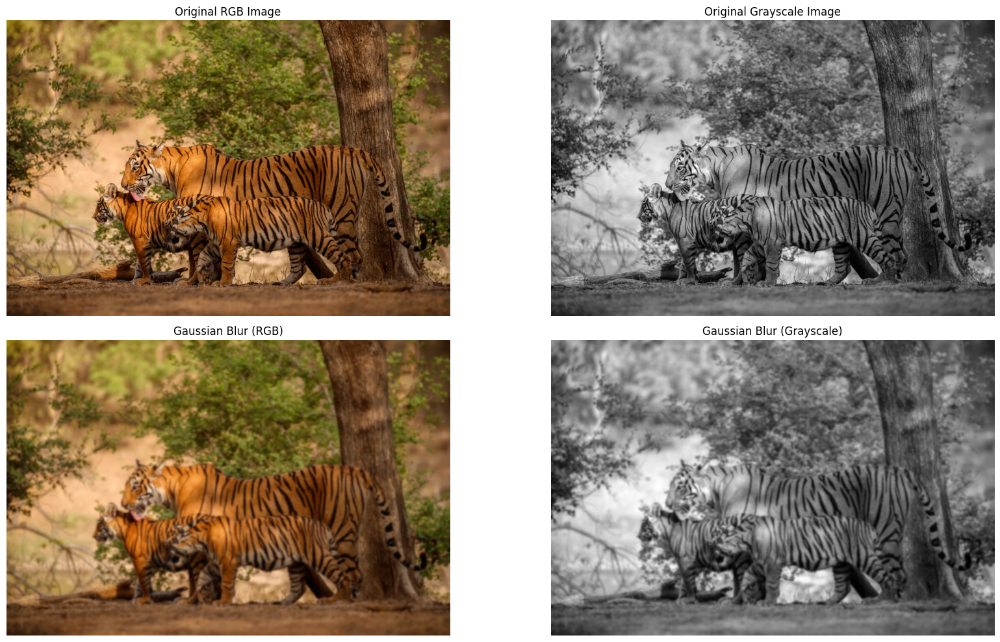

In [22]:
ksize = 13
sigma = 2.0

# Gaussian kernel
g_kernel = gaussian_kernel(ksize, sigma)

# Gaussian blur on grayscale
gaussian_gray = convolve(gray_img, g_kernel)

# Gaussian blur on RGB
gaussian_rgb = gaussian_blur_rgb(img_np, ksize, sigma)


# Display

import matplotlib.pyplot as plt

plt.figure(figsize=(18, 10))

# Original RGB
plt.subplot(2, 2, 1)
plt.imshow(img_np)
plt.title("Original RGB Image")
plt.axis("off")

# Original Grayscale
plt.subplot(2, 2, 2)
plt.imshow(gray_img, cmap='gray')
plt.title("Original Grayscale Image")
plt.axis("off")

# Gaussian Blur - RGB
plt.subplot(2, 2, 3)
plt.imshow(np.clip(gaussian_rgb, 0, 255).astype(np.uint8))
plt.title("Gaussian Blur (RGB)")
plt.axis("off")

# Gaussian Blur - Grayscale
plt.subplot(2, 2, 4)
plt.imshow(gaussian_gray, cmap='gray')
plt.title("Gaussian Blur (Grayscale)")
plt.axis("off")

plt.tight_layout()
plt.show()

### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [ ]:
# Your PART B codes follow here. You can create more cells under this. Write clean and commented code.

In [25]:
# Sobel kernels
sobel_x = np.array([
    [-1,  0,  1],
    [-2,  0,  2],
    [-1,  0,  1]
], dtype=np.float32)

sobel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)

# Applying Sobel filters using convolution
Gx = convolve(gray_img, sobel_x)
Gy = convolve(gray_img, sobel_y)

# Gradient magnitude = sqrt(Gx^2 + Gy^2)
gradient_magnitude = np.sqrt(Gx**2 + Gy**2)

# Normalizing Gradient to 0–255 => Why?
# Sobel output values can exceed 255. Thus,for proper visualization, we normalize
# Normalize to range 0–255
grad_norm = (gradient_magnitude / gradient_magnitude.max()) * 255
grad_norm = grad_norm.astype(np.uint8)

# Binary thresholding

threshold = 80
# Any pixel with gradient magnitude >= 80 will be considered an edge
edges_thresh = np.zeros_like(grad_norm)
# Creates a new image with: Same shape as grad_norm. All values initialized to 0
edges_thresh[grad_norm >= threshold] = 255
# We are preparing a blank canvas where: 0 -> non-edge (black) and 255 -> edge (white)

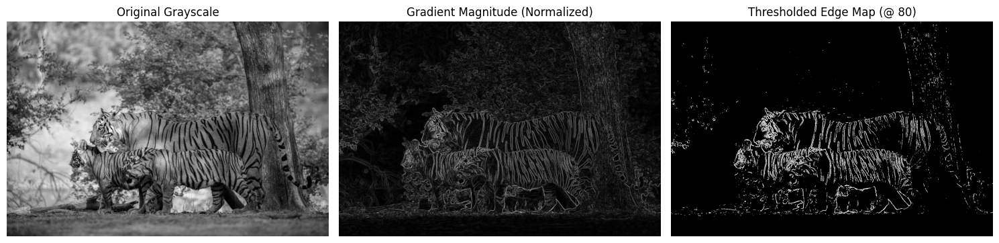

In [27]:
plt.figure(figsize=(15, 5))

# Original Grayscale
plt.subplot(1, 3, 1)
plt.imshow(gray_img, cmap='gray')
plt.title("Original Grayscale")
plt.axis("off")

# Gradient Magnitude (Normalized)
plt.subplot(1, 3, 2)
plt.imshow(grad_norm, cmap='gray')
plt.title("Gradient Magnitude (Normalized)")
plt.axis("off")

# Thresholded Edge Map
plt.subplot(1, 3, 3)
plt.imshow(edges_thresh, cmap='gray')
plt.title("Thresholded Edge Map (@ 80)")
plt.axis("off")

plt.tight_layout()
plt.show()

### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [ ]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

In [36]:
#Task 1

# 4-connected Laplacian kernel

laplacian_kernel = np.array([
    [ 0, -1,  0],
    [-1,  4, -1],
    [ 0, -1,  0]
], dtype=np.float32)

# Computed Laplacian using custom convolution
lap = convolve(gray_img, laplacian_kernel)
# lap represents:-
# -> Second-order derivative
# -> approx. zero in flat regions
# -> High +ve/-ve values at edges
# -> Contains only high-frequency information

alpha = 0.5
sharp_lap = gray_img.astype(np.float32) - alpha * lap
sharp_lap = np.clip(sharp_lap, 0, 255).astype(np.uint8)

In [38]:
# putting alpha=1
alpha = 1.0
sharp_lap_alpha1 = gray_img.astype(np.float32) - lap
sharp_lap_alpha1 = np.clip(sharp_lap_alpha1, 0, 255).astype(np.uint8)

In [39]:
# Laplacian Sharpening using OpenCV (Lecture's Code)
lap_cv = cv2.Laplacian(gray_img, cv2.CV_32F)

sharp_cv = gray_img.astype(np.float32) - lap_cv
sharp_cv = np.clip(sharp_cv, 0, 255).astype(np.uint8)

In [40]:
# Verifying NumPy vs OpenCV Output

# Matrix comparison
are_equal = np.array_equal(sharp_lap_alpha1, sharp_cv)
print("Are NumPy and OpenCV outputs exactly equal?", are_equal)

# Seeing the output as "False", we can say it is due to different kernels used

Are NumPy and OpenCV outputs exactly equal? False


In [49]:
# Task 2

#Applying Gaussian blur
ksize = 10
sigma = 1.5

gaussian_k = gaussian_kernel(ksize, sigma)
blurred = convolve(gray_img, gaussian_k)

# mask = img - blurred
mask = gray_img.astype(np.float32) - blurred

# sharp = img + alpha * mask , where you can choose any value of alpha
alpha = 3.5
sharp_unsharp = gray_img.astype(np.float32) + alpha * mask
sharp_unsharp = np.clip(sharp_unsharp, 0, 255).astype(np.uint8)

In [52]:
# Negative Alpha -> Blur

alpha_neg = -0.5
blurred_again1 = gray_img.astype(np.float32) + alpha_neg * mask
blurred_again1 = np.clip(blurred_again1, 0, 255).astype(np.uint8)

alpha_neg = -2.5
blurred_again2 = gray_img.astype(np.float32) + alpha_neg * mask
blurred_again2 = np.clip(blurred_again2, 0, 255).astype(np.uint8)

alpha_neg = -4.5
blurred_again3 = gray_img.astype(np.float32) + alpha_neg * mask
blurred_again3 = np.clip(blurred_again3, 0, 255).astype(np.uint8)

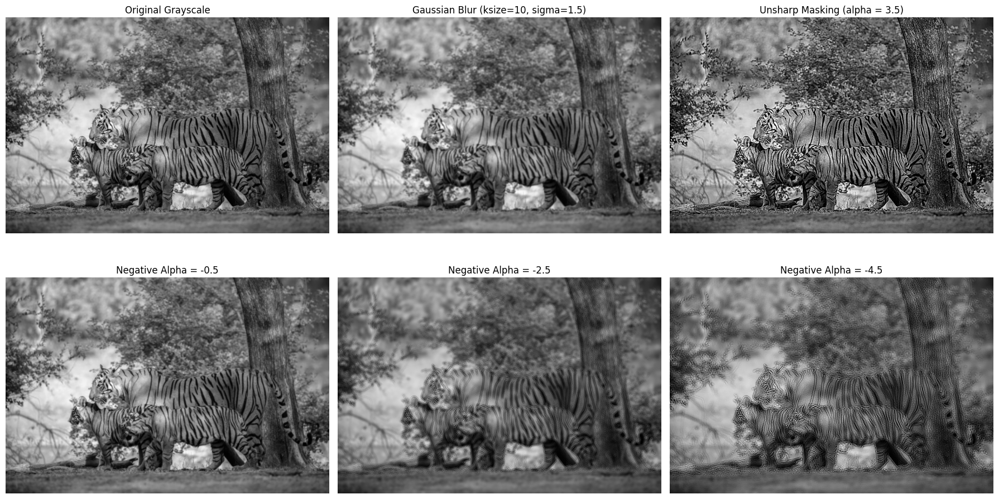

In [53]:
plt.figure(figsize=(18, 10))

# Original grayscale
plt.subplot(2, 3, 1)
plt.imshow(gray_img, cmap='gray')
plt.title("Original Grayscale")
plt.axis("off")

# Gaussian blurred
plt.subplot(2, 3, 2)
plt.imshow(blurred, cmap='gray')
plt.title("Gaussian Blur (ksize=10, sigma=1.5)")
plt.axis("off")

# Unsharp masking (positive alpha)
plt.subplot(2, 3, 3)
plt.imshow(sharp_unsharp, cmap='gray')
plt.title("Unsharp Masking (alpha = 3.5)")
plt.axis("off")

# Negative alpha results (progressive blur)
plt.subplot(2, 3, 4)
plt.imshow(blurred_again1, cmap='gray')
plt.title("Negative Alpha = -0.5")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(blurred_again2, cmap='gray')
plt.title("Negative Alpha = -2.5")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(blurred_again3, cmap='gray')
plt.title("Negative Alpha = -4.5")
plt.axis("off")

plt.tight_layout()
plt.show()


### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [ ]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

In [61]:
def magnitude_spectrum(img):
    # Convert image to float for FFT
    img_f = img.astype(np.float32)

    # Compute 2D FFT
    fft = np.fft.fft2(img_f)

    # Shift zero frequency to center
    fft_shift = np.fft.fftshift(fft)

    # Compute magnitude spectrum (log for visibility)
    magnitude = np.log(1 + np.abs(fft_shift))

    return magnitude

mag_original = magnitude_spectrum(gray_img)


# Different Gaussian blur configurations (LPF)
gaussian_params = [
    (5, 1.0),
    (9, 2.0),
    (15, 3.0)
]

gaussian_results = []

for ksize, sigma in gaussian_params:
    kernel = gaussian_kernel(ksize, sigma)
    blurred_img = convolve(gray_img, kernel)
    mag_blur = magnitude_spectrum(blurred_img)
    gaussian_results.append((ksize, sigma, blurred_img, mag_blur))



# Base Gaussian blur for unsharp masking
base_kernel = gaussian_kernel(9, 2.0)
base_blur = convolve(gray_img, base_kernel)

mask = gray_img.astype(np.float32) - base_blur

# Different alpha values (HPF strength)
alpha_values = [0.5, 1.5, 3.0]

unsharp_results = []

for alpha in alpha_values:
    sharp_img = gray_img.astype(np.float32) + alpha * mask
    sharp_img = np.clip(sharp_img, 0, 255).astype(np.uint8)
    mag_sharp = magnitude_spectrum(sharp_img)
    unsharp_results.append((alpha, sharp_img, mag_sharp))

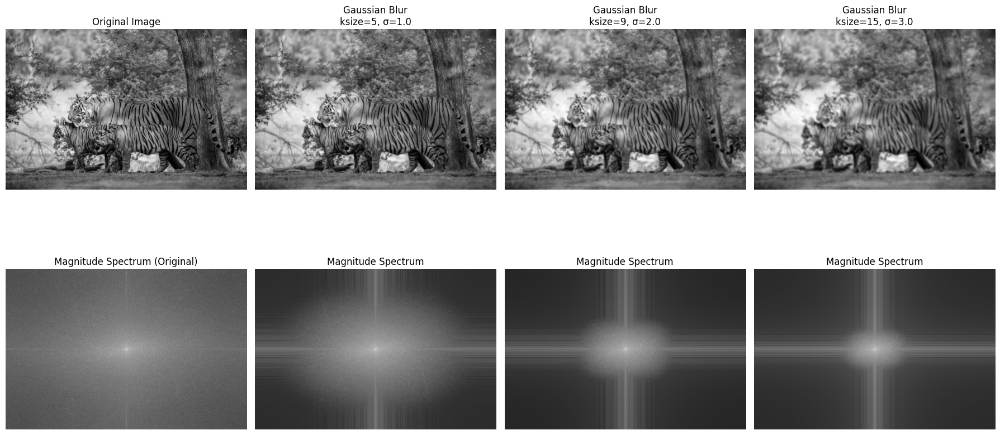

In [62]:
plt.figure(figsize=(18, 10))

# Original image and spectrum
plt.subplot(2, 4, 1)
plt.imshow(gray_img, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(mag_original, cmap='gray')
plt.title("Magnitude Spectrum (Original)")
plt.axis("off")

# Gaussian blur experiments
for i, (ksize, sigma, blur_img, mag_blur) in enumerate(gaussian_results):
    plt.subplot(2, 4, i+2)
    plt.imshow(blur_img, cmap='gray')
    plt.title(f"Gaussian Blur\nksize={ksize}, σ={sigma}")
    plt.axis("off")

    plt.subplot(2, 4, i+6)
    plt.imshow(mag_blur, cmap='gray')
    plt.title("Magnitude Spectrum")
    plt.axis("off")

plt.tight_layout()
plt.show()

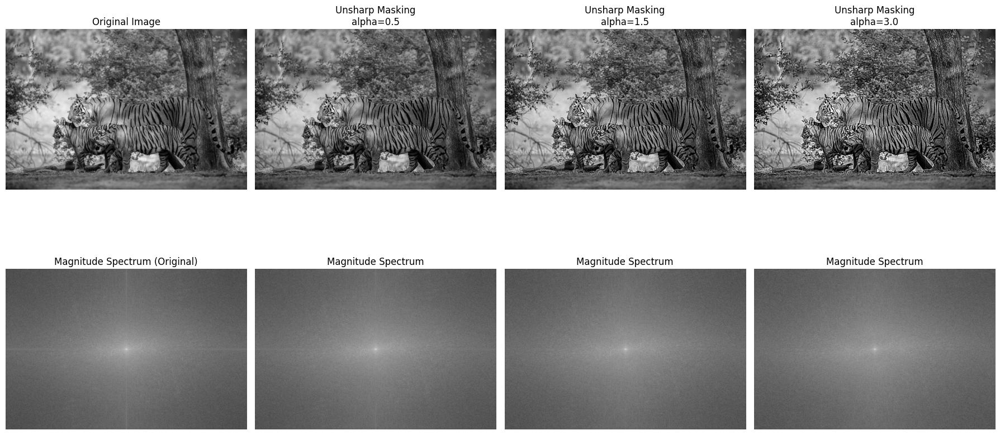

In [63]:
plt.figure(figsize=(18, 10))

# Original reference
plt.subplot(2, 4, 1)
plt.imshow(gray_img, cmap='gray')
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 4, 5)
plt.imshow(mag_original, cmap='gray')
plt.title("Magnitude Spectrum (Original)")
plt.axis("off")

# Unsharp masking experiments
for i, (alpha, sharp_img, mag_sharp) in enumerate(unsharp_results):
    plt.subplot(2, 4, i+2)
    plt.imshow(sharp_img, cmap='gray')
    plt.title(f"Unsharp Masking\nalpha={alpha}")
    plt.axis("off")

    plt.subplot(2, 4, i+6)
    plt.imshow(mag_sharp, cmap='gray')
    plt.title("Magnitude Spectrum")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [64]:
# OBSERVATIONS:

# 1. Original Image:
#    - Bright center in spectrum -> dominant low frequencies
#    - Gradual fall-off -> natural image statistics

# 2. Gaussian Blur (Low-Pass Filter Behaviour):
#    - Increasing kernel size or sigma makes outer regions darker
#    - High-frequency components (edges, textures) are suppressed
#    - Confirms Gaussian blur acts as a LOW-PASS FILTER

# 3. Unsharp Masking (High-Pass Filter Behaviour):
#    - Increasing alpha brightens outer regions of spectrum
#    - High-frequency energy is amplified
#    - Confirms unsharp masking boosts HIGH-FREQUENCY components

# 4. Frequency Interpretation:
#    - Center of spectrum -> low frequencies (smooth regions)
#    - Far from center -> high frequencies (edges, fine details)

### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

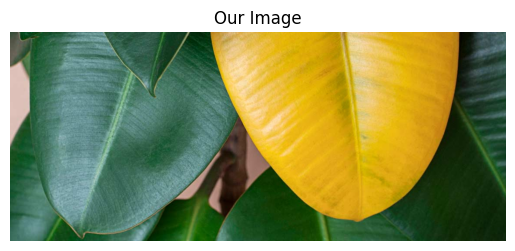

In [57]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [66]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

In [65]:
# Yellow: R -> high, G -> high, B -> low
# Green: R -> low, G -> high, B -> low

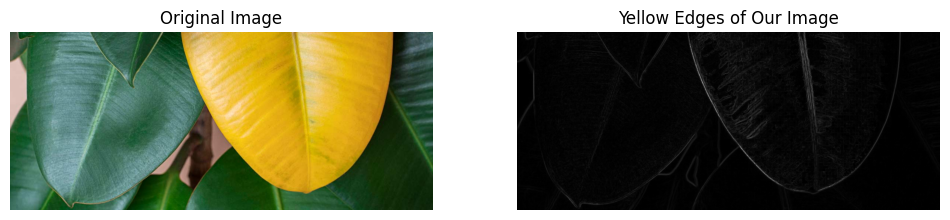

In [82]:
yellow_mask = (
    (img_part5[:, :, 0] > 150) &   # Red channel high
    (img_part5[:, :, 1] > 150) &   # Green channel high
    (img_part5[:, :, 2] < 120)     # Blue channel low
)

# Extracting RGB channels and converting to float
R = img_part5[:, :, 0].astype(np.float64)
G = img_part5[:, :, 1].astype(np.float64)
B = img_part5[:, :, 2].astype(np.float64)

# Applying Sobel filters on each color channel separately
# This captures spatial intensity changes per channel
Gx_R = convolve(R, sobel_x)
Gy_R = convolve(R, sobel_y)

Gx_G = convolve(G, sobel_x)
Gy_G = convolve(G, sobel_y)

Gx_B = convolve(B, sobel_x)
Gy_B = convolve(B, sobel_y)


# Computing combined gradient magnitude
# The gradients from all RGB channels are combined to capture color edges where any channel changes strongly
combined_mag = np.sqrt(
    Gx_R**2 + Gy_R**2 +
    Gx_G**2 + Gy_G**2 +
    Gx_B**2 + Gy_B**2
)


# Soft weighting using the yellow mask
# Instead of hard masking (which can break edges), we'll boost gradients in yellow regions while still retaining weak boundary continuity
#   yellow_mask = 1  → weight = 1.0
#   yellow_mask = 0  → weight = 0.25
combined_mag = combined_mag * (0.25 + 0.75 * yellow_mask)


# Normalizing
normalized_ourimg = combined_mag / np.max(combined_mag)
normalized_ourimg = (normalized_ourimg * 255).astype(np.uint8)

# Display
plt.figure(figsize=(12, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.axis("off")
plt.title("Original Image")

# Processed image
plt.subplot(1, 2, 2)
plt.imshow(normalized_ourimg, cmap='gray')
plt.axis("off")
plt.title("Yellow Edges of Our Image")

plt.show()

### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
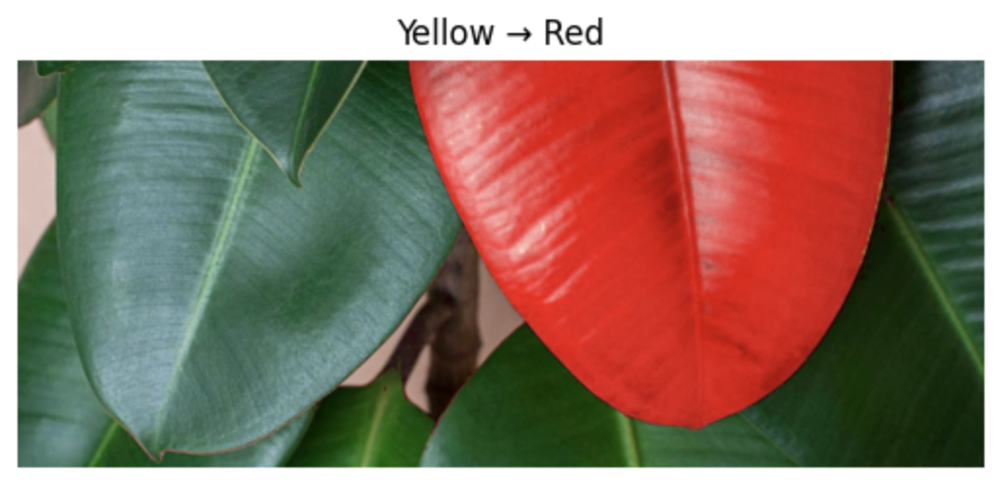

Also, we can change to a less brighter colour
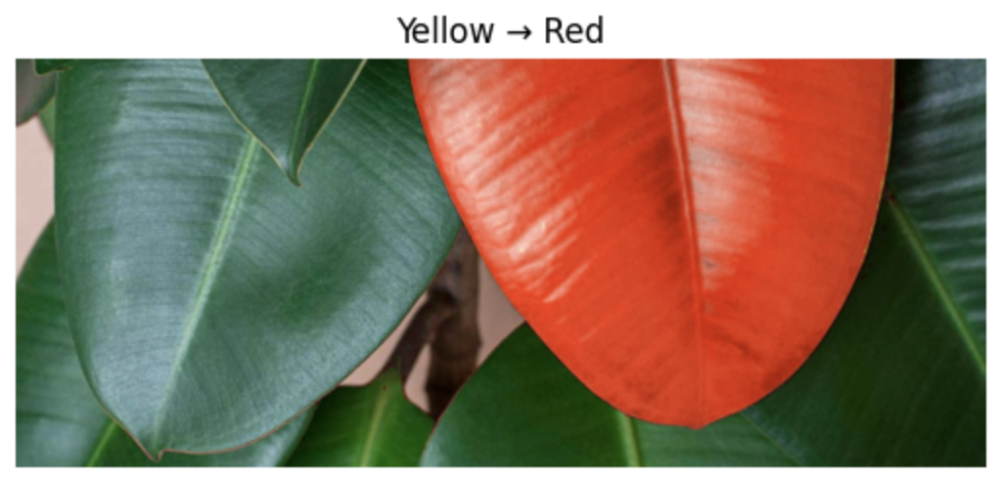

In [ ]:
# Your BONUS PART codes follow here. You can create more cells under this. Write clean and commented code.

In [ ]:
# To change yellow -> red, we:
# 1. Convert RGB -> HSV
# 2. Detect yellow hue range
# 3. Replace Hue with red
# 4. Convert HSV -> RGB

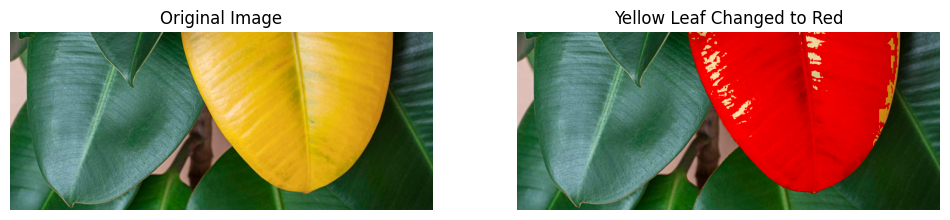

In [84]:
hsv = cv2.cvtColor(img_part5, cv2.COLOR_RGB2HSV)   # RGB -> HSV

# Defined yellow range in HSV
lower_yellow = np.array([20, 100, 100])
upper_yellow = np.array([35, 255, 255])
yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)


hsv_red = hsv.copy()

# Set Hue to red where mask is true
hsv_red[yellow_mask > 0, 0] = 0      # Hue -> Red
hsv_red[yellow_mask > 0, 1] = 255
red_leaf_rgb = cv2.cvtColor(hsv_red, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_part5)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(red_leaf_rgb)
plt.title("Yellow Leaf Changed to Red")
plt.axis("off")

plt.show()